 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment 02 - Regression : </b> Welcome to the programming assignment (PA) on regression. This programing assignment focuses on understanding the basic concepts of linear regression.

<b> Instructions </b>

1. Plagiarism is strictly prohibited.
2. Delayed submissions are not accepted
3. Please DO NOT use any machine learning libraries unless and otherwise specified.


<center> <h2> <b> Understanding Basic Concepts </b> </h2> </center>

<b> Part - (1) : Understanding Error Surfaces </b>

According to www.geogebra.org, the relationship between human height (in
inches) and weight (in pounds) is given by <br>

<div align="center">

$$
\mathbf{w}_{\text{opt}} = 3.86x - 110.42
$$

</div>

(a) Generate 25 meaningful data points from this relationship, mimicking a
noisy sensor, where the noise follows a zero mean Gaussian with a variance
of 20. Plot the scatter plot of the data. <br>
(b) Now, we need to estimate the above relationship from the noisy data
generated in (a) by fitting a line, i.e $\hat{t} = y(x,w) = w_{0} + w_{1}x$. Let us use least squares criterion discussed in the class to estimate the parameters $w_{0}$ and $w_{1}$. Generate and plot the error surface $J(w_{0},w_{1})$ associated with this approach. Locate the minimum on this error surface.<br>

(c) Estimate the parameters using least squares approach, and compare them
with the desired values.

$$
\mathbf{w}_{\text{opt}} = (\mathbf{X}^{T} \mathbf{X})^{-1} \mathbf{X}^{T} \mathbf{t}
$$

(d) Report all your observations


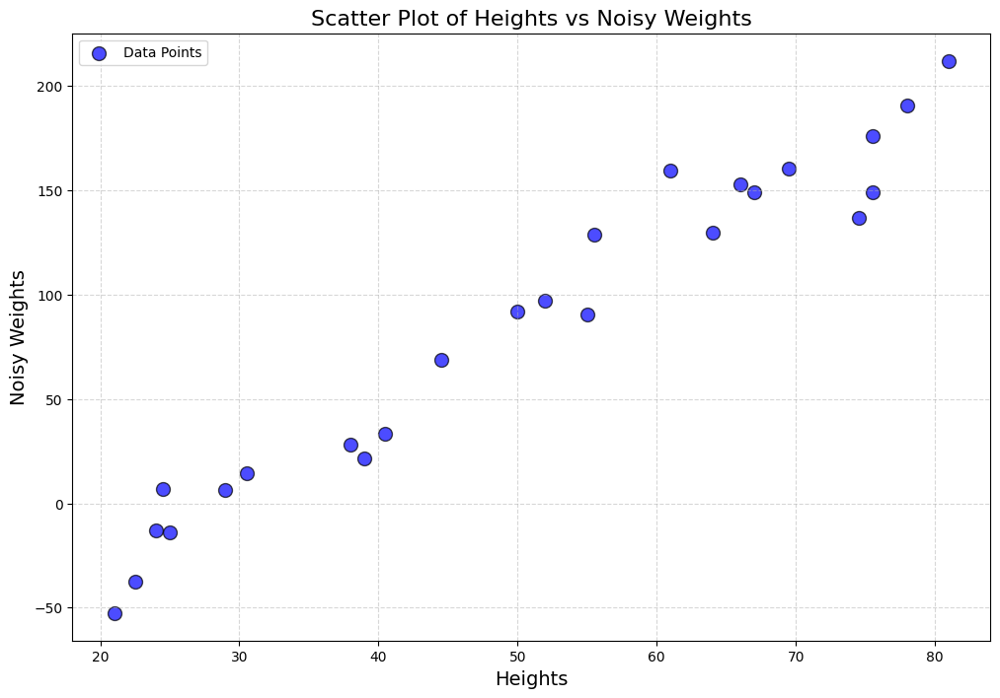

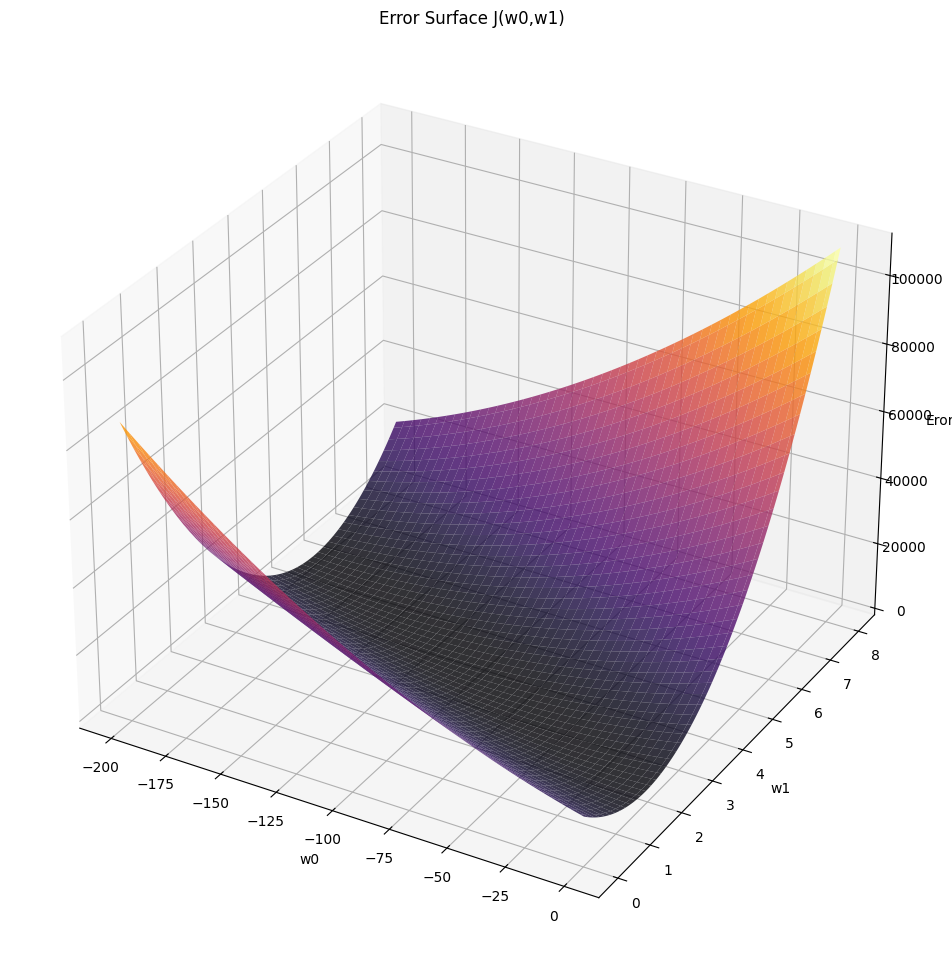

Optimal values of w0 = -109.0909, w1 = 3.7980


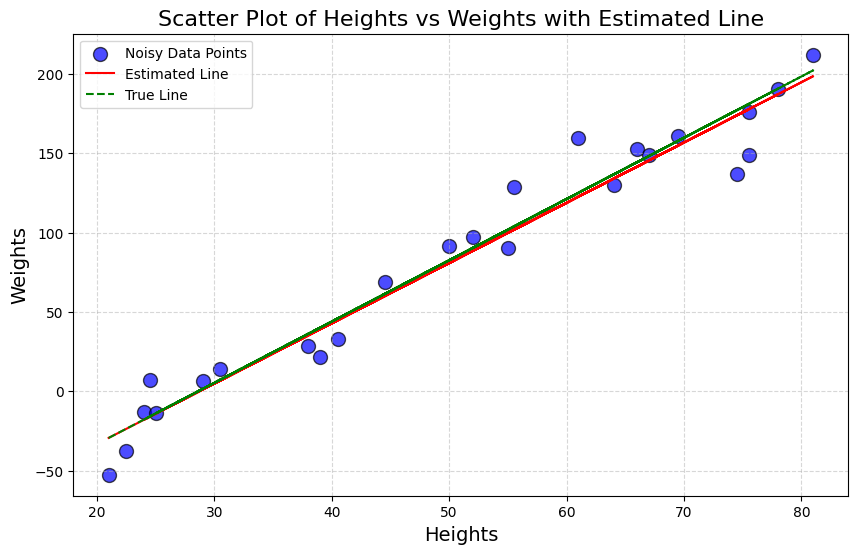

Estimated weights from least squares calculation are w0 = -108.6500 , w1 = 3.8034


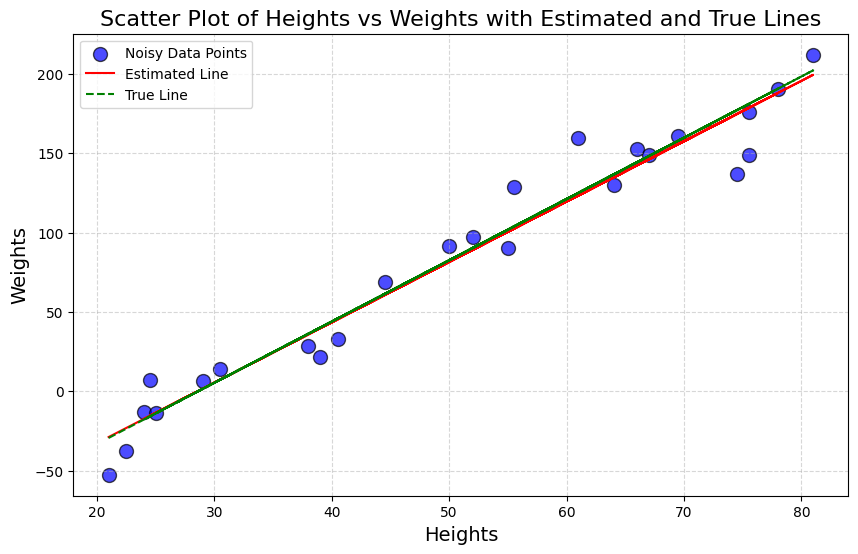

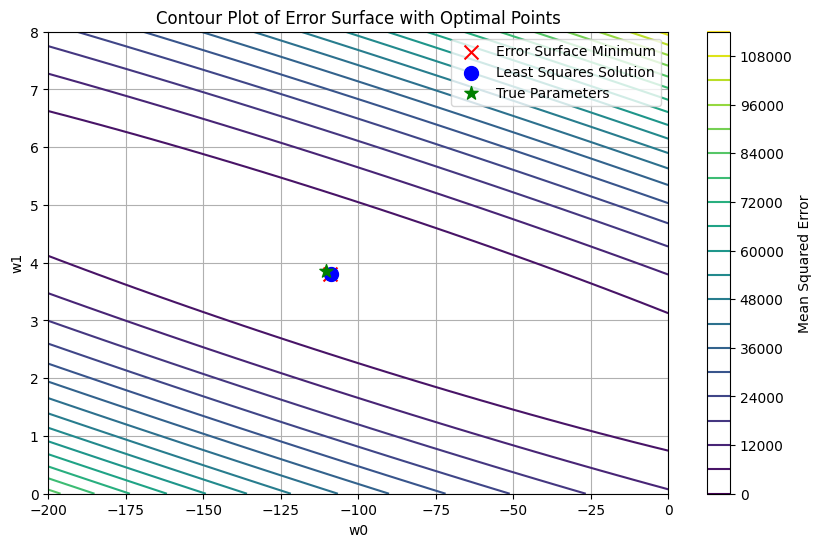

Weight result Comparision
Error Surface Approach w0 =-109.0909, w1 = 3.7980 
Least Squares Approach w0 = -108.6500 , w1 = 3.8034

Mean Squared Error:
Error Surface Approach: 275.6759
Least Squares Approach: 275.1544


In [1]:
#Understanding Error Surface
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

########################################
#Generate meaningfull data
########################################

def true_weight(height):
    return 3.86 * height - 110.42


heights = np.random.randint(40, 170, 25)/2
weights = np.array([true_weight(h) for h in heights])


mean_nois = 0
variance_noise = 20
noise = np.random.normal(mean_nois, variance_noise, 25)


weights_modified = weights + noise

# np.random.seed(42)

########################################
#Plot scatter plot of data
########################################

plt.figure(figsize=(12, 8))
plt.scatter(heights, weights_modified, color='blue', marker='o', edgecolor='black', s=100, alpha=0.7, label='Data Points')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('Heights', fontsize=14)
plt.ylabel('Noisy Weights', fontsize=14)
plt.title('Scatter Plot of Heights vs Noisy Weights', fontsize=16)
plt.legend()
plt.show()


########################################
#Weight estimation through error surface, i.e., empirically locate the minima of error surface
########################################
#Sample a bunch of w's around w_opt and compute the associated error

w0_range = np.linspace(-200, 0, 100)  # Focus more around -110
w1_range = np.linspace(0, 8, 100)       # Focus more around 3.86

w0_grid,w1_grid = np.meshgrid(w0_range,w1_range)

#Compute the error
def Error(w0,w1,t,x): #inputs : 1)weight 2)data i.e (t,x)
    y = w0 + w1*x
    ls_error = np.mean((t-y)**2)
    return ls_error

error_plot = np.zeros_like(w0_grid)
for i in range(len(w0_range)):
    for j in range(len(w1_range)):
        error_plot[j][i] = Error(w0_grid[j][i], w1_grid[j][i], weights_modified, heights)

#Plot 3D error surface and the corresponding contour plots
#Error surface is a function of w0 and w1
fig = plt.figure(figsize = (12,12))
axes = fig.add_subplot(111,projection = '3d')
surface = axes.plot_surface(w0_grid,w1_grid,error_plot,cmap='inferno',alpha = 0.8)
axes.set_xlabel('w0')
axes.set_ylabel('w1')
axes.set_zlabel('Eror')
axes.set_title('Error Surface J(w0,w1)')
plt.show()


#Locate the minima of the error surface
least_index = np.unravel_index(np.argmin(error_plot),error_plot.shape)# finds the least index where lse error is min
w0_opt = w0_range[least_index[1]]
w1_opt = w1_range[least_index[0]]

print(f"Optimal values of w0 = {w0_opt :.4f}, w1 = {w1_opt:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(heights, weights_modified, color='blue', marker='o', edgecolor='black', s=100, alpha=0.7, label='Noisy Data Points')
plt.plot(heights, w0_opt + w1_opt * heights, color='red', label='Estimated Line')
plt.plot(heights, true_weight(heights), color='green', linestyle='--', label='True Line')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('Heights', fontsize=14)
plt.ylabel('Weights', fontsize=14)
plt.title('Scatter Plot of Heights vs Weights with Estimated Line', fontsize=16)
plt.legend()
plt.show()


########################################
#Least squares approach to estimate the weights
########################################
#Complete the below linear regression function
def LinearRegression(x,t): #inputs : 1)input data i.e (x). 2)target i.e (t)
    aug_X = np.vstack((np.ones(len(x)),x)).T # augmented input
    w_opt = np.linalg.inv(aug_X.T @ aug_X) @ aug_X.T @ t
    return w_opt


#Estimate optimal weight's using "LinearRegression" function
w_opt = LinearRegression(heights, weights_modified)
print(f"Estimated weights from least squares calculation are w0 = {w_opt[0]:.4f} , w1 = {w_opt[1]:.4f}")


#Estimate the targets using the input x and the estimated weights
estimated_weights = w_opt[0] + w_opt[1] * heights


# Calculate the true weights (expected line)
true_weights = true_weight(heights)

plt.figure(figsize=(10, 6))
plt.scatter(heights, weights_modified, color='blue', marker='o', edgecolor='black', s=100, alpha=0.7, label='Noisy Data Points')
plt.plot(heights, estimated_weights, color='red', label='Estimated Line')
plt.plot(heights, true_weights, color='green', linestyle='--', label='True Line')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('Heights', fontsize=14)
plt.ylabel('Weights', fontsize=14)
plt.title('Scatter Plot of Heights vs Weights with Estimated and True Lines', fontsize=16)
plt.legend()
plt.show()

# Contour plot of the error surface
plt.figure(figsize=(10, 6))
contour = plt.contour(w0_grid, w1_grid, error_plot, 20, cmap='viridis')
plt.colorbar(contour, label='Mean Squared Error')
plt.scatter(w0_opt, w1_opt, color='red', marker='x', s=100, label='Error Surface Minimum')
plt.scatter(w_opt[0], w_opt[1], color='blue', marker='o', s=100, label='Least Squares Solution')
plt.scatter(-110.42, 3.86, color='green', marker='*', s=100, label='True Parameters')
plt.xlabel('w0')
plt.ylabel('w1')
plt.title('Contour Plot of Error Surface with Optimal Points')
plt.legend()
plt.grid(True)
plt.show()

########################################
#Compare the estimated weight's using least squares approach with the error surface approach
########################################≠≠

print(f"Weight result Comparision")
print(f"Error Surface Approach w0 ={w0_opt:.4f}, w1 = {w1_opt:.4f} ")
print(f"Least Squares Approach w0 = {w_opt[0]:.4f} , w1 = {w_opt[1]:.4f}")

# Add after your comparison print statements
error_surface_predictions = w0_opt + w1_opt * heights
least_squares_predictions = w_opt[0] + w_opt[1] * heights

mse_error_surface = np.mean((weights_modified - error_surface_predictions)**2)
mse_least_squares = np.mean((weights_modified - least_squares_predictions)**2)

print(f"\nMean Squared Error:")
print(f"Error Surface Approach: {mse_error_surface:.4f}")
print(f"Least Squares Approach: {mse_least_squares:.4f}")


<b> Report your observations </b>

1.  In the Error Surface Approach the resulting line was
    $$
    \mathbf{w}_{\text{opt}} = 4.04x - 121.21
    $$

In the Least Squares Approach the resulting line was

$$
\mathbf{w}_{\text{opt}} = 4.06x - 121.95
$$

Since we added noise to the data to proceed with the estimation there is a slight deviation from the original line this could also be due to considering only 25 points.

2.  The error surface is a convex surface and has only one minima as expected from the least squares approach ( least squares error surfaces are convex)

3.  As mentioned above the gaussian noise slightly affected the parameter estimation but it is not significant .
4.  We can see that the minimum in the error surface matches pretty closely with the least squares solution


<b> Part - (2) : Understanding model order and overfitting </b>

(a). Generate 20 data points from $t_{n} = sin(2πx_{n}) + e_{n}$, where $x_{n} \in [0,1] $ and $e_{n} \thicksim \mathcal{N} (0,0.1)$ , and divide them into two sets, a training set and a testing set, with each set containing 10 points <br>

(b). Fit an $M^{th}$ degree polynomial to the training data using least squares approach, i.e.,

<div align="center">

$$
\hat{t}_{n} = w_{0} + w_{1}x + \dots + w_{m}x^{m} + \dots + w_{M}x^{M}
$$

</div>

Use the estimated parameter vector $\textbf{w}$, to predict the target values in training and testing datasets. Plot the root mean squared error associated with each dataset, for M=0,1,...,9. Explain your results. <br>

(c) Increase the size of the training dataset to 100 points, and repeat (b). <br>

(d) Add a $l_{2}$ regularization term to the objective function in (b) and repeat (b) and (c). Study the affect of Lagrange multiplier λ on the root mean squared error of the training and testing datasets <br>

(e) Modify the function in (a) to $t_{n}=5+sin(2πx_{n})+e_{n}$ to study the effect of regularizing the bias coefficient $w_{0}$.

(f) Report all your observations


[0.53138308 0.68505182 0.99667421 0.99042735 0.00506345 0.72605002
 0.48221163 0.69567289 0.69687344 0.16591207 0.71318482 0.766656
 0.61017784 0.59242094 0.19109685 0.50515197 0.96098863 0.39629574
 0.50654472 0.04995355]


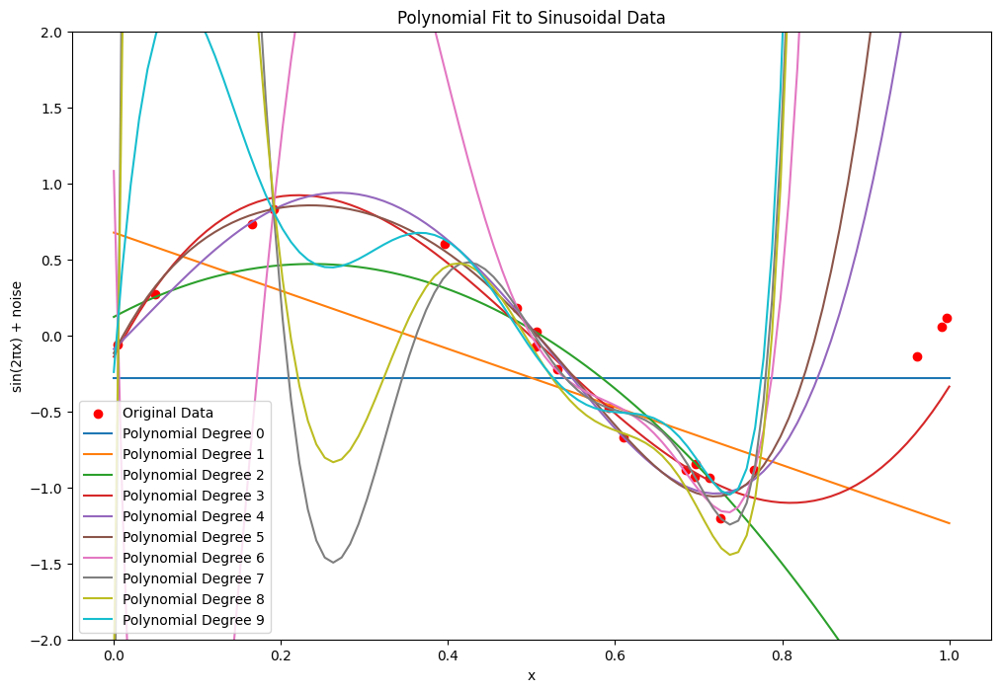

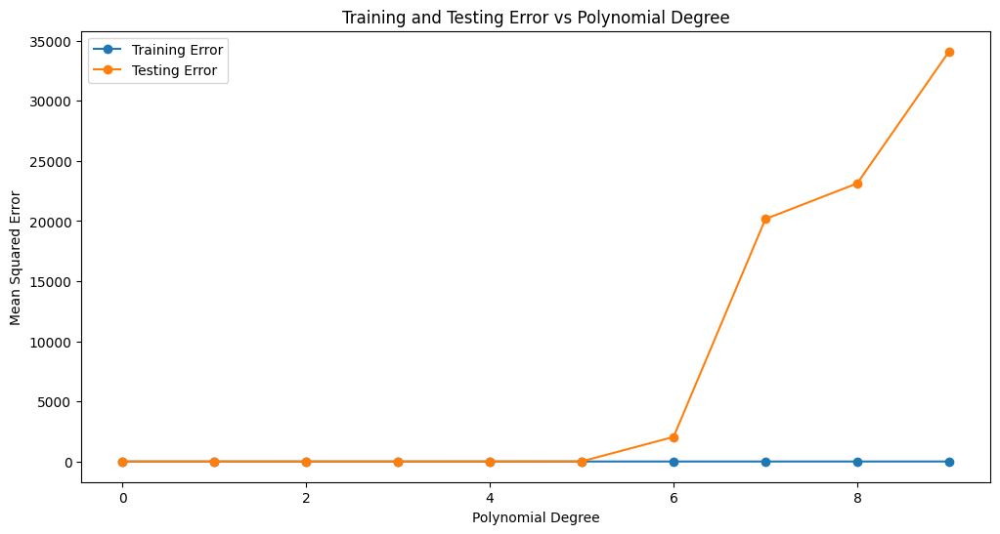

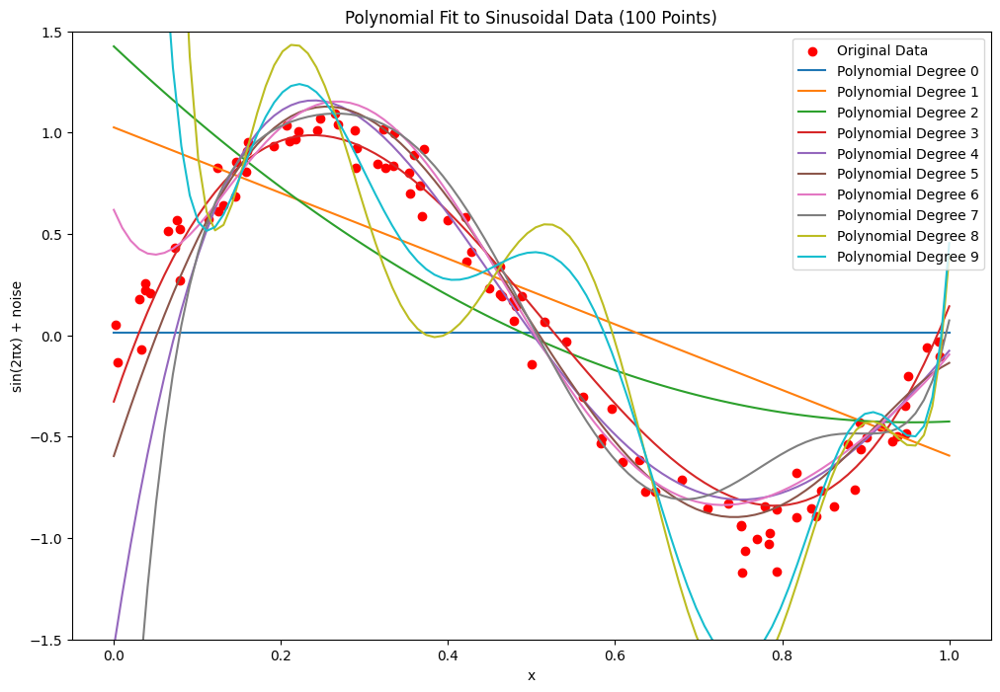

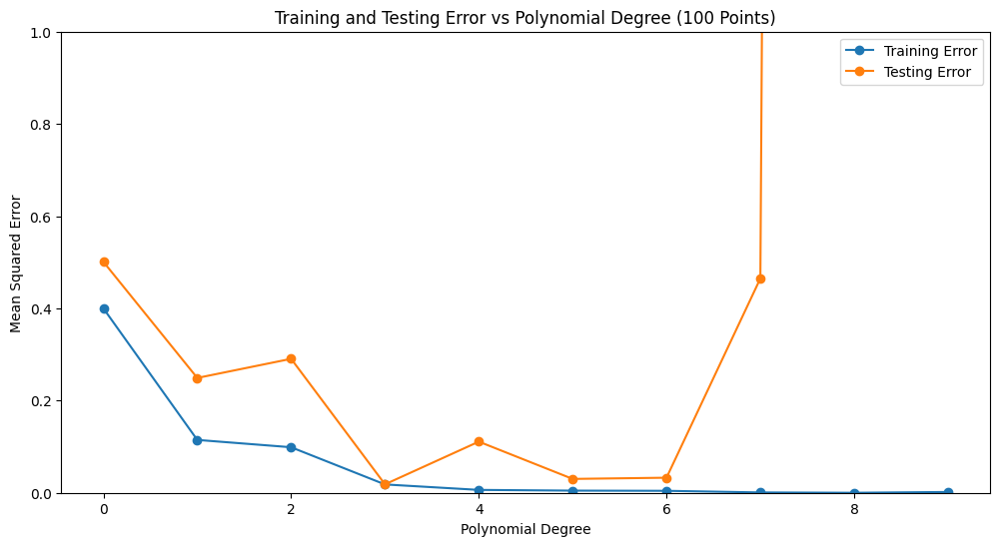

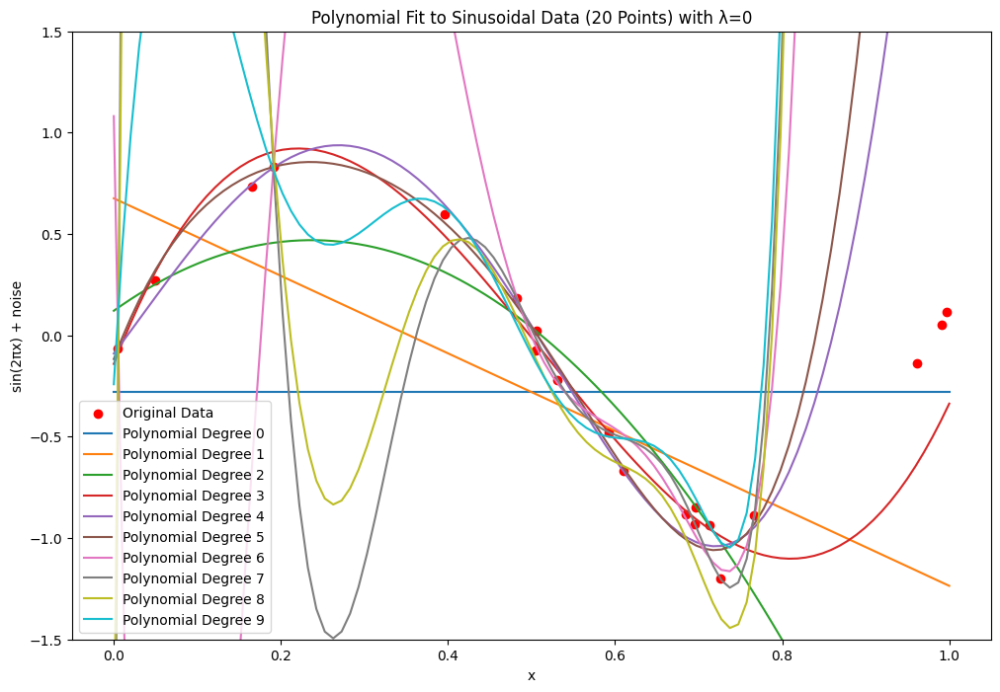

...

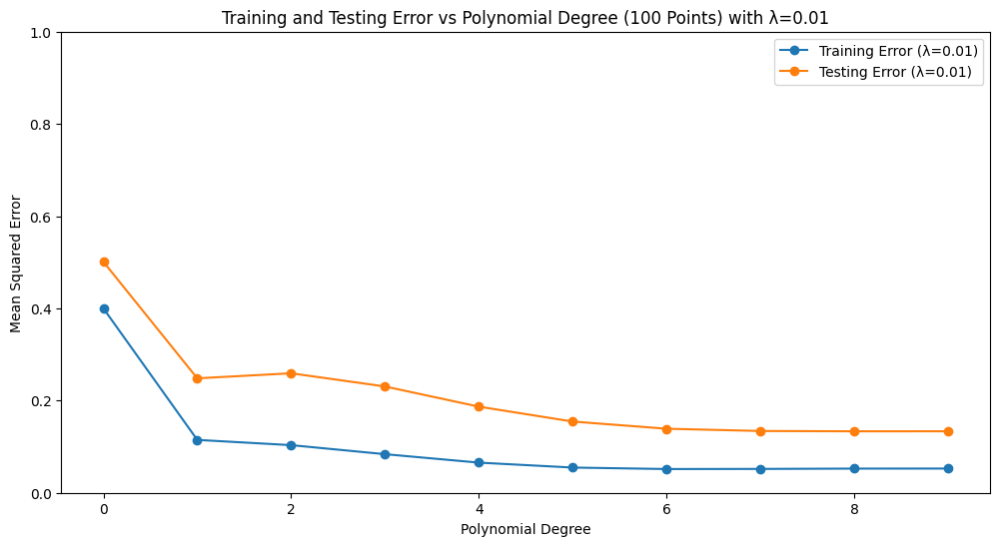

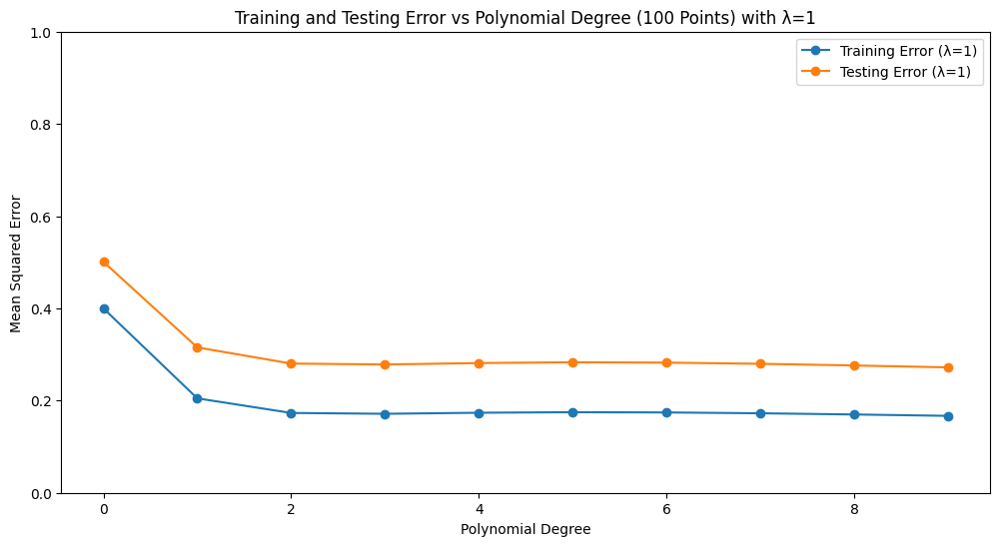

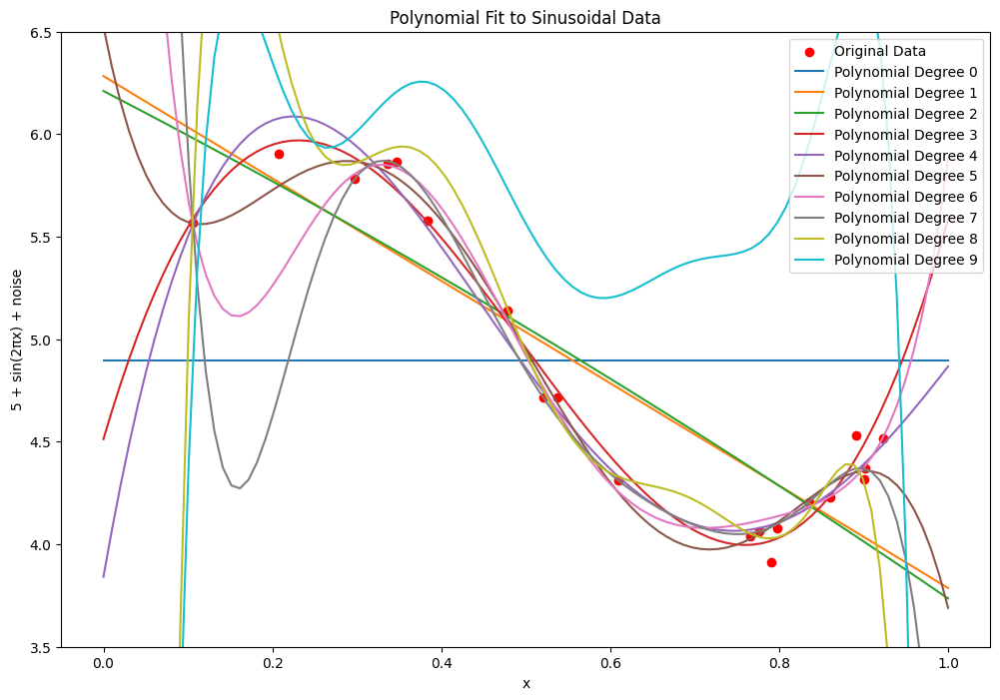

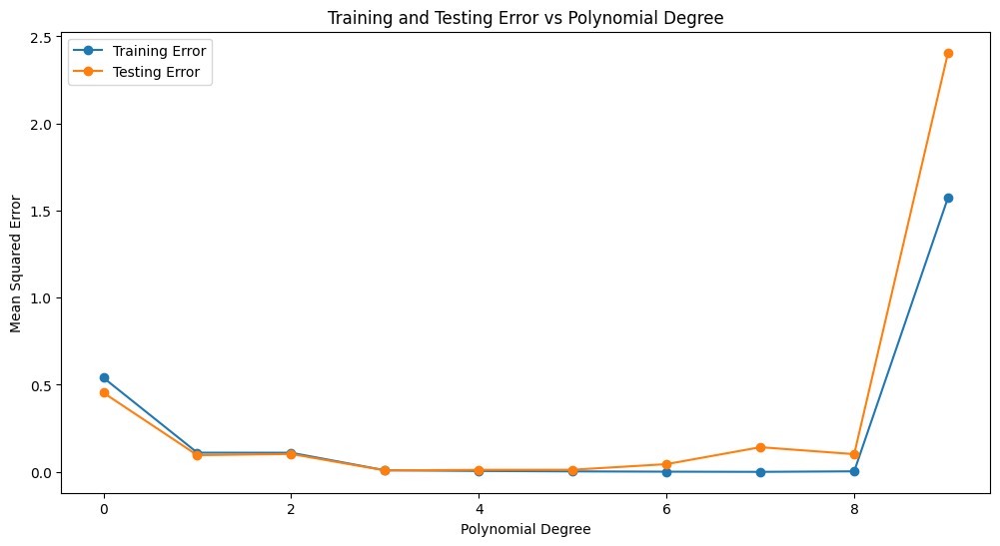

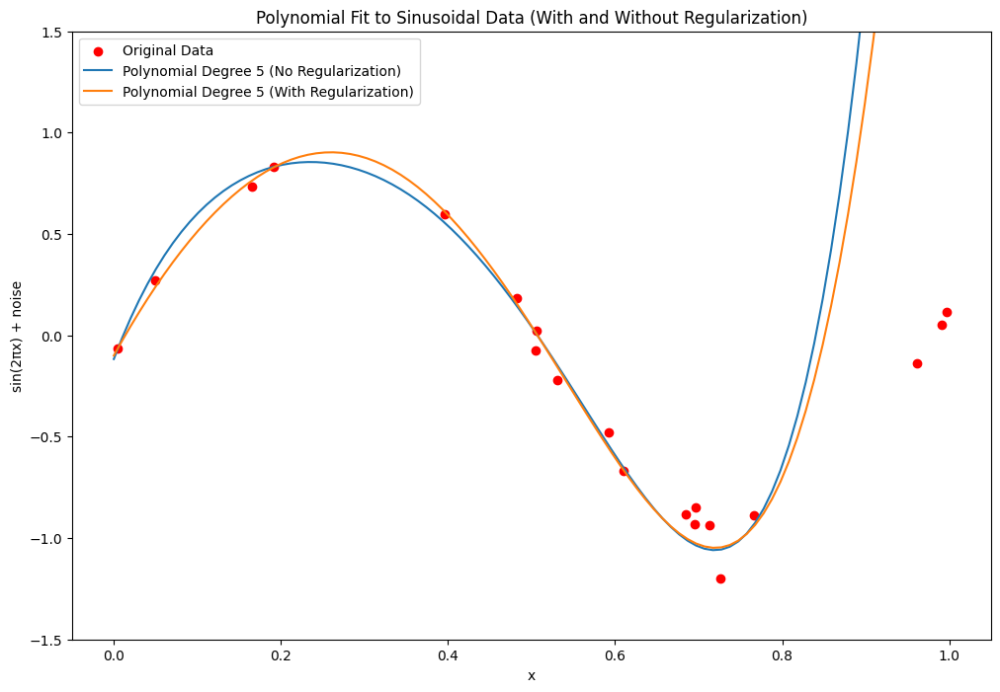

Training Error (No Regularization): 0.004974719699273815
Testing Error (No Regularization): 11.000058039526182
Training Error (With Regularization): 0.005064133628595692
Testing Error (With Regularization): 5.681566086339888


In [2]:
#Understanding model order and overfitting
########################################
#Generate 20 data points
########################################

x_points = np.random.uniform(0,1,20)
print(x_points)

sin_points = np.sin(2* np.pi * x_points) + np.random.normal(0,0.1,20)


#Obtain train and test splits

indices_1 = np.random.randint(20,size = 10)
indices_2 = [i for i in range(20) if i not in indices_1]

X_training_set = [x_points[i] for i in indices_1]
X_test_set = [x_points[i] for i in indices_2]

Y_training_set = [sin_points[i] for i in indices_1]
Y_test_set = [sin_points[i] for i in indices_2]



########################################
#Fitting Mth degree polynomial using least squares approach
########################################
#Complete the function
def PolynomialFit(X_train,Y_train,M,lamda): #(training data, trining targets, Model order, Regularization coefficient)
    #Transform the data using polynomial kernel
    X_train = np.array(X_train)
    X_polyn = np.array([X_train**i for i in range(M + 1)]).T
    #Find Pseudo inverse solution
    Iden = np.eye(M+1)
    w_opt = np.linalg.inv(X_polyn.T @ X_polyn + lamda * Iden) @ X_polyn.T @ Y_train
    #return the weight vector
    return w_opt

#Complete the function
def PolynomialPred(w_est, X):
    # Estimate the targets
    X = np.array(X)
    X_poly = np.array([X**i for i in range(len(w_est))]).T
    Y_pred = X_poly @ w_est
    return Y_pred

#Complete the function
def PolynomialPred_Error(w_est,X_train,X_test,Y_train,Y_test): #(weight,training data, testing data, training targets, testing targets)
    #Estimate the targets for both training and testing data
    Y_train_pred = PolynomialPred(w_est,X_train)
    Y_test_pred = PolynomialPred(w_est,X_test)

    TrainError = np.mean((Y_train - Y_train_pred)**2)
    TestError = np.mean((Y_test - Y_test_pred)**2)

    #Return training and testing error
    return TrainError,TestError

#Iterate through range of M values
M_range=list(range(10))
TrError = []
TeError = []
Y_train_predict = []
Y_test_predict = []
for M in M_range: # uncomment this
    #Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
    w_opt = PolynomialFit(X_training_set,Y_training_set,M,lamda=0)


    #Predict training and testing targets
    Y_train_pred = PolynomialPred(w_opt,X_training_set)
    Y_test_pred = PolynomialPred(w_opt,X_test_set)

    Y_train_predict.append(Y_train_pred)
    Y_test_predict.append(Y_test_pred)

    #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    TrainError,TestError = PolynomialPred_Error(w_opt,X_training_set,X_test_set,Y_training_set,Y_test_set)

    #Store them for plotting
    TrError.append(TrainError)
    TeError.append(TestError)


#Plot training and testing estimates alogwith the original targets
plt.figure(figsize = (12,8))
plt.scatter(x_points,sin_points,color='red',label='Original Data')
for M in M_range:
    w_opt = PolynomialFit(X_training_set,Y_training_set,M,lamda=0)
    X_plot = np.linspace(0,1,100)
    Y_plot = PolynomialPred(w_opt,X_plot)
    plt.plot(X_plot, Y_plot, label=f'Polynomial Degree {M}')
plt.xlabel('x')
plt.ylabel('sin(2πx) + noise')
plt.ylim(-2,2)
plt.title('Polynomial Fit to Sinusoidal Data')
plt.legend()
plt.show()






#Plot training error vs polynomial order, and testing error vs polynomial order

plt.figure(figsize=(12, 6))
plt.plot(M_range, TrError, label='Training Error', marker='o')
plt.plot(M_range, TeError, label='Testing Error', marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Mean Squared Error')
# plt.ylim(0,200)
plt.title('Training and Testing Error vs Polynomial Degree')
plt.legend()
plt.show()


########################################
#Increase the size of training data set to 100 points and repeat the experiments
########################################

x_points_new = np.random.uniform(0,1,100)
# print(x_points_new)

sin_points_new = np.sin(2* np.pi * x_points_new) + np.random.normal(0,0.1,100)


#Obtain train and test splits

indices_1_new = np.random.randint(100,size = 10)
indices_2_new = [i for i in range(100) if i not in indices_1_new]

X_training_set_new = [x_points_new[i] for i in indices_1_new]
X_test_set_new = [x_points_new[i] for i in indices_2_new]

Y_training_set_new = [sin_points_new[i] for i in indices_1_new]
Y_test_set_new = [sin_points_new[i] for i in indices_2_new]

# Iterate through range of M values
M_range = list(range(10))
TrError_new = []
TeError_new = []
Y_train_predict_new = []
Y_test_predict_new = []

for M in M_range:
    # Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"


    w_opt_new = PolynomialFit(X_training_set_new, Y_training_set_new, M, lamda=0)

    # Predict training and testing targets
    Y_train_pred_new = PolynomialPred(w_opt_new, X_training_set_new)
    Y_test_pred_new = PolynomialPred(w_opt_new, X_test_set_new)

    Y_train_predict_new.append(Y_train_pred_new)
    Y_test_predict_new.append(Y_test_pred_new)

    # Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    TrainError_new, TestError_new = PolynomialPred_Error(w_opt_new, X_training_set_new, X_test_set_new, Y_training_set_new, Y_test_set_new)

    # Store them for plotting
    TrError_new.append(TrainError_new)
    TeError_new.append(TestError_new)

# Plot training and testing estimates along with the original targets
plt.figure(figsize=(12, 8))
plt.scatter(x_points_new, sin_points_new, color='red', label='Original Data')
for M in M_range:
    w_opt_new = PolynomialFit(X_training_set_new, Y_training_set_new, M, lamda=0)
    X_plot_new = np.linspace(0, 1, 100)
    Y_plot_new = PolynomialPred(w_opt_new, X_plot_new)
    plt.plot(X_plot_new, Y_plot_new, label=f'Polynomial Degree {M}')
plt.xlabel('x')
plt.ylabel('sin(2πx) + noise')
plt.title('Polynomial Fit to Sinusoidal Data (100 Points)')
plt.ylim(-1.5, 1.5)  # Set y-axis limits
plt.legend()
plt.show()

# Plot training error vs polynomial order, and testing error vs polynomial order
plt.figure(figsize=(12, 6))
plt.plot(M_range, TrError_new, label='Training Error', marker='o')
plt.plot(M_range, TeError_new, label='Testing Error', marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Mean Squared Error')
plt.title('Training and Testing Error vs Polynomial Degree (100 Points)')
plt.ylim(0, 1)  # Set y-axis limits
plt.legend()
plt.show()



########################################
#Effect of regularization
########################################
#Consider a set of lambda's. For example: lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]
#Repeat the experiments, i.e., plot the prediction and error in predictions with respect to model order. Contrast these results with those obtained without regularization.
lambdas = [0, 1e-7, 1e-4, 1e-2, 1]

results_20 = {}

for lamda in lambdas:
    TrError = []
    TeError = []
    Y_train_predict = []
    Y_test_predict = []

    for M in M_range:
        # Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
        w_opt = PolynomialFit(X_training_set, Y_training_set, M, lamda)

        # Predict training and testing targets
        Y_train_pred = PolynomialPred(w_opt, X_training_set)
        Y_test_pred = PolynomialPred(w_opt, X_test_set)

        Y_train_predict.append(Y_train_pred)
        Y_test_predict.append(Y_test_pred)

        # Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
        TrainError, TestError = PolynomialPred_Error(w_opt, X_training_set, X_test_set, Y_training_set, Y_test_set)

        # Store them for plotting
        TrError.append(TrainError)
        TeError.append(TestError)

    results_20[lamda] = {
        'TrError': TrError,
        'TeError': TeError,
        'Y_train_predict': Y_train_predict,
        'Y_test_predict': Y_test_predict
    }

# Plot training and testing estimates along with the original targets for different lambda values
for lamda in lambdas:
    plt.figure(figsize=(12, 8))
    plt.scatter(x_points, sin_points, color='red', label='Original Data')
    for M in M_range:
        w_opt = PolynomialFit(X_training_set, Y_training_set, M, lamda)
        X_plot = np.linspace(0, 1, 100)
        Y_plot = PolynomialPred(w_opt, X_plot)
        plt.plot(X_plot, Y_plot, label=f'Polynomial Degree {M}')
    plt.xlabel('x')
    plt.ylabel('sin(2πx) + noise')
    plt.title(f'Polynomial Fit to Sinusoidal Data (20 Points) with λ={lamda}')
    plt.ylim(-1.5, 1.5)  # Set y-axis limits
    plt.legend()
    plt.show()

# Plot training error vs polynomial order, and testing error vs polynomial order for different lambda values
for lamda in lambdas:
    plt.figure(figsize=(12, 6))
    plt.plot(M_range, results_20[lamda]['TrError'], label=f'Training Error (λ={lamda})', marker='o')
    plt.plot(M_range, results_20[lamda]['TeError'], label=f'Testing Error (λ={lamda})', marker='o')
    plt.xlabel('Polynomial Degree')
    plt.ylabel('Mean Squared Error')
    plt.title(f'Training and Testing Error vs Polynomial Degree (20 Points) with λ={lamda}')
    plt.ylim(0, 1)  # Set y-axis limits
    plt.legend()
    plt.show()


results_100 = {}

for lamda in lambdas:
    TrError_new = []
    TeError_new = []
    Y_train_predict_new = []
    Y_test_predict_new = []

    for M in M_range:
        # Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
        w_opt_new = PolynomialFit(X_training_set_new, Y_training_set_new, M, lamda)

        # Predict training and testing targets
        Y_train_pred_new = PolynomialPred(w_opt_new, X_training_set_new)
        Y_test_pred_new = PolynomialPred(w_opt_new, X_test_set_new)

        Y_train_predict_new.append(Y_train_pred_new)
        Y_test_predict_new.append(Y_test_pred_new)

        # Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
        TrainError_new, TestError_new = PolynomialPred_Error(w_opt_new, X_training_set_new, X_test_set_new, Y_training_set_new, Y_test_set_new)

        # Store them for plotting
        TrError_new.append(TrainError_new)
        TeError_new.append(TestError_new)

    results_100[lamda] = {
        'TrError': TrError_new,
        'TeError': TeError_new,
        'Y_train_predict': Y_train_predict_new,
        'Y_test_predict': Y_test_predict_new
    }

# Plot training and testing estimates along with the original targets for different lambda values
for lamda in lambdas:
    plt.figure(figsize=(12, 8))
    plt.scatter(x_points_new, sin_points_new, color='red', label='Original Data')
    for M in M_range:
        w_opt_new = PolynomialFit(X_training_set_new, Y_training_set_new, M, lamda)
        X_plot_new = np.linspace(0, 1, 100)
        Y_plot_new = PolynomialPred(w_opt_new, X_plot_new)
        plt.plot(X_plot_new, Y_plot_new, label=f'Polynomial Degree {M}')
    plt.xlabel('x')
    plt.ylabel('sin(2πx) + noise')
    plt.title(f'Polynomial Fit to Sinusoidal Data (100 Points) with λ={lamda}')
    plt.ylim(-1.5, 1.5)  # Set y-axis limits
    plt.legend()
    plt.show()

# Plot training error vs polynomial order, and testing error vs polynomial order for different lambda values
for lamda in lambdas:
    plt.figure(figsize=(12, 6))
    plt.plot(M_range, results_100[lamda]['TrError'], label=f'Training Error (λ={lamda})', marker='o')
    plt.plot(M_range, results_100[lamda]['TeError'], label=f'Testing Error (λ={lamda})', marker='o')
    plt.xlabel('Polynomial Degree')
    plt.ylabel('Mean Squared Error')
    plt.title(f'Training and Testing Error vs Polynomial Degree (100 Points) with λ={lamda}')
    plt.ylim(0, 1)  # Set y-axis limits
    plt.legend()
    plt.show()



########################################
#Effect of bias regularization
########################################
#Modify the function i.e include bias
#Generate data

x_points_reg = np.random.uniform(0,1,20)
sin_points_reg = 5 + np.sin(2* np.pi * x_points_reg) + np.random.normal(0,0.1,20)


indices_1_reg = np.random.randint(20,size = 10)
indices_2_reg = [i for i in range(20) if i not in indices_1_reg]

X_training_set_reg = [x_points_reg[i] for i in indices_1_reg]
X_test_set_reg = [x_points_reg[i] for i in indices_2_reg]

Y_training_set_reg = [sin_points_reg[i] for i in indices_1_reg]
Y_test_set_reg = [sin_points_reg[i] for i in indices_2_reg]

M_range_reg = list(range(10))
TrError_reg =[]
TeError_reg =[]

Y_train_predict_reg = []
Y_test_predict_reg = []

for M in M_range_reg: # uncomment this
    #Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
    w_opt_reg = PolynomialFit(X_training_set_reg,Y_training_set_reg,M,lamda=0)


    #Predict training and testing targets
    Y_train_pred_reg = PolynomialPred(w_opt_reg,X_training_set_reg)
    Y_test_pred_reg = PolynomialPred(w_opt_reg,X_test_set_reg)

    Y_train_predict_reg.append(Y_train_pred_reg)
    Y_test_predict_reg.append(Y_test_pred_reg)

    #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
    TrainError_reg,TestError_reg = PolynomialPred_Error(w_opt_reg,X_training_set_reg,X_test_set_reg,Y_training_set_reg,Y_test_set_reg)

    #Store them for plotting
    TrError_reg.append(TrainError_reg)
    TeError_reg.append(TestError_reg)

plt.figure(figsize = (12,8))
plt.scatter(x_points_reg,sin_points_reg,color='red',label='Original Data')
for M in M_range:
    w_opt_reg = PolynomialFit(X_training_set_reg,Y_training_set_reg,M,lamda=0)
    X_plot_reg = np.linspace(0,1,100)
    Y_plot_reg = PolynomialPred(w_opt_reg,X_plot_reg)
    plt.plot(X_plot_reg, Y_plot_reg, label=f'Polynomial Degree {M}')
plt.xlabel('x')
plt.ylabel('5 + sin(2πx) + noise')
plt.ylim(3.5,6.5)
plt.title('Polynomial Fit to Sinusoidal Data')
plt.legend()
plt.show()






#Plot training error vs polynomial order, and testing error vs polynomial order

plt.figure(figsize=(12, 6))
plt.plot(M_range_reg, TrError_reg, label='Training Error', marker='o')
plt.plot(M_range_reg, TeError_reg, label='Testing Error', marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Mean Squared Error')
# plt.ylim(0,200)
plt.title('Training and Testing Error vs Polynomial Degree')
plt.legend()
plt.show()



#Estimate the polynomial with and without regularization constraint

M = 5
lambda_no_reg = 0
lambda_with_reg = 1e-07

# Fit the polynomial without regularization
w_opt_no_reg = PolynomialFit(X_training_set, Y_training_set, M, lambda_no_reg)
Y_train_pred_no_reg = PolynomialPred(w_opt_no_reg, X_training_set)
Y_test_pred_no_reg = PolynomialPred(w_opt_no_reg, X_test_set)

# Fit the polynomial with regularization
w_opt_with_reg = PolynomialFit(X_training_set, Y_training_set, M, lambda_with_reg)
Y_train_pred_with_reg = PolynomialPred(w_opt_with_reg, X_training_set)
Y_test_pred_with_reg = PolynomialPred(w_opt_with_reg, X_test_set)

# Plot the results
plt.figure(figsize=(12, 8))
plt.scatter(x_points, sin_points, color='red', label='Original Data')
X_plot = np.linspace(0, 1, 100)
Y_plot_no_reg = PolynomialPred(w_opt_no_reg, X_plot)
Y_plot_with_reg = PolynomialPred(w_opt_with_reg, X_plot)
plt.plot(X_plot, Y_plot_no_reg, label=f'Polynomial Degree {M} (No Regularization)')
plt.plot(X_plot, Y_plot_with_reg, label=f'Polynomial Degree {M} (With Regularization)')
plt.xlabel('x')
plt.ylabel('sin(2πx) + noise')
plt.ylim(-1.5, 1.5)
plt.title('Polynomial Fit to Sinusoidal Data (With and Without Regularization)')
plt.legend()
plt.show()

# Compare the training and testing errors
TrainError_no_reg, TestError_no_reg = PolynomialPred_Error(w_opt_no_reg, X_training_set, X_test_set, Y_training_set, Y_test_set)
TrainError_with_reg, TestError_with_reg = PolynomialPred_Error(w_opt_with_reg, X_training_set, X_test_set, Y_training_set, Y_test_set)

print(f"Training Error (No Regularization): {TrainError_no_reg}")
print(f"Testing Error (No Regularization): {TestError_no_reg}")
print(f"Training Error (With Regularization): {TrainError_with_reg}")
print(f"Testing Error (With Regularization): {TestError_with_reg}")


#Compare the two estimated polynomials and report the observations



<b> Report your observations </b>

1. For the small dataset of 20 points:

   - For low M(0-2) the Model is underfitting and theres high bias
   - For medium value of M (3-6) we can see the best performance
   - For high value of M ( 8-9) There is overfitting resulting in high variance

2. For the large dataset of 100 points:

   - There is a slightly better fit for mediumm and high values of M but there is the issue of overfittiing at higher M values
   - But since the dataset size increased the train error and test error approch pretty closely at medium M values

3. When Regularization is done:

   - for very small $\lambda$ it is similar to the case where th emodel is unregularized
   - as the value of $\lambda$ increases to a medium value the model fits properly with better generalization and reduced overfitting
   - if $\lambda$ is too large there is increased bias
   - there is a smoother transition between training and testing errors

4. When the function is modified

   - when we regularize w_o , the way the model learns about the offset changes
   - if $\lambda$ is too high , the model won't capture the true mean
   - We need to settle a tradde off between bias fitting and regularization

5. Overall we can observe
   - Training error decreases with increasing M
   - Whereas the test error takes a min inn the middle values of M and again increases for M as there was overfitting
   - Regularization mostly reduces the testing and training errors
   - Optimal M will depend on
     (i).Dataset Size
     (ii). Regularization


<b> Part - (3) : Understanding the choice of kernel </b>

(a). Generate 100 data points from $t_{n}=sin(2πx_{n})+e_{n}$, where $x_{n} \in [0 , 1]$ and $e_{n} \thicksim \mathcal{N}(0,0.1)$, and divide them into two sets, a training set and a testing test each containing 50 points. Fit an $M^{th}$ degree polynomial using polynomial,Gaussian and sigmoidal kernels, and study the goodness of fit in each case, for different model orders M

(b). Repeat (a) by modifying the target function to <br>

<div align="center">

$$
t_{n} =
\begin{cases}
    \text{sinusoid} + e_{n}, & \text{where } x \in [0,1) \\
    \text{triangle} + e_{n}, & \text{where } x \in [1,2) \\
    \text{Gaussian} + e_{n}, & \text{where } x \in [2,3)
\end{cases}
$$

</div>

Clearly discuss your observations/results for each of the three kernels.

(c). Report all your observations


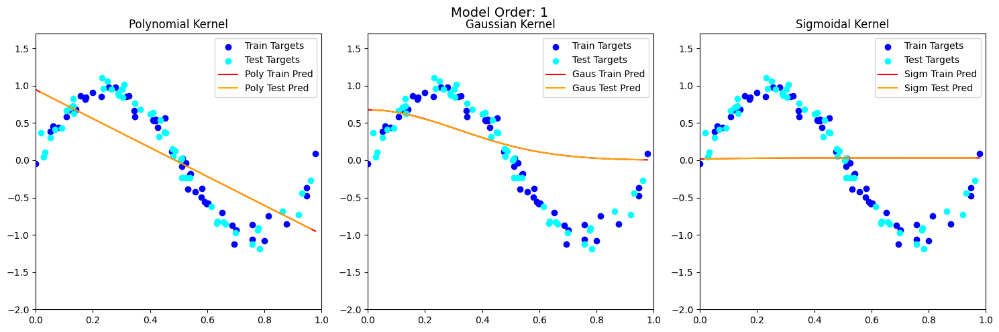

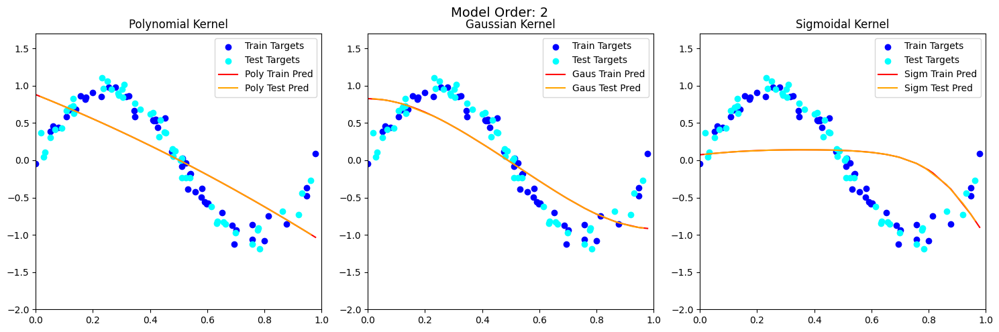

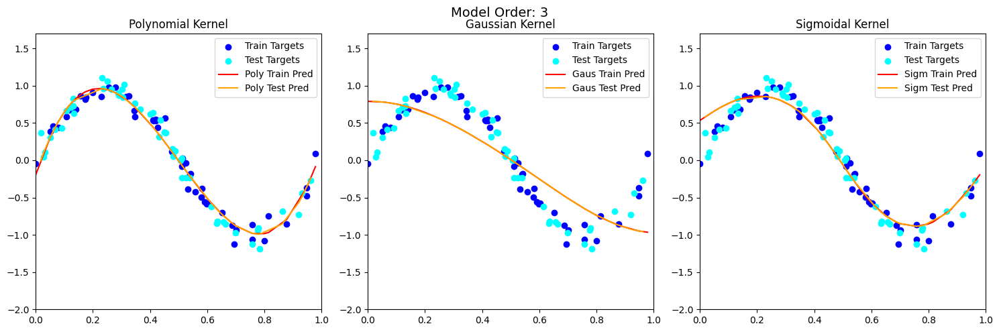

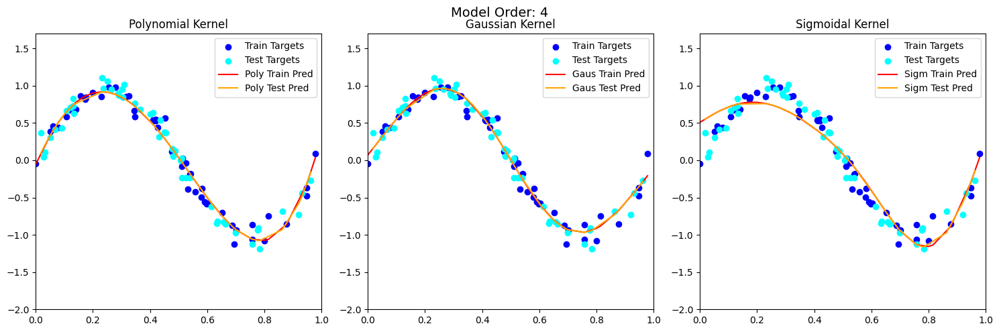

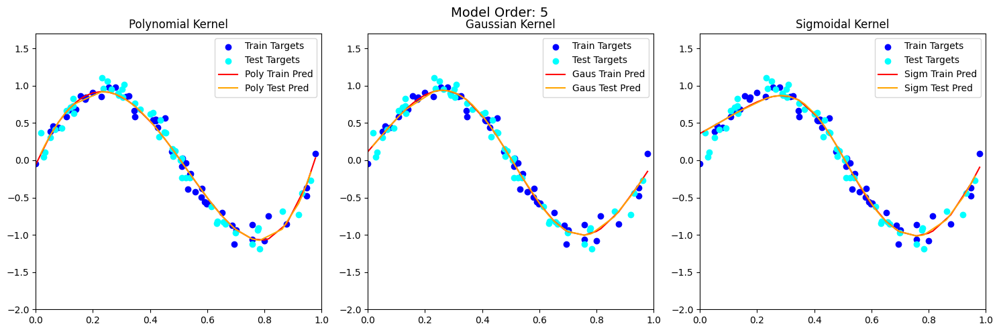

...

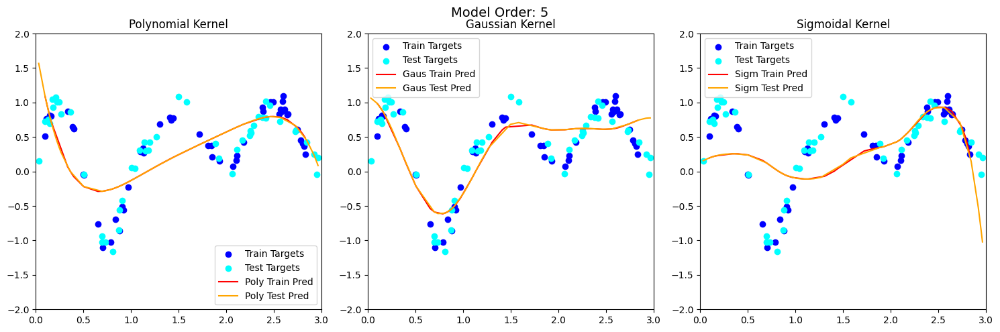

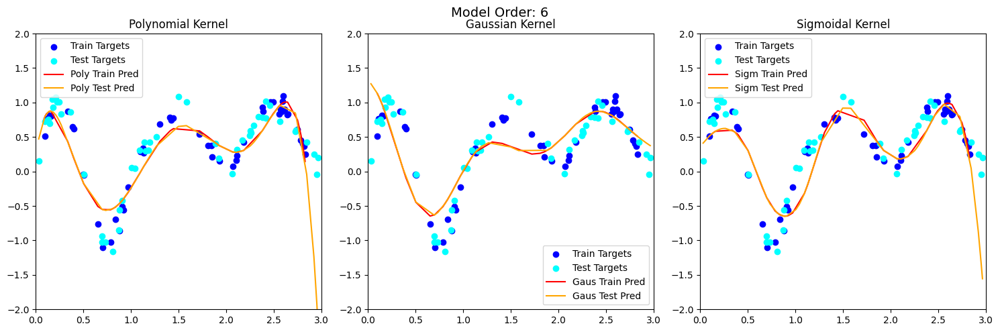

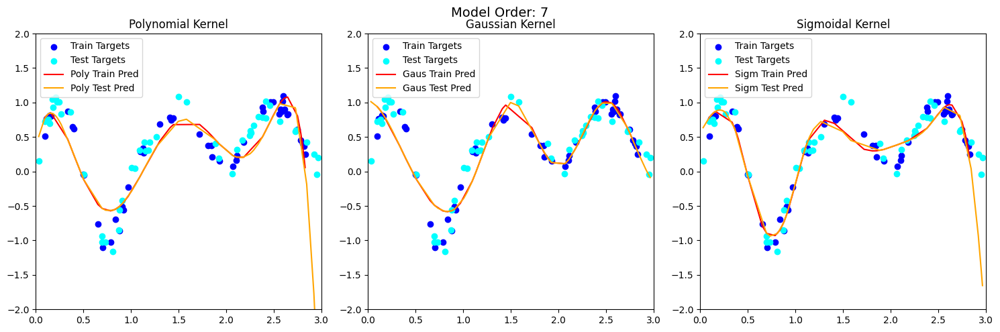

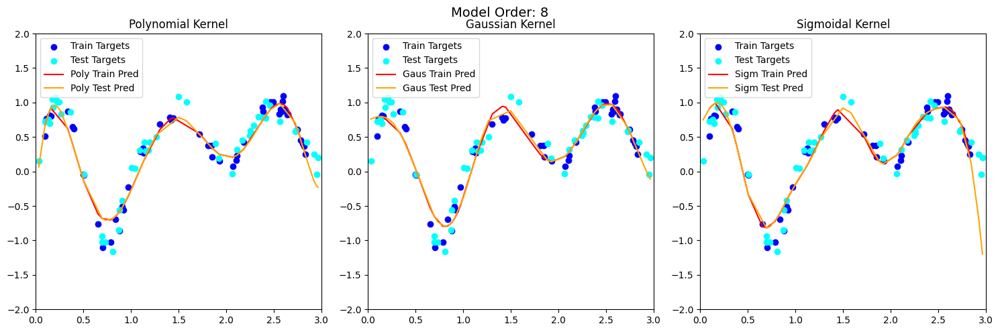

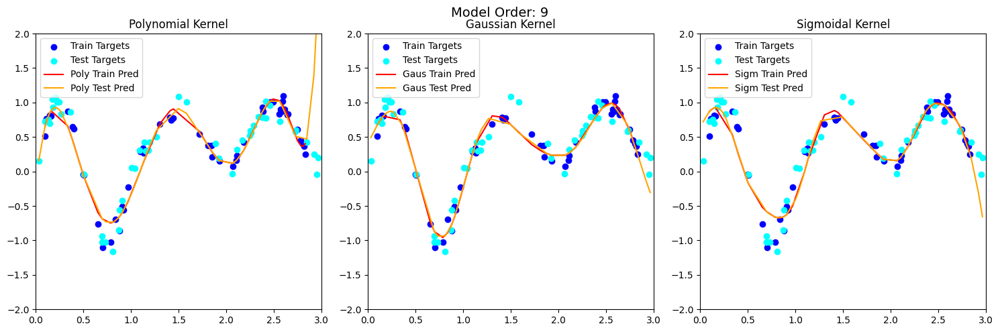

Errors for Target 1:
Polynomial Train Error: [np.float64(0.17181925181356078), np.float64(0.17086984680213355), np.float64(0.012282409958583833), np.float64(0.010548217710128696), np.float64(0.010442410388288555), np.float64(0.00989255278360538), np.float64(0.009586445779122882), np.float64(0.009583182345353039), np.float64(0.009634077639817105)]
Polynomial Test Error: [np.float64(0.1916600297777187), np.float64(0.18433332622964563), np.float64(0.014068594123787796), np.float64(0.013023662257769318), np.float64(0.012841705355991584), np.float64(0.011871736441881872), np.float64(0.0111972151523562), np.float64(0.011004700777822878), np.float64(0.01100821837704222)]
Gaussian Train Error: [np.float64(0.2919177996256736), np.float64(0.13135221847956743), np.float64(0.13061847260117132), np.float64(0.010977631039989048), np.float64(0.01021846361985586), np.float64(0.009803161021780533), np.float64(0.009725188128327136), np.float64(0.009688391241362889), np.float64(0.009664881439658237)]
Gau

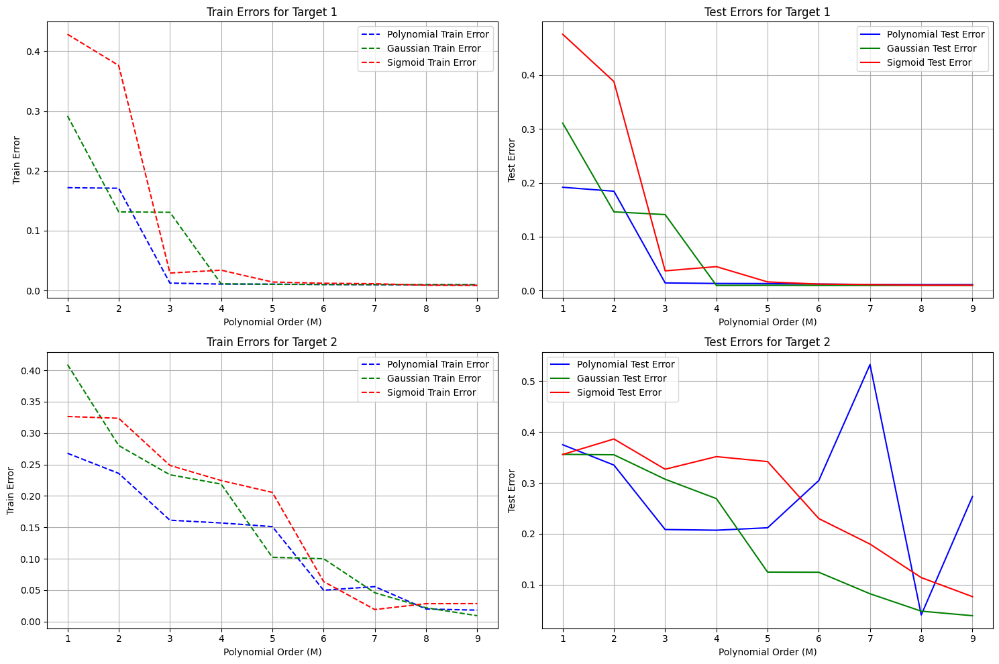

In [3]:
# Generate 100 data points
x_points_3 = np.random.uniform(0, 1, 100)
sinusoid_points = np.sin(2 * np.pi * x_points_3) + np.random.normal(0, 0.1, 100)

# Obtain train and test splits
point_indices_1 = np.random.choice(100, size=50, replace=False)
point_indices_2 = [i for i in range(100) if i not in point_indices_1]

X_training_set_3 = np.array([x_points_3[i] for i in point_indices_1])
X_test_set_3 = np.array([x_points_3[i] for i in point_indices_2])
Y_training_set_3 = np.array([sinusoid_points[i] for i in point_indices_1])
Y_test_set_3 = np.array([sinusoid_points[i] for i in point_indices_2])

# Kernel functions
def gaussian_kernel(x, mean, var):
    return np.exp(-((x - mean) ** 2) / (2 * var))

def sigmoid_kernel(x, mean, scale=10):
    return 1 / (1 + np.exp(-(x - mean) * scale))

# Function to estimate the parameters
def KernelRegressionFit(X_train, Y_train, kernelType, M, lamda):
    X_train = X_train.reshape(-1, 1)
    Y_train = Y_train.reshape(-1, 1)

    if kernelType == 'polynomial':
        kernel = np.column_stack([X_train ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 1, M)
        kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1).flatten() for mean in means])

    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 1, M)
        kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])


    w_opt = np.linalg.inv(kernel.T @ kernel + lamda * np.eye(kernel.shape[1])) @ kernel.T @ Y_train

    return w_opt

def KernelRegressionFit_2(X_train, Y_train, kernelType, M, lamda):
    X_train = X_train.reshape(-1, 1)
    Y_train = Y_train.reshape(-1, 1)

    if kernelType == 'polynomial':
        kernel = np.column_stack([X_train ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 3, M)
        kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1).flatten() for mean in means])

    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 3, M)
        kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])


    w_opt = np.linalg.inv(kernel.T @ kernel + lamda * np.eye(kernel.shape[1])) @ kernel.T @ Y_train

    return w_opt

# Function to compute predictions and errors
def KernelRegressionPred_Error(w_est, X_train, Y_train, X_test, Y_test, kernelType):
    X_train = X_train.reshape(-1, 1)
    X_test = X_test.reshape(-1, 1)
    M = w_est.shape[0]

    Y_train = Y_train.reshape(-1, 1)
    Y_test = Y_test.reshape(-1, 1)


    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M)])
        test_kernel = np.column_stack([X_test ** i for i in range(M)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([sigmoid_kernel(X_test, mean, scale=10) for mean in means])


    TrainPredictions = train_kernel @ w_est
    TestPredictions = test_kernel @ w_est

    TrainError = np.mean((TrainPredictions - Y_train) ** 2)
    TestError = np.mean((TestPredictions - Y_test) ** 2)

    return TrainPredictions, TestPredictions, TrainError, TestError

def KernelRegressionPred_Error_2(w_est, X_train, Y_train, X_test, Y_test, kernelType):
    X_train = X_train.reshape(-1, 1)
    X_test = X_test.reshape(-1, 1)
    M = w_est.shape[0]

    Y_train = Y_train.reshape(-1, 1)
    Y_test = Y_test.reshape(-1, 1)


    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M)])
        test_kernel = np.column_stack([X_test ** i for i in range(M)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([sigmoid_kernel(X_test, mean, scale=10) for mean in means])


    TrainPredictions = train_kernel @ w_est
    TestPredictions = test_kernel @ w_est

    TrainError = np.mean((TrainPredictions - Y_train) ** 2)
    TestError = np.mean((TestPredictions - Y_test) ** 2)

    return TrainPredictions, TestPredictions, TrainError, TestError

# Function to plot model comparison
def plot_model_comparison(M_range):
    kernel_types = ['polynomial', 'gaussian', 'sigmoidal']
    titles = ['Polynomial Kernel', 'Gaussian Kernel', 'Sigmoidal Kernel']

    for M in M_range:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Model Order: {M}', fontsize=14)

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            w = KernelRegressionFit(X_training_set_3, Y_training_set_3, kernel, M, lamda=1e-04)

            sorted_indices_train = np.argsort(X_training_set_3)
            sorted_indices_test = np.argsort(X_test_set_3)

            X_train_sorted = X_training_set_3[sorted_indices_train]
            X_test_sorted = X_test_set_3[sorted_indices_test]

            Y_train_pred, Y_test_pred, _, _ = KernelRegressionPred_Error(
                w, X_train_sorted, Y_training_set_3[sorted_indices_train],
                X_test_sorted, Y_test_set_3[sorted_indices_test], kernel
            )

            axes[i].scatter(X_training_set_3, Y_training_set_3, color='blue', label='Train Targets')
            axes[i].scatter(X_test_set_3, Y_test_set_3, color='cyan', label='Test Targets')

            kernel_short = 'Poly' if kernel == 'polynomial' else kernel[:4].capitalize()

            axes[i].plot(X_train_sorted, Y_train_pred, color='red', label=f'{kernel_short} Train Pred')
            axes[i].plot(X_test_sorted, Y_test_pred, color='orange', label=f'{kernel_short} Test Pred')

            axes[i].set_title(title)
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(-2.0, 1.7)
            axes[i].legend()

        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

# Define model orders and plot
M_range = list(range(1, 10))
plot_model_comparison(M_range)

## Different Taregt Function


x_points_new = np.random.uniform(0, 3, 100)
noise_new = np.random.normal(0, 0.1, 100)

# Vectorized piecewise target function
# def target_function_vectorized(x):
#     return (
#         np.sin(2 * np.pi * x) * (x < 1)
#         + (2 * np.abs(x - 1.5) - 1) * ((x >= 1) & (x < 2))
#         + np.exp(-((x - 2.5) ** 2) / 0.1) * (x >= 2)
#     )

def target_function_vectorized(x):
    return (
        np.sin(2 * np.pi * x) * (x < 1)
        + ( 1 - 2 * np.abs(x - 1.5) ) * ((x >= 1) & (x < 2))
        + np.exp(-((x - 2.5) ** 2) / 0.1) * (x >= 2)
    )

# Generate new target values with added noise
y_points_new = target_function_vectorized(x_points_new) + noise_new

# Train-test split
point_indices_train = np.random.choice(100, 50, replace=False)
point_indices_test = np.setdiff1d(np.arange(100), point_indices_train)  # More efficient way

X_train_new = x_points_new[point_indices_train]
X_test_new = x_points_new[point_indices_test]
Y_train_new = y_points_new[point_indices_train]
Y_test_new = y_points_new[point_indices_test]

def plot_model_comparison_new(M_range):
    kernel_types = ['polynomial', 'gaussian', 'sigmoidal']
    titles = ['Polynomial Kernel', 'Gaussian Kernel', 'Sigmoidal Kernel']

    for M in M_range:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Model Order: {M}', fontsize=14)

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            w = KernelRegressionFit_2(X_train_new, Y_train_new, kernel, M, lamda=1e-04)

            sorted_indices_train = np.argsort(X_train_new)
            sorted_indices_test = np.argsort(X_test_new)

            X_train_sorted = X_train_new[sorted_indices_train]
            X_test_sorted = X_test_new[sorted_indices_test]

            Y_train_pred, Y_test_pred, _, _ = KernelRegressionPred_Error_2(
                w, X_train_sorted, Y_train_new[sorted_indices_train],
                X_test_sorted, Y_test_new[sorted_indices_test], kernel
            )

            axes[i].scatter(X_train_new, Y_train_new, color='blue', label='Train Targets')
            axes[i].scatter(X_test_new, Y_test_new, color='cyan', label='Test Targets')

            kernel_short = 'Poly' if kernel == 'polynomial' else kernel[:4].capitalize()

            axes[i].plot(X_train_sorted, Y_train_pred, color='red', label=f'{kernel_short} Train Pred')
            axes[i].plot(X_test_sorted, Y_test_pred, color='orange', label=f'{kernel_short} Test Pred')

            axes[i].set_title(title)
            axes[i].set_xlim(0, 3)
            axes[i].set_ylim(-2.0, 2.0)
            axes[i].legend()

        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

M_range = list(range(1, 10))
plot_model_comparison_new(M_range)

polynomial_tr_error_1 = []
polynomial_te_error_1 = []
gaussian_tr_error_1 = []
gaussian_te_error_1 = []
sigmoid_tr_error_1 = []
sigmoid_te_error_1 = []

for M in M_range:
    w_poly = KernelRegressionFit(X_training_set_3, Y_training_set_3, 'polynomial', M, 1e-04)
    w_gaus = KernelRegressionFit(X_training_set_3, Y_training_set_3, 'gaussian', M, 1e-04)
    w_sig = KernelRegressionFit(X_training_set_3, Y_training_set_3, 'sigmoidal', M, 1e-04)

    _, _, TrainErrorPoly, TestErrorPoly = KernelRegressionPred_Error(w_poly, X_training_set_3, Y_training_set_3, X_test_set_3, Y_test_set_3, 'polynomial')
    _, _, TrainErrorGaus, TestErrorGaus = KernelRegressionPred_Error(w_gaus, X_training_set_3, Y_training_set_3, X_test_set_3, Y_test_set_3, 'gaussian')
    _, _, TrainErrorSig, TestErrorSig = KernelRegressionPred_Error(w_sig, X_training_set_3, Y_training_set_3, X_test_set_3, Y_test_set_3, 'sigmoidal')

    polynomial_tr_error_1.append(TrainErrorPoly)
    polynomial_te_error_1.append(TestErrorPoly)
    gaussian_tr_error_1.append(TrainErrorGaus)
    gaussian_te_error_1.append(TestErrorGaus)
    sigmoid_tr_error_1.append(TrainErrorSig)
    sigmoid_te_error_1.append(TestErrorSig)


polynomial_tr_error_2 = []
polynomial_te_error_2 = []
gaussian_tr_error_2 = []
gaussian_te_error_2 = []
sigmoid_tr_error_2 = []
sigmoid_te_error_2 = []

for M in M_range:
    w_poly = KernelRegressionFit_2(X_train_new, Y_train_new, 'polynomial', M, 1e-04)
    w_gaus = KernelRegressionFit_2(X_train_new, Y_train_new, 'gaussian', M, 1e-04)
    w_sig = KernelRegressionFit_2(X_train_new, Y_train_new, 'sigmoidal', M, 1e-04)

    _, _, TrainErrorPoly, TestErrorPoly = KernelRegressionPred_Error_2(w_poly, X_train_new, Y_train_new, X_test_new, Y_test_new, 'polynomial')
    _, _, TrainErrorGaus, TestErrorGaus = KernelRegressionPred_Error_2(w_gaus, X_train_new, Y_train_new, X_test_new, Y_test_new, 'gaussian')
    _, _, TrainErrorSig, TestErrorSig = KernelRegressionPred_Error_2(w_sig, X_train_new, Y_train_new, X_test_new, Y_test_new, 'sigmoidal')

    polynomial_tr_error_2.append(TrainErrorPoly)
    polynomial_te_error_2.append(TestErrorPoly)
    gaussian_tr_error_2.append(TrainErrorGaus)
    gaussian_te_error_2.append(TestErrorGaus)
    sigmoid_tr_error_2.append(TrainErrorSig)
    sigmoid_te_error_2.append(TestErrorSig)

def plot_error_vs_model_order(M_range, errors_target1, errors_target2):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    kernel_types = ['Polynomial', 'Gaussian', 'Sigmoid']

    # Plot for Target 1
    axes[0, 0].plot(M_range, errors_target1['Polynomial']['train'], label='Polynomial Train Error', linestyle='dashed', color='blue')
    axes[0, 0].plot(M_range, errors_target1['Gaussian']['train'], label='Gaussian Train Error', linestyle='dashed', color='green')
    axes[0, 0].plot(M_range, errors_target1['Sigmoid']['train'], label='Sigmoid Train Error', linestyle='dashed', color='red')
    axes[0, 0].set_xlabel('Polynomial Order (M)')
    axes[0, 0].set_ylabel('Train Error')
    axes[0, 0].set_title('Train Errors for Target 1')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    axes[0, 1].plot(M_range, errors_target1['Polynomial']['test'], label='Polynomial Test Error', linestyle='solid', color='blue')
    axes[0, 1].plot(M_range, errors_target1['Gaussian']['test'], label='Gaussian Test Error', linestyle='solid', color='green')
    axes[0, 1].plot(M_range, errors_target1['Sigmoid']['test'], label='Sigmoid Test Error', linestyle='solid', color='red')
    axes[0, 1].set_xlabel('Polynomial Order (M)')
    axes[0, 1].set_ylabel('Test Error')
    axes[0, 1].set_title('Test Errors for Target 1')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # Plot for Target 2
    axes[1, 0].plot(M_range, errors_target2['Polynomial']['train'], label='Polynomial Train Error', linestyle='dashed', color='blue')
    axes[1, 0].plot(M_range, errors_target2['Gaussian']['train'], label='Gaussian Train Error', linestyle='dashed', color='green')
    axes[1, 0].plot(M_range, errors_target2['Sigmoid']['train'], label='Sigmoid Train Error', linestyle='dashed', color='red')
    axes[1, 0].set_xlabel('Polynomial Order (M)')
    axes[1, 0].set_ylabel('Train Error')
    axes[1, 0].set_title('Train Errors for Target 2')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    axes[1, 1].plot(M_range, errors_target2['Polynomial']['test'], label='Polynomial Test Error', linestyle='solid', color='blue')
    axes[1, 1].plot(M_range, errors_target2['Gaussian']['test'], label='Gaussian Test Error', linestyle='solid', color='green')
    axes[1, 1].plot(M_range, errors_target2['Sigmoid']['test'], label='Sigmoid Test Error', linestyle='solid', color='red')
    axes[1, 1].set_xlabel('Polynomial Order (M)')
    axes[1, 1].set_ylabel('Test Error')
    axes[1, 1].set_title('Test Errors for Target 2')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    plt.tight_layout()
    plt.show()

print('Errors for Target 1:')
print('Polynomial Train Error:', polynomial_tr_error_1)
print('Polynomial Test Error:', polynomial_te_error_1)
print('Gaussian Train Error:', gaussian_tr_error_1)
print('Gaussian Test Error:', gaussian_te_error_1)
print('Sigmoid Train Error:', sigmoid_tr_error_1)
print('Sigmoid Test Error:', sigmoid_te_error_1)

# Define the error dictionaries
errors_target1 = {
    'Polynomial': {'train': polynomial_tr_error_1, 'test': polynomial_te_error_1},
    'Gaussian': {'train': gaussian_tr_error_1, 'test': gaussian_te_error_1},
    'Sigmoid': {'train': sigmoid_tr_error_1, 'test': sigmoid_te_error_1}
}

errors_target2 = {
    'Polynomial': {'train': polynomial_tr_error_2, 'test': polynomial_te_error_2},
    'Gaussian': {'train': gaussian_tr_error_2, 'test': gaussian_te_error_2},
    'Sigmoid': {'train': sigmoid_tr_error_2, 'test': sigmoid_te_error_2}
}

# Plot the error comparison
plot_error_vs_model_order(M_range, errors_target1, errors_target2)

<b> Report your observations </b>

1. when the Model order is small none of the kernels actually fir and have a very high error but among those polynomial incurred the least error and as M increases the kernels fit even better . At M = 3 all the kernels suddenly exhibit similar behavoiur.

2. The training error and testing errors are pretty close as observed in the graphs , out of the three kernels sigmoid has the closest similarity between both errors.

3. In target function 1 the polynomial kernel has the smoothest fit but in the target function 2 the gaussian kernel has a smoother fit.

4. We can say the polynomial kernel requires higher computation among the kernels
5. But the polynomial kernel doesnt fit properly in the error context it falls behind the other two kernels.


<b> Part - (4) : Understanding online training </b>

(a). Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.Study the effect of step size η on convergence of the weights, and compare them to those obtained using closed form expressions in 3. Plot the mse as a function of iterations.

(b). Study the effect of batch size on the speed of convergence

(c). Report all your observations


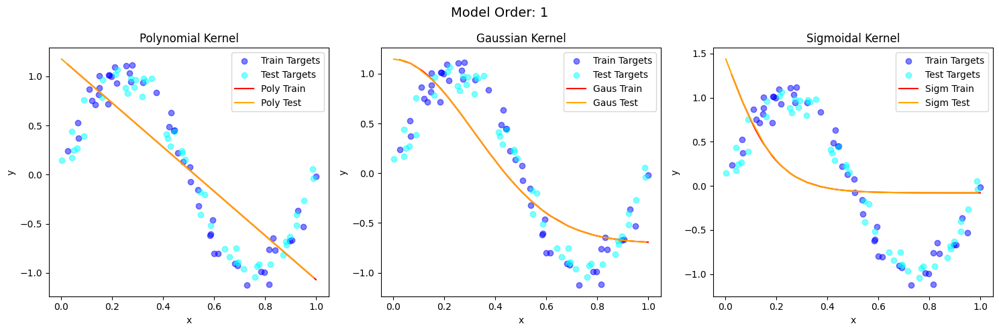

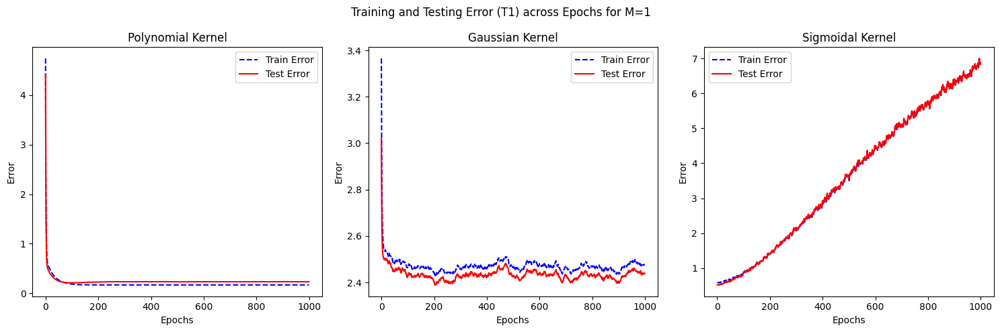

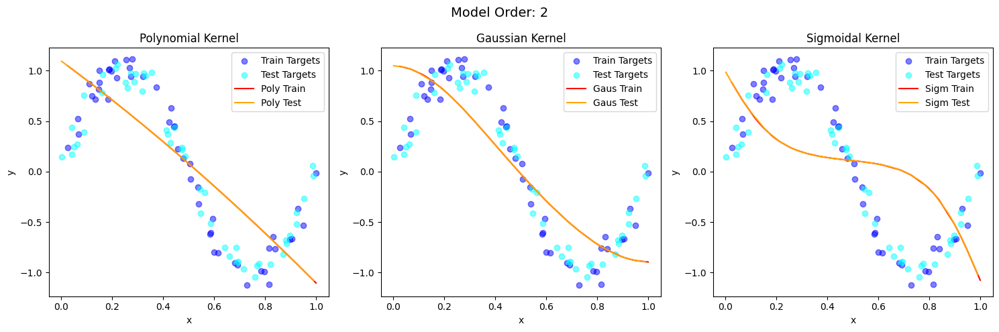

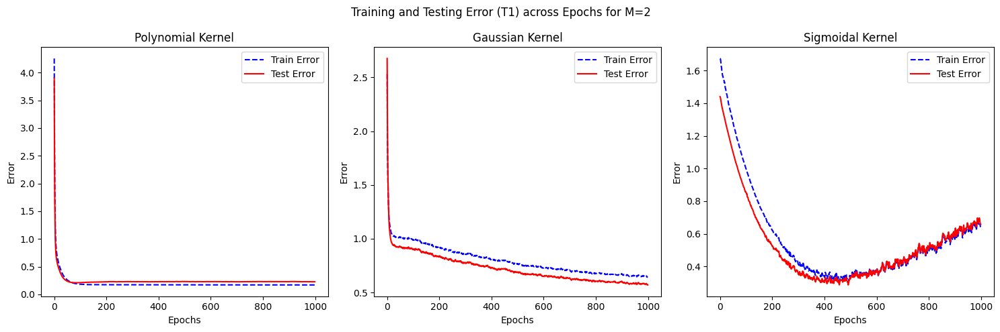

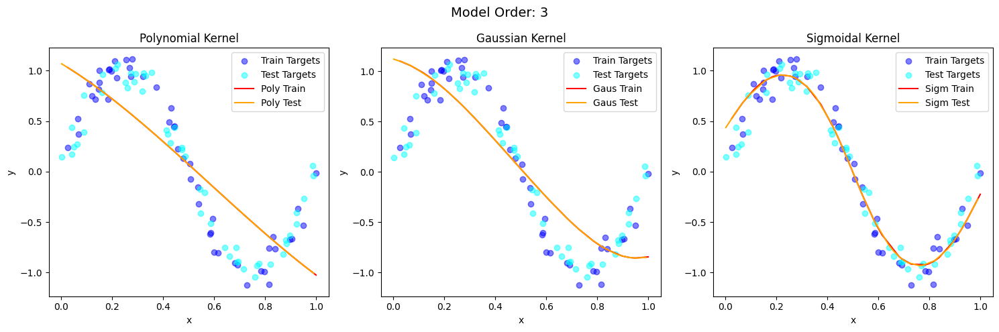

...

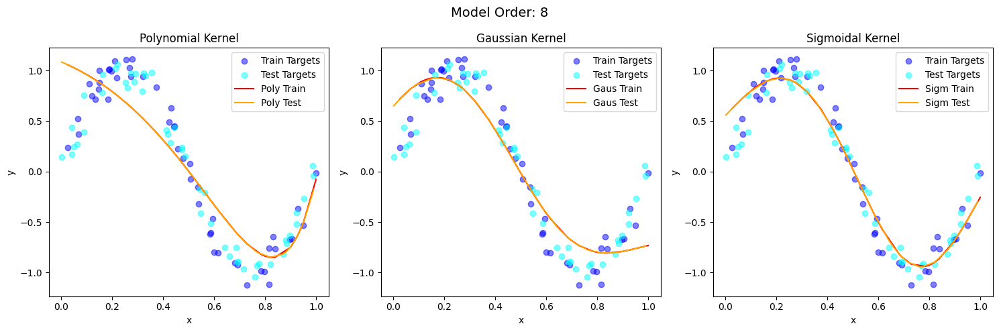

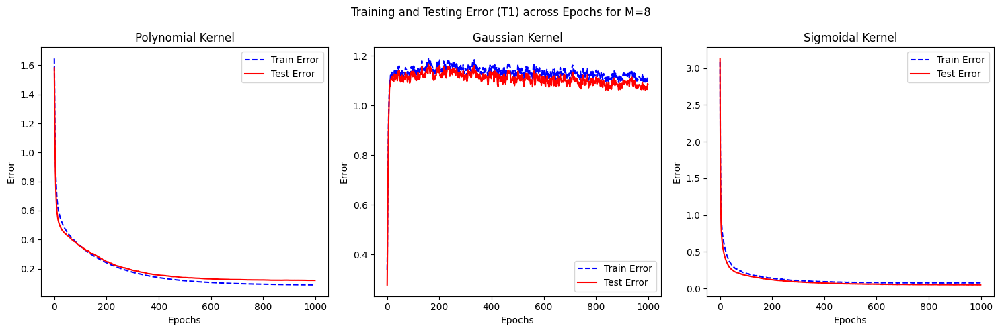

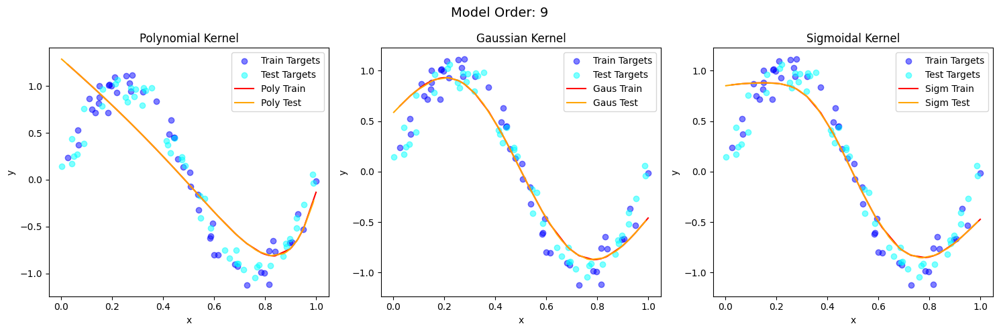

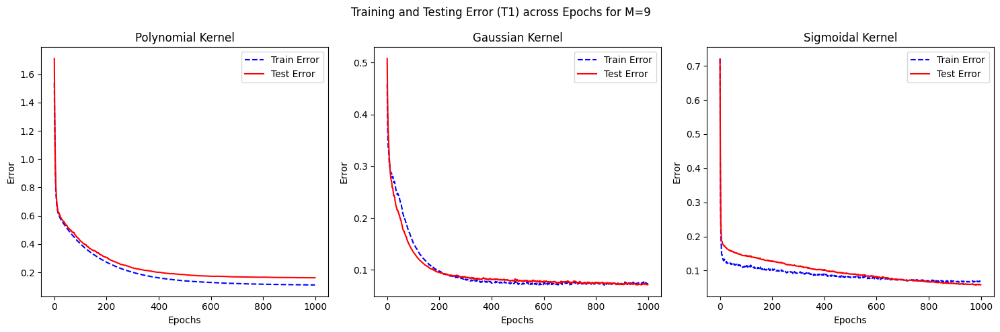

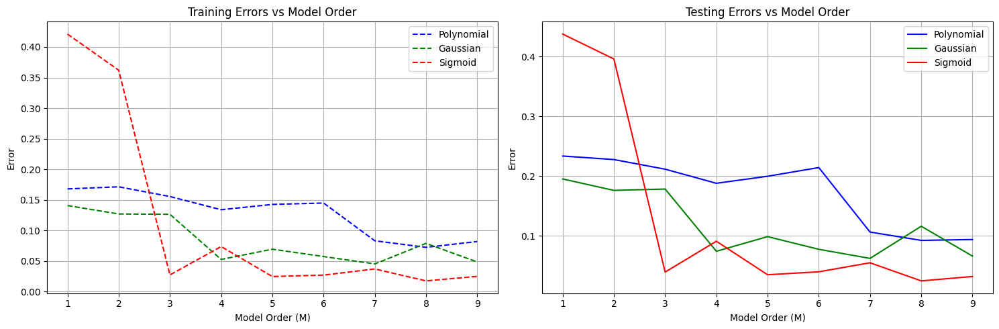

<ipython-input-4-9fa26b365b08>:70: RuntimeWarning: overflow encountered in square
  train_error = np.mean(np.clip((Y_tr_pred - Y_train) ** 2, -1e10, 1e10))
<ipython-input-4-9fa26b365b08>:71: RuntimeWarning: overflow encountered in square
  test_error = np.mean(np.clip((Y_te_pred - Y_test) ** 2, -1e10, 1e10))
<ipython-input-4-9fa26b365b08>:197: RuntimeWarning: overflow encountered in matmul
  gradient_n = phi_n.T @ error_n
<ipython-input-4-9fa26b365b08>:200: RuntimeWarning: invalid value encountered in add
  gradient_accumulator += gradient_n


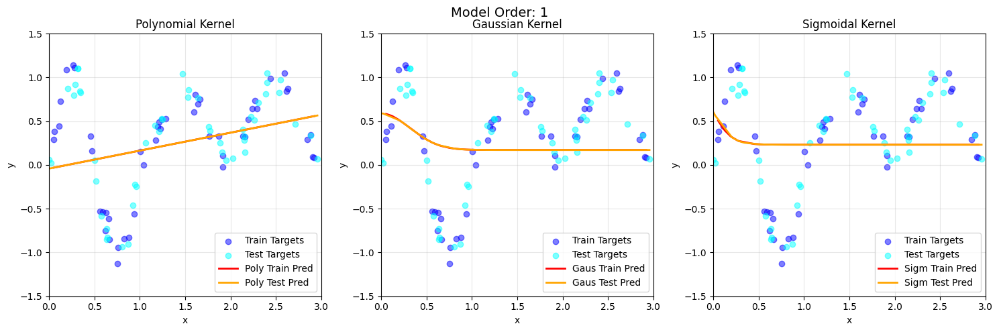

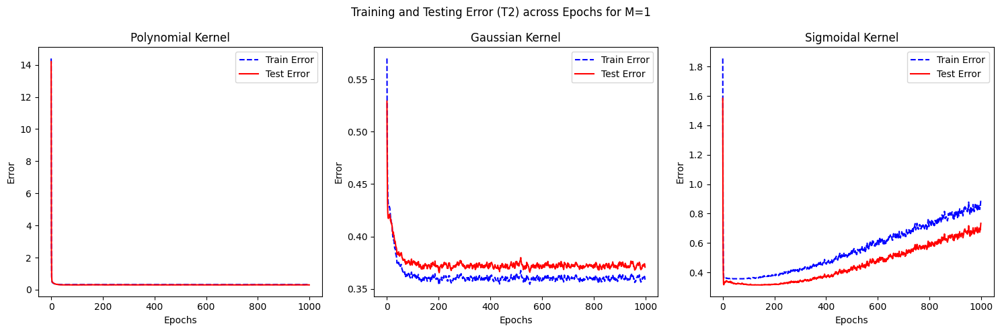

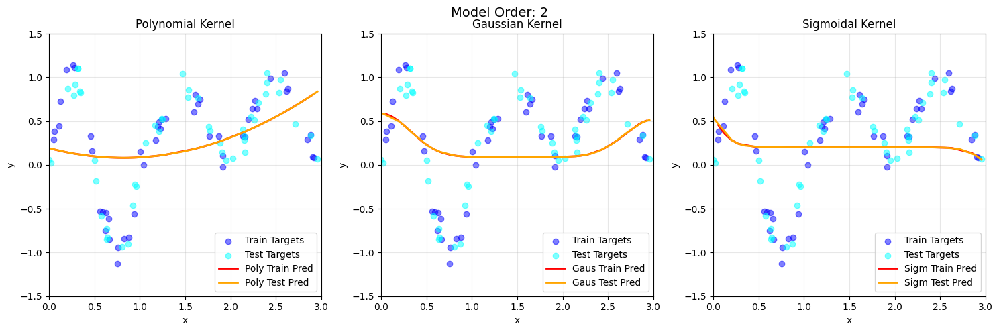

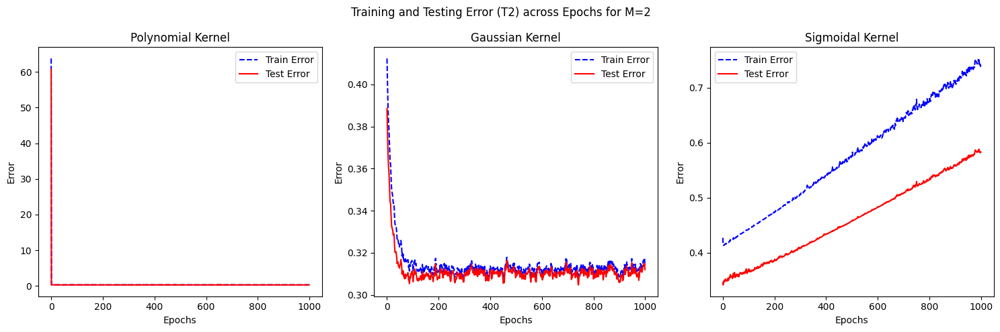

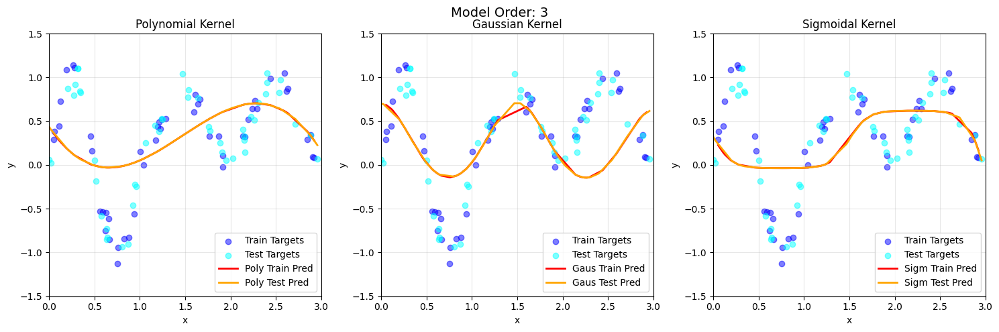

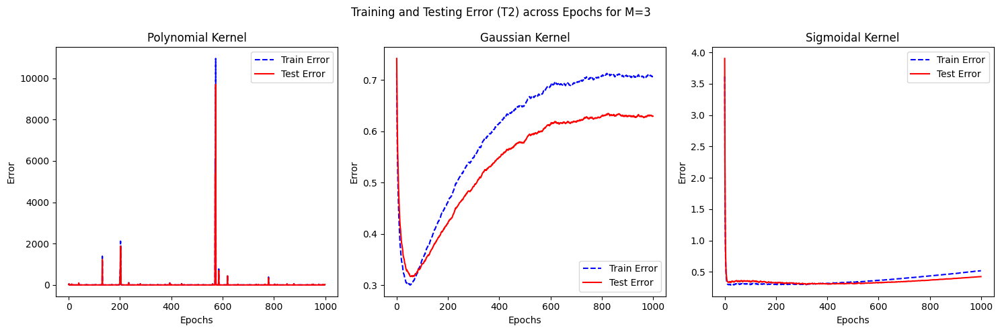

<ipython-input-4-9fa26b365b08>:204: RuntimeWarning: invalid value encountered in subtract
  weights -= adaptive_step * (gradient_accumulator / BatchSize)


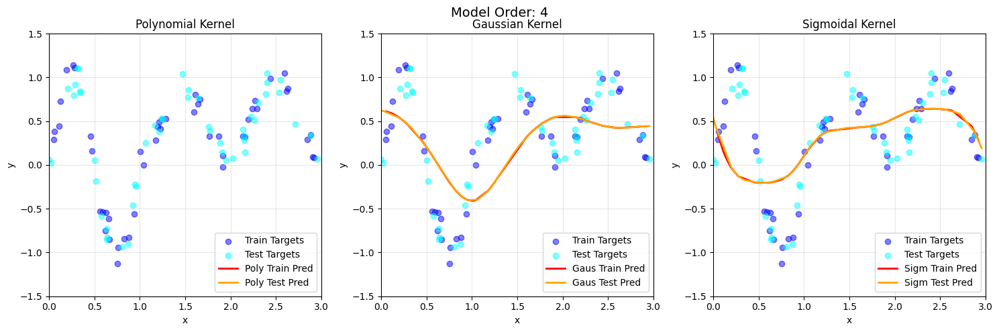

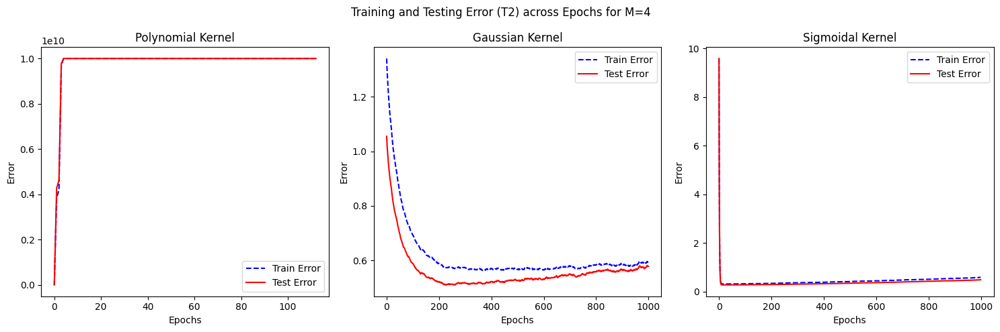

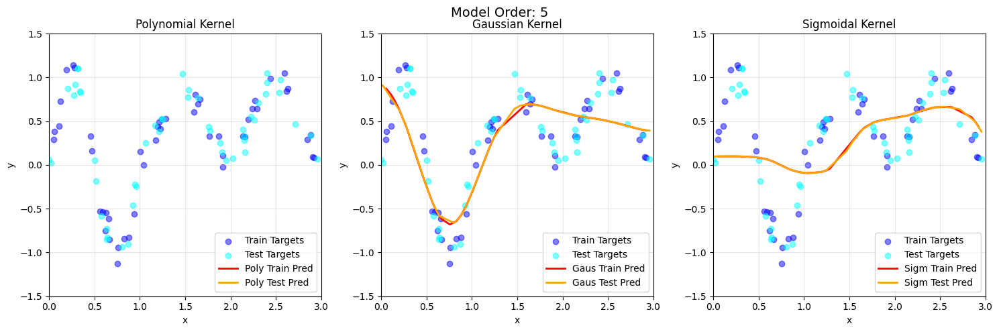

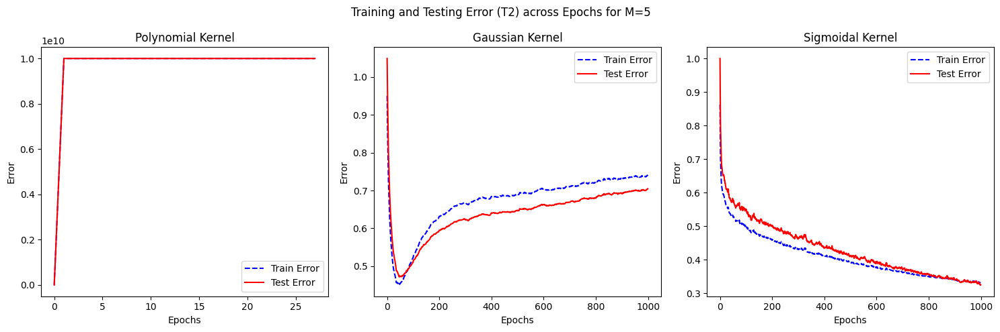

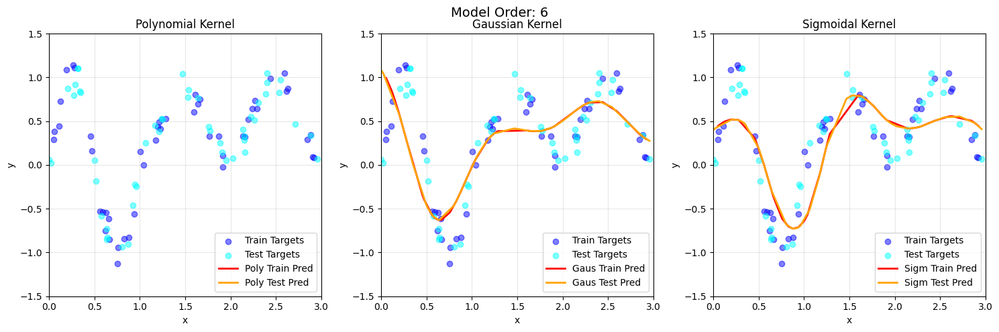

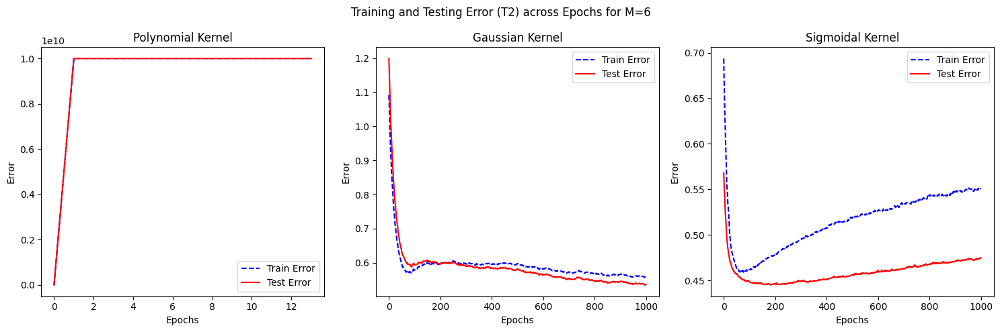

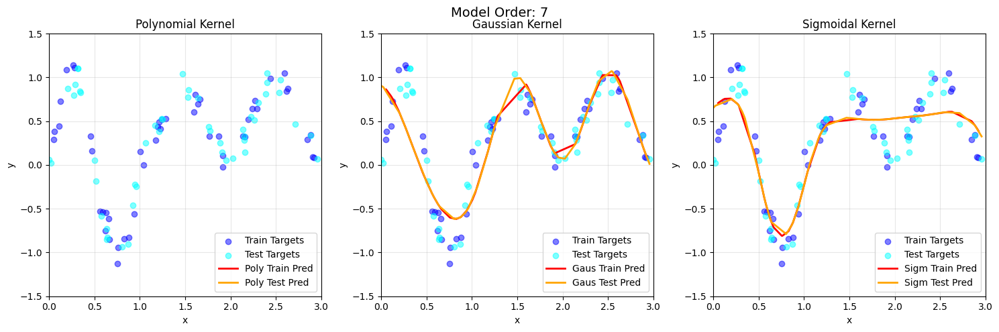

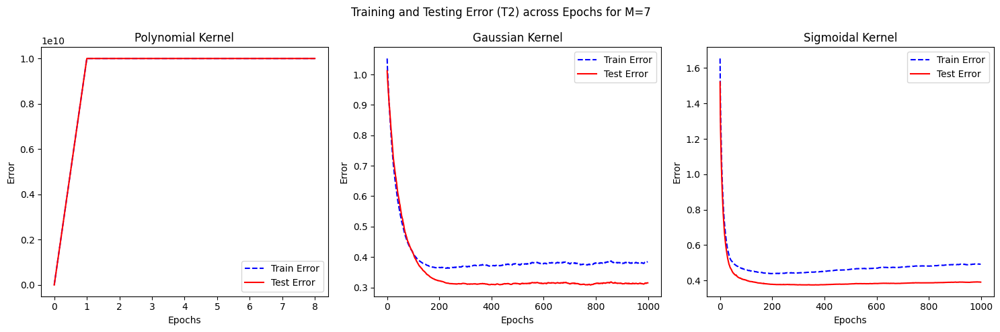

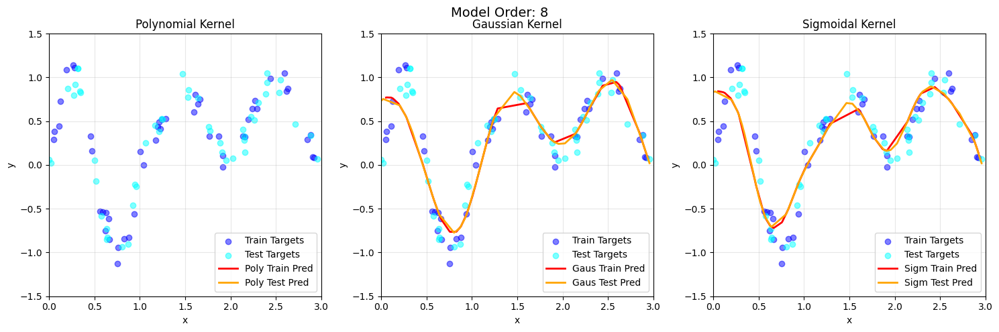

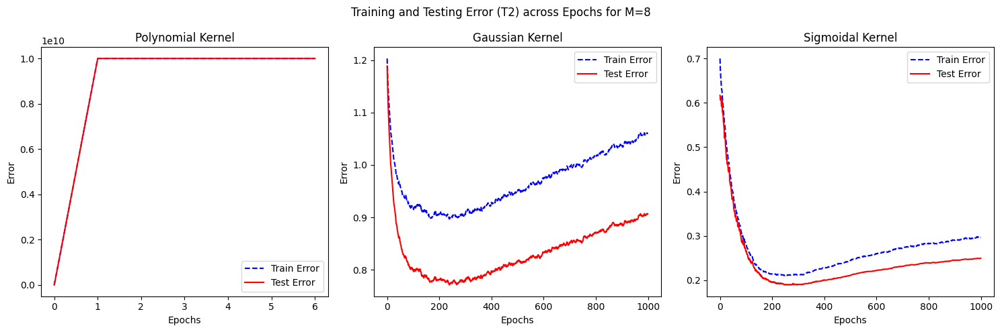

<ipython-input-4-9fa26b365b08>:196: RuntimeWarning: overflow encountered in matmul
  error_n = phi_n @ weights - y_n


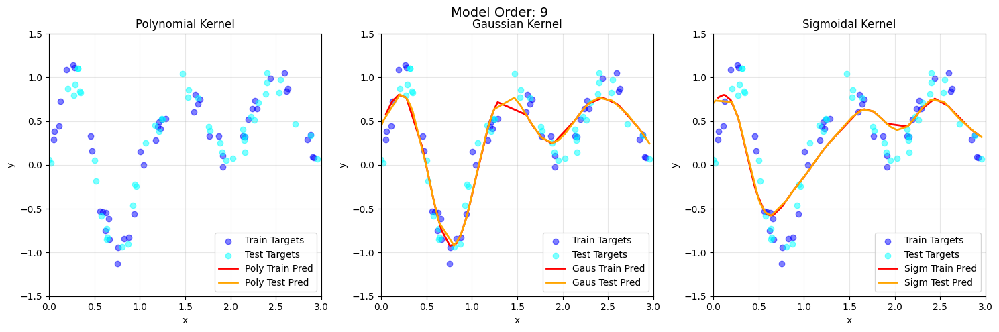

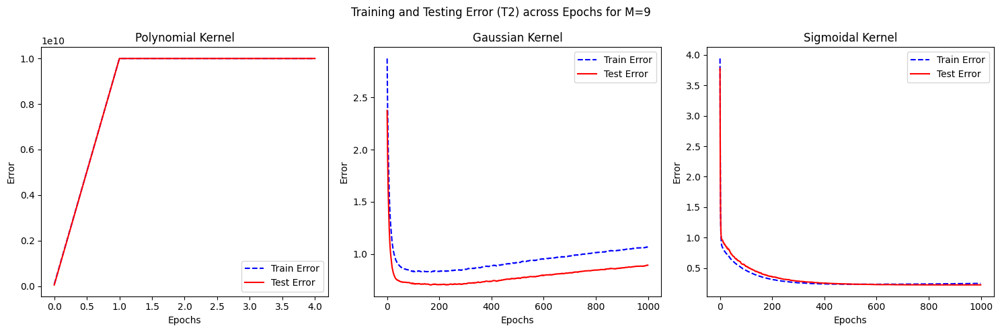

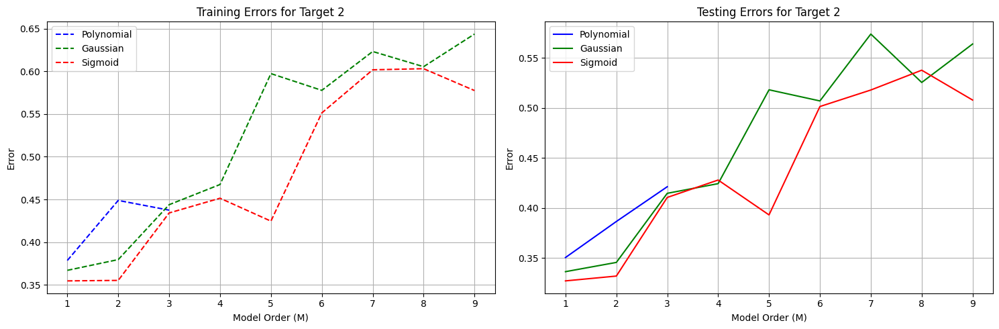

Target Function 1: Simple Sinusoid


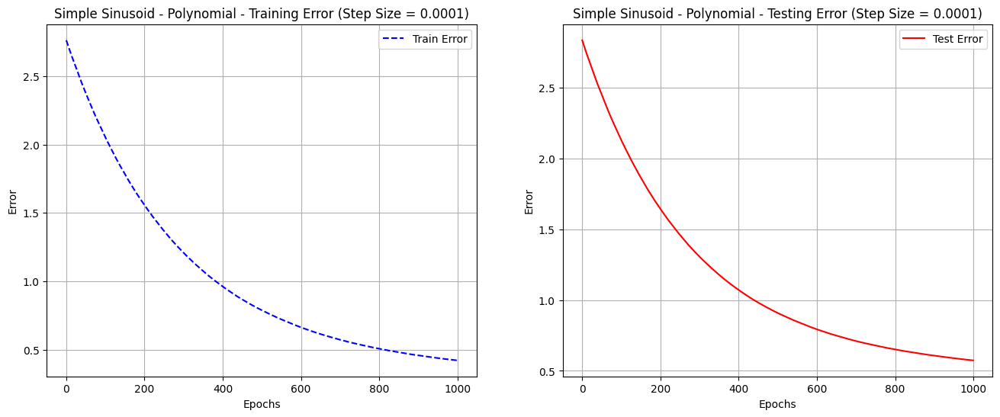

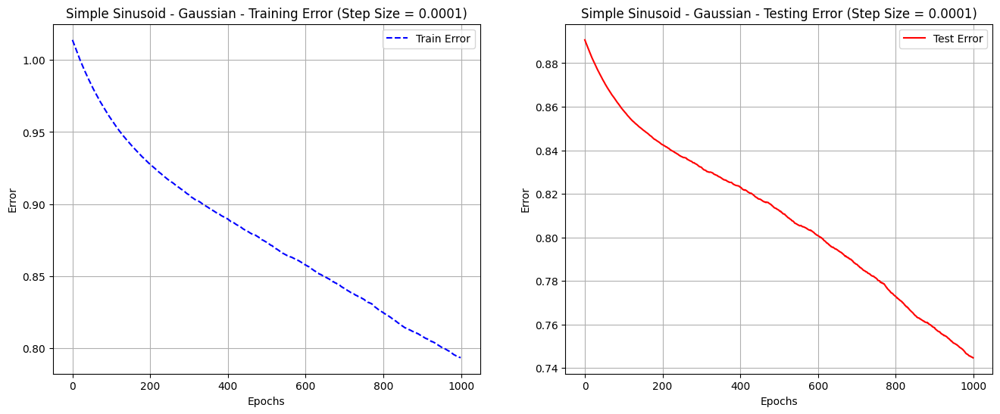

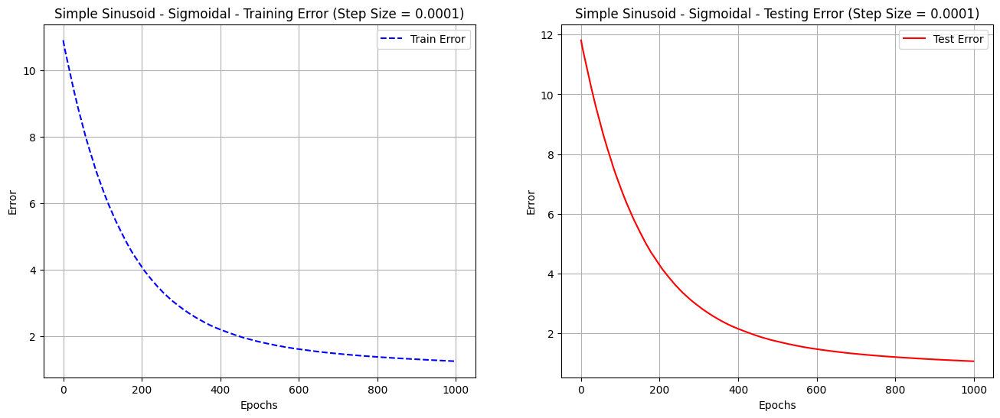

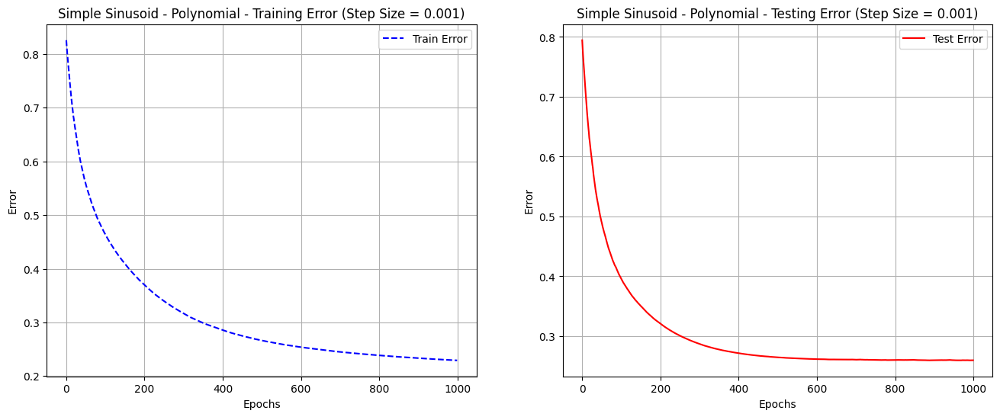

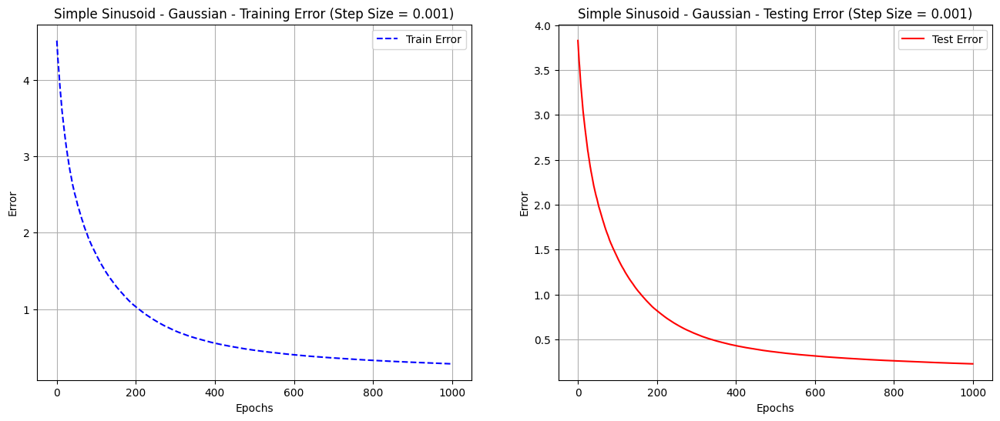

...

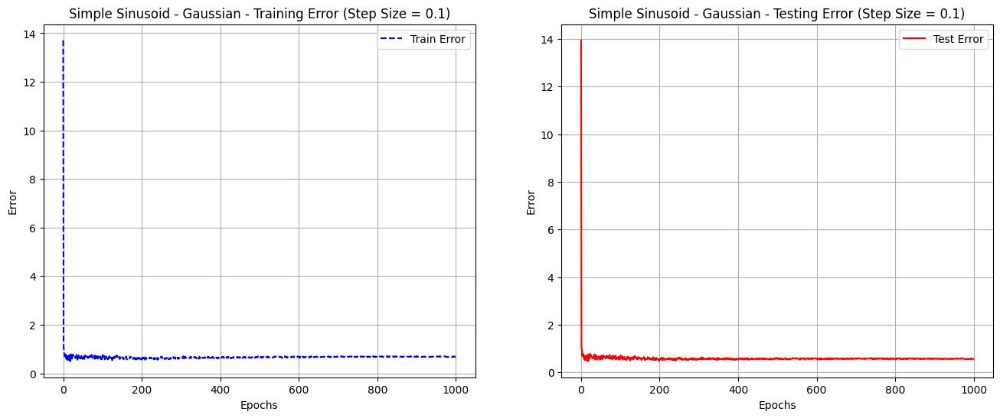

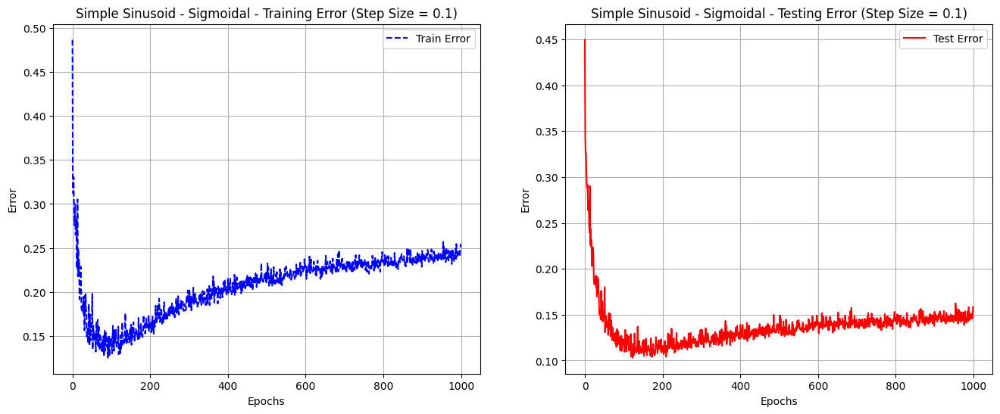

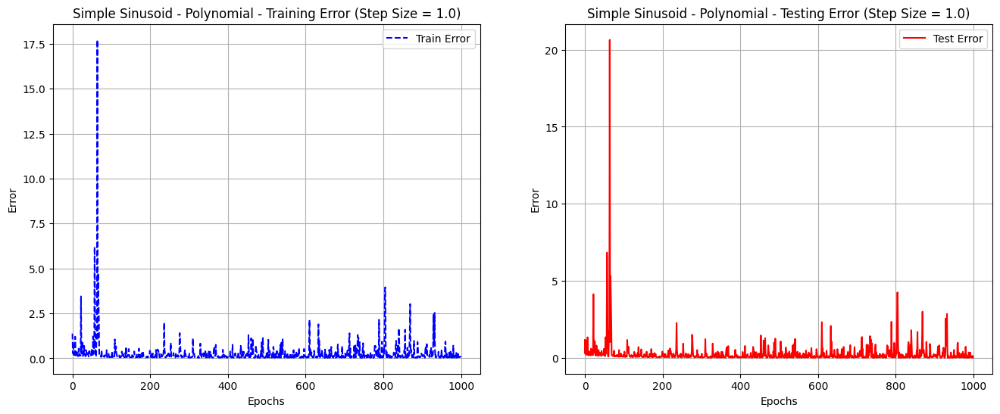

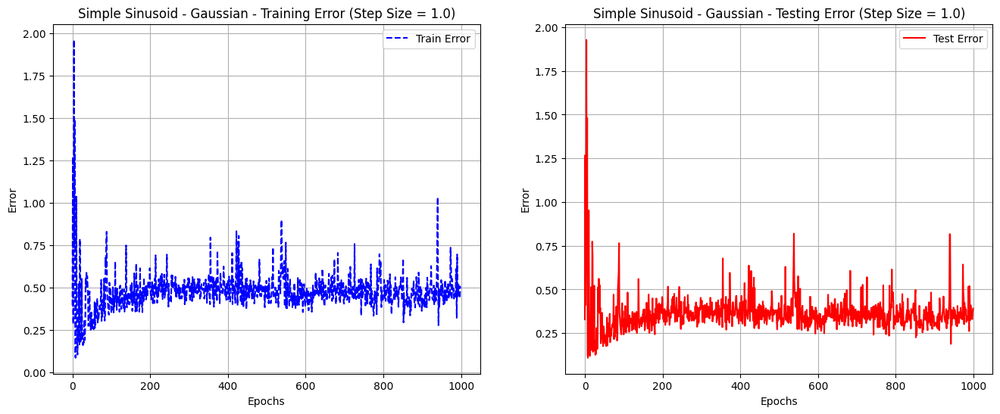

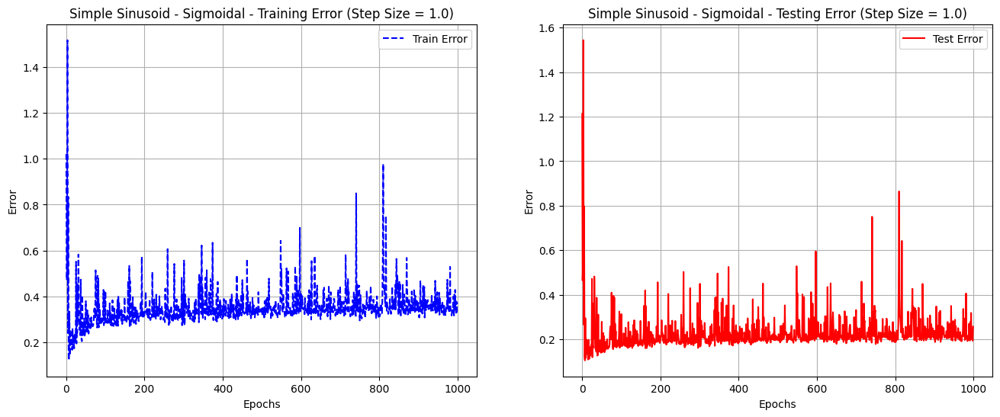

Target Function 2: Complex Function


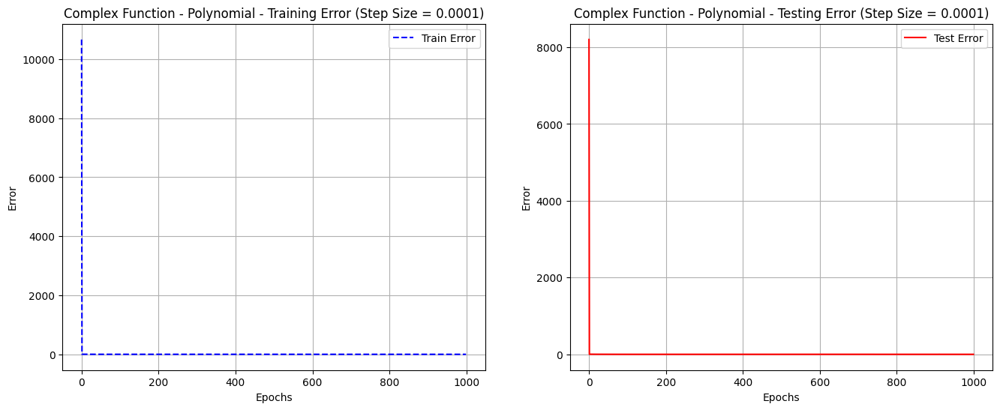

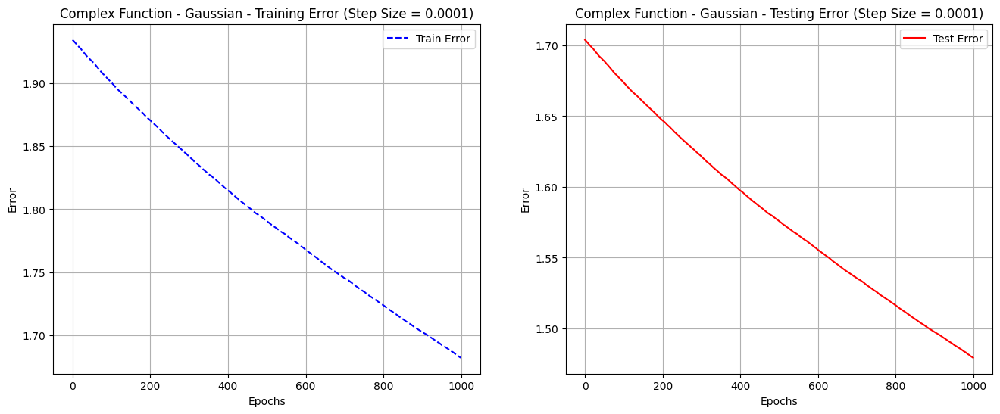

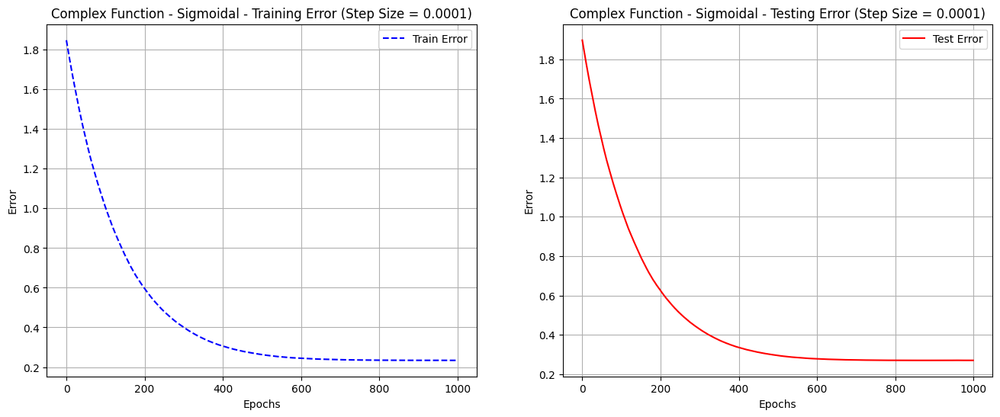

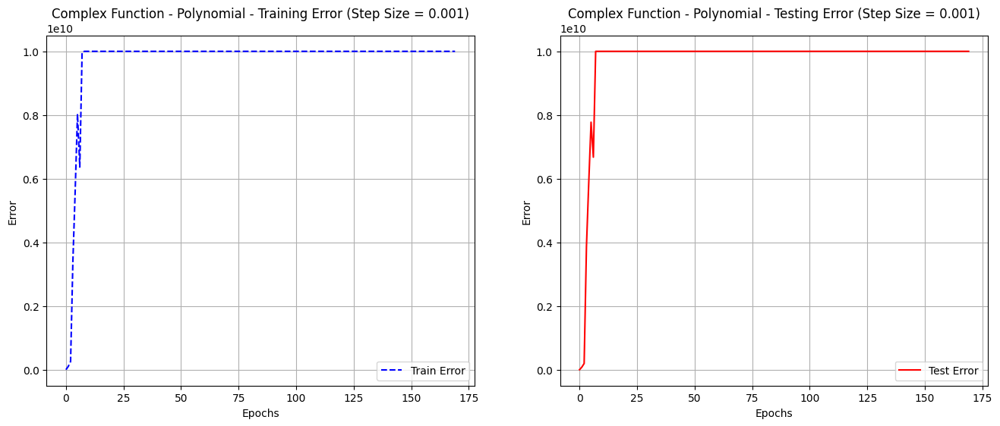

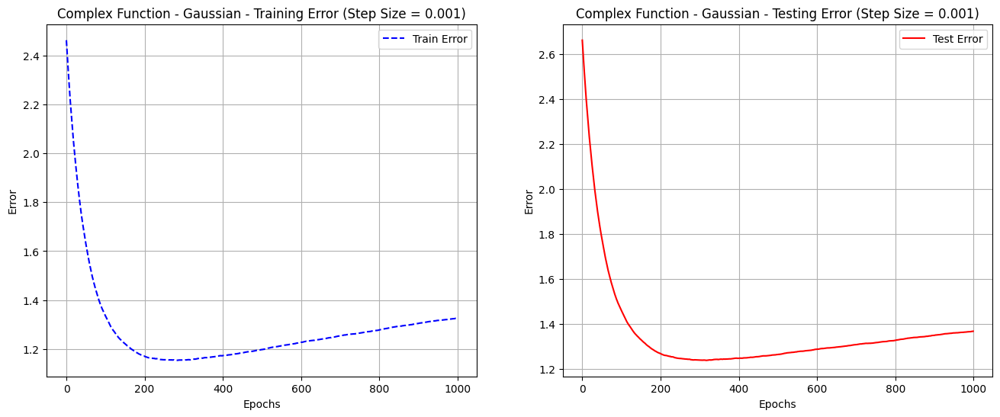

...

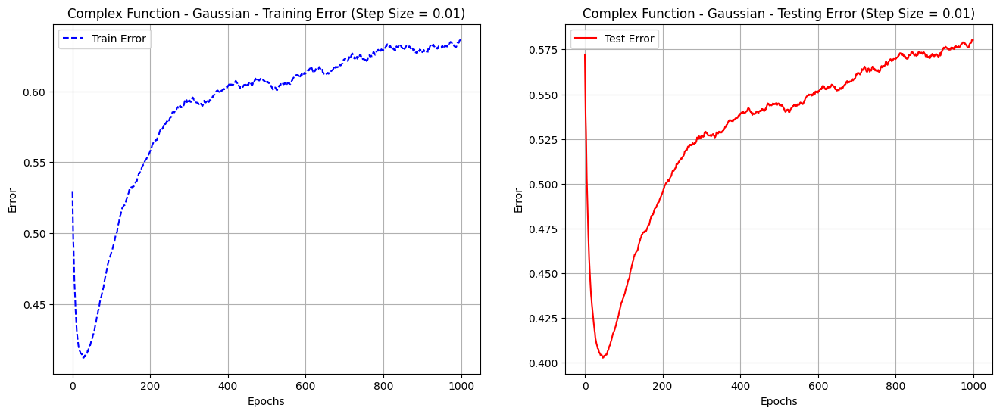

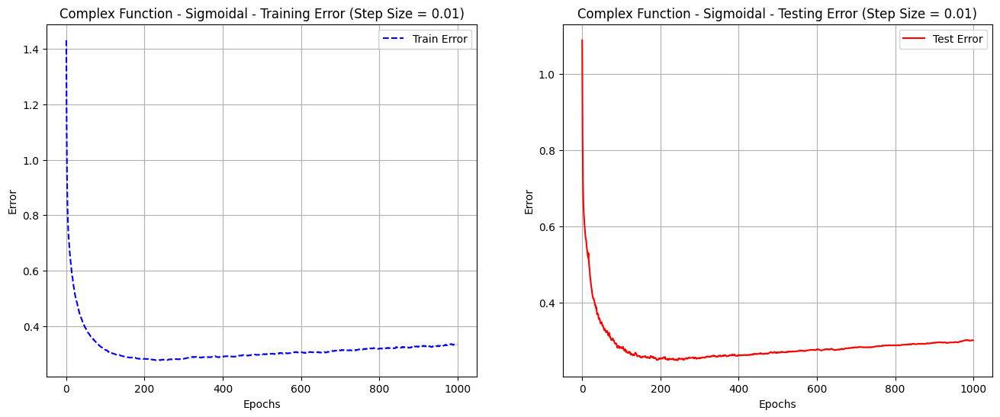

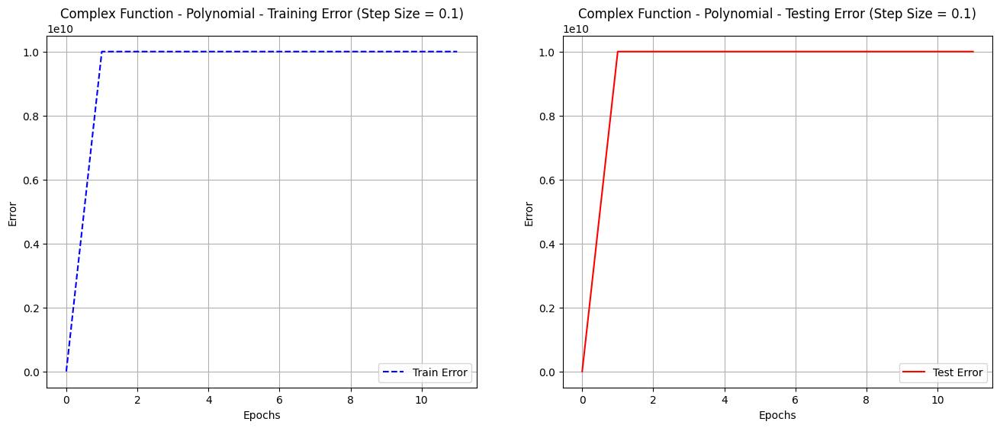

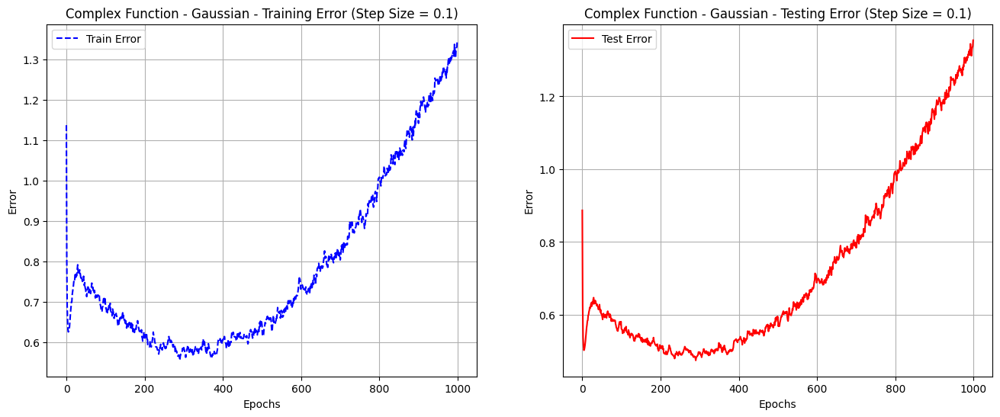

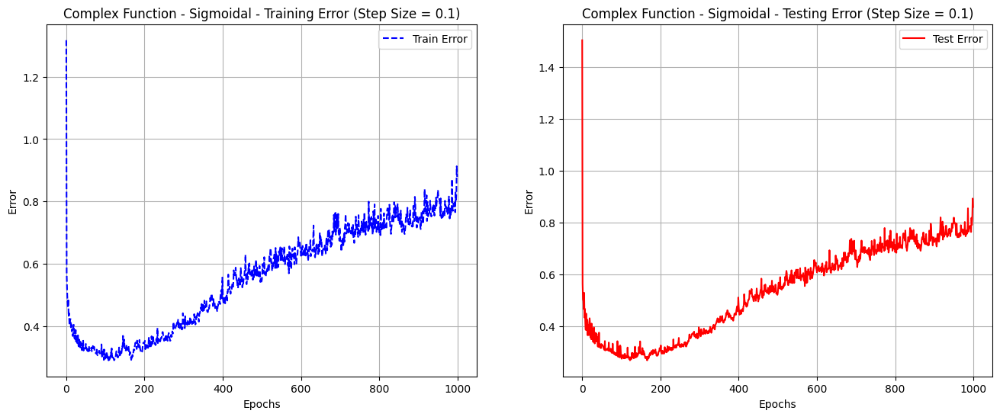

<ipython-input-4-9fa26b365b08>:200: RuntimeWarning: overflow encountered in add
  gradient_accumulator += gradient_n


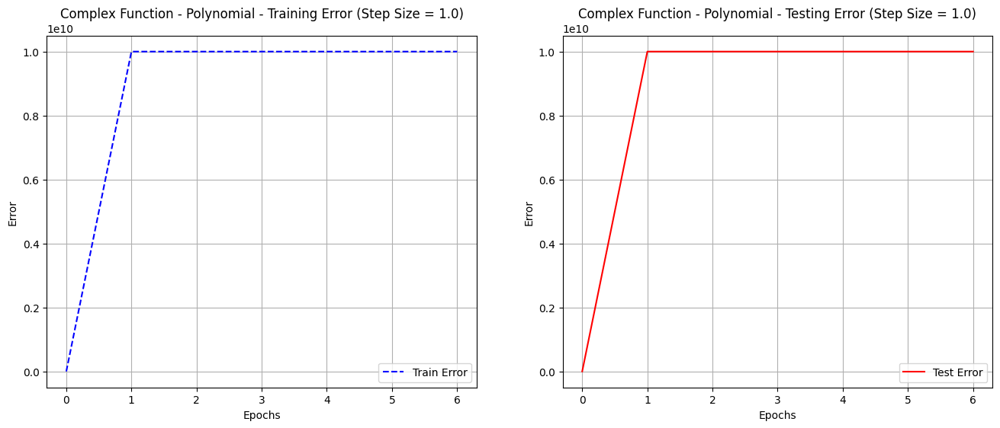

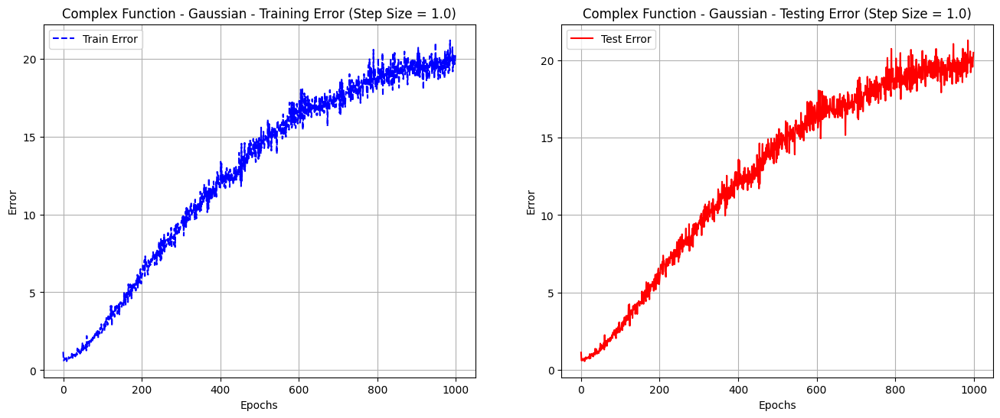

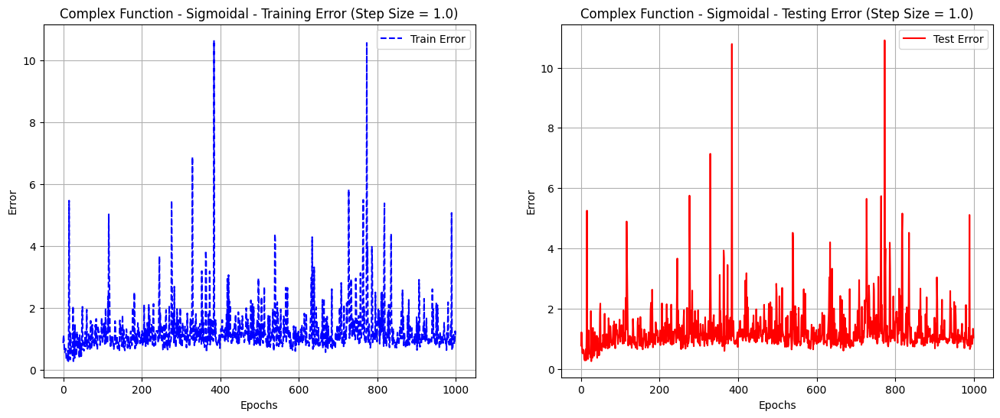

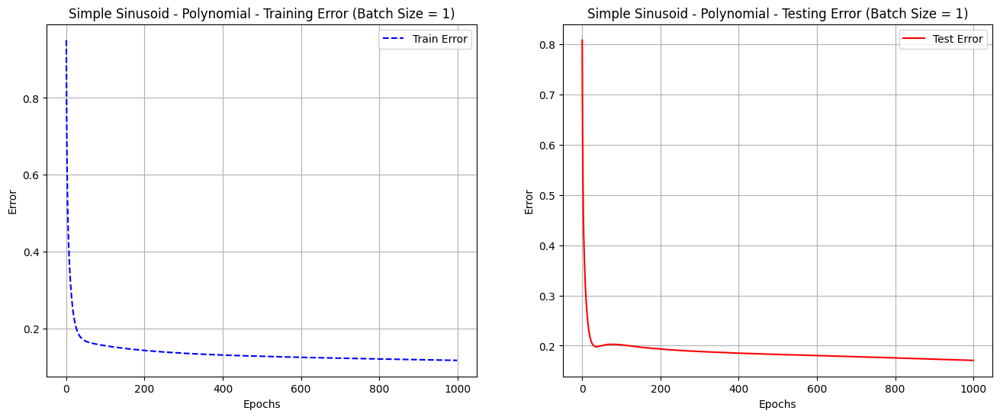

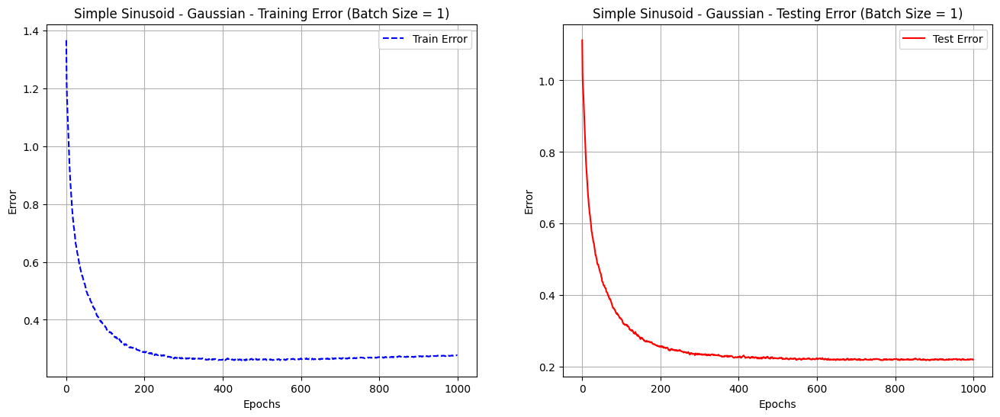

...

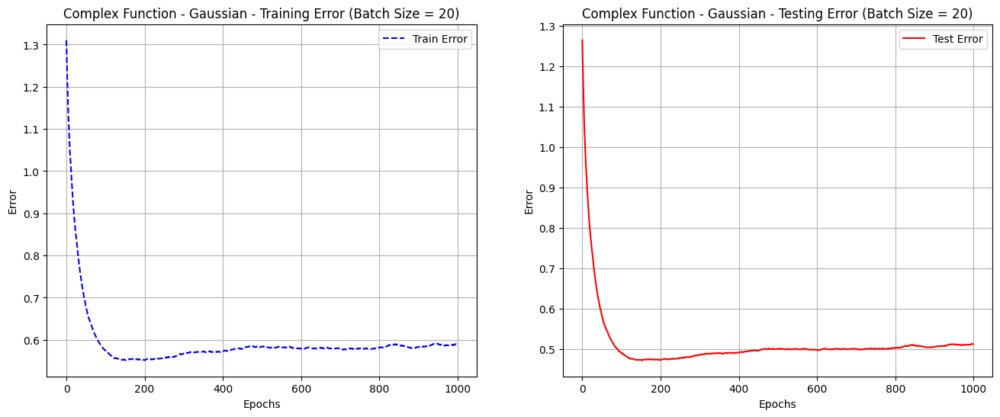

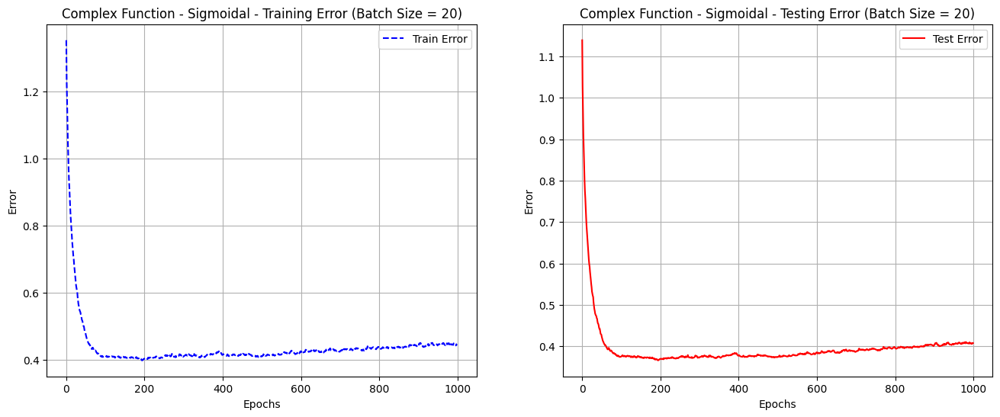

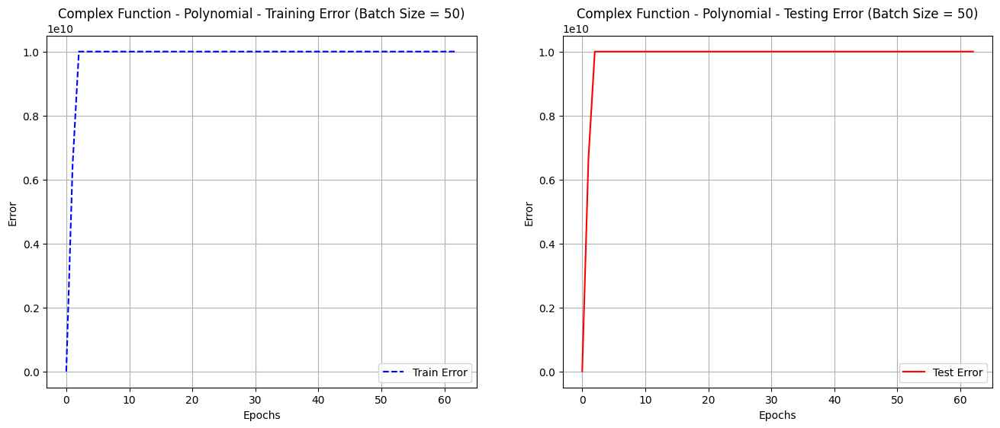

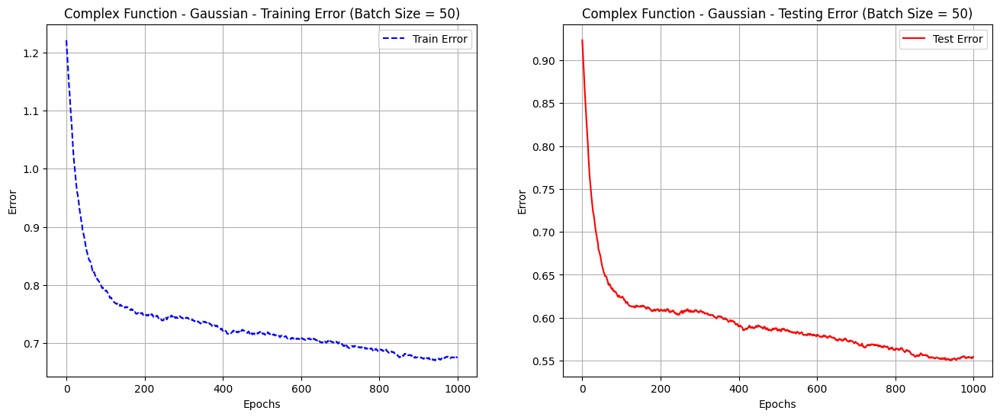

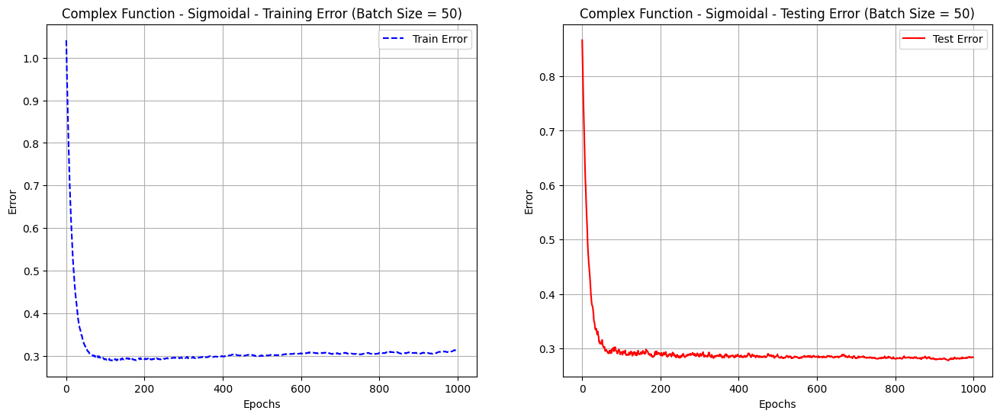

In [4]:
#Understanding online training
########################################
#Repeat 3(a) and 3(b) using stochastic gradient descent for weight update ( plot required results )
########################################
#(estimated weight, training data, training targets, testing data, testing targets, type of the kernel )

def gaussian_kernel(x, mean, var):
    return np.exp(-((x - mean) ** 2) / (2 * var))

def sigmoid_kernel(x, mean, scale=10):
    return 1 / (1 + np.exp(-(x - mean) * scale))

def ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType):
    # Ensure inputs have right shapes
    X_train = X_train.reshape(-1, 1)
    X_test = X_test.reshape(-1, 1)
    Y_train = Y_train.reshape(-1, 1)
    Y_test = Y_test.reshape(-1, 1)

    M = weights.shape[0]  # Number of basis functions

    # Build kernel matrices properly
    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M)])
        test_kernel = np.column_stack([X_test ** i for i in range(M)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([sigmoid_kernel(X_test, mean, scale=10) for mean in means])

    # Compute predictions and errors
    Y_tr_pred = train_kernel @ weights
    Y_te_pred = test_kernel @ weights

    train_error = np.mean(np.clip((Y_tr_pred - Y_train) ** 2, -1e10, 1e10))
    test_error = np.mean(np.clip((Y_te_pred - Y_test) ** 2, -1e10, 1e10))

    return train_error, test_error

def ErrorPred_2(weights, X_train, Y_train, X_test, Y_test, kernelType):
    # Ensure inputs have right shapes
    X_train = X_train.reshape(-1, 1)
    X_test = X_test.reshape(-1, 1)
    Y_train = Y_train.reshape(-1, 1)
    Y_test = Y_test.reshape(-1, 1)

    M = weights.shape[0]  # Number of basis functions

    # Build kernel matrices properly
    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M)])
        test_kernel = np.column_stack([X_test ** i for i in range(M)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([sigmoid_kernel(X_test, mean, scale=10) for mean in means])

    # Compute predictions and errors
    Y_tr_pred = train_kernel @ weights
    Y_te_pred = test_kernel @ weights

    train_error = np.mean(np.clip((Y_tr_pred - Y_train) ** 2, -1e10, 1e10))
    test_error = np.mean(np.clip((Y_te_pred - Y_test) ** 2, -1e10, 1e10))

    return train_error, test_error


def OnlineTraining(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, stepSize):
    # kernelType : {Polynomial, Gaussian, Sigmoid}
    # Initialize the weights
    weights = np.random.randn(M + 1, 1)

    # Initialize the necessary variables
    batches = len(X_train) // BatchSize
    data = np.column_stack((X_train, Y_train))

    # Iterate through epochs
    epochs = range(Epochs)
    plot_tr = []
    plot_te = []
    for epoch in epochs:
        # Compute the train and test errors using the current weights
        tr_err, te_err = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType)
        # Store training and testing errors for plotting
        plot_tr.append(tr_err)
        plot_te.append(te_err)

        # Shuffle the data
        np.random.shuffle(data)
        X_train = data[:, 0]
        Y_train = data[:, 1]

        # Iterate through the batches
        for batch_start in range(0, len(X_train), BatchSize):
            batch_end = batch_start + BatchSize
            X_batch = X_train[batch_start:batch_end]
            Y_batch = Y_train[batch_start:batch_end]

            # Initialize the gradient accumulator
            gradient_accumulator = np.zeros_like(weights)

            # Iterate through the data points of obtained batch
            for n in range(len(X_batch)):
                x_n = X_batch[n].reshape(-1, 1)
                y_n = Y_batch[n].reshape(-1, 1)

                if kernelType == 'polynomial':
                    phi_n = np.column_stack([x_n ** i for i in range(M + 1)])
                elif kernelType == 'gaussian':
                    means = np.linspace(0, 1, M)
                    phi_n = np.column_stack([np.ones_like(x_n)] + [gaussian_kernel(x_n, mean, 0.1) for mean in means])
                elif kernelType == 'sigmoidal':
                    means = np.linspace(0, 1, M)
                    phi_n = np.column_stack([np.ones_like(x_n)] + [sigmoid_kernel(x_n, mean, scale=10) for mean in means])

                # phi_n = phi_n / (np.linalg.norm(phi_n, axis=0, keepdims=True) + 1e-8)


                # Compute the gradient of weights
                error_n = phi_n @ weights - y_n
                gradient_n = phi_n.T @ error_n

                # Accumulate the gradient
                gradient_accumulator += gradient_n

            # Update the weights using mean gradient
                adaptive_step = stepSize / np.sqrt(M)  # Smaller step size for higher orders
                weights -= adaptive_step * (gradient_accumulator / BatchSize)

    #Plot training and testing error across the epochs


    # Return the estimated weights
    return weights , plot_tr, plot_te

def OnlineTraining_2(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, stepSize):
    # kernelType : {Polynomial, Gaussian, Sigmoid}
    # Initialize the weights
    weights = np.random.randn(M + 1, 1)

    # Initialize the necessary variables
    batches = len(X_train) // BatchSize
    data = np.column_stack((X_train, Y_train))

    # Iterate through epochs
    epochs = range(Epochs)
    plot_tr = []
    plot_te = []
    for epoch in epochs:
        # Compute the train and test errors using the current weights
        tr_err, te_err = ErrorPred_2(weights, X_train, Y_train, X_test, Y_test, kernelType)
        # Store training and testing errors for plotting
        plot_tr.append(tr_err)
        plot_te.append(te_err)

        # Shuffle the data
        np.random.shuffle(data)
        X_train = data[:, 0]
        Y_train = data[:, 1]

        # Iterate through the batches
        for batch_start in range(0, len(X_train), BatchSize):
            batch_end = batch_start + BatchSize
            X_batch = X_train[batch_start:batch_end]
            Y_batch = Y_train[batch_start:batch_end]

            # Initialize the gradient accumulator
            gradient_accumulator = np.zeros_like(weights)

            # Iterate through the data points of obtained batch
            for n in range(len(X_batch)):
                x_n = X_batch[n].reshape(-1, 1)
                y_n = Y_batch[n].reshape(-1, 1)

                if kernelType == 'polynomial':
                    phi_n = np.column_stack([x_n ** i for i in range(M + 1)])
                elif kernelType == 'gaussian':
                    means = np.linspace(0, 3, M)
                    phi_n = np.column_stack([np.ones_like(x_n)] + [gaussian_kernel(x_n, mean, 0.1) for mean in means])
                elif kernelType == 'sigmoidal':
                    means = np.linspace(0, 3, M)
                    phi_n = np.column_stack([np.ones_like(x_n)] + [sigmoid_kernel(x_n, mean, scale=10) for mean in means])

                # phi_n = phi_n / (np.linalg.norm(phi_n, axis=0, keepdims=True) + 1e-8)


                # Compute the gradient of weights
                error_n = phi_n @ weights - y_n
                gradient_n = phi_n.T @ error_n

                # Accumulate the gradient
                gradient_accumulator += gradient_n

            # Update the weights using mean gradient
                adaptive_step = stepSize / np.sqrt(M)  # Smaller step size for higher orders
                weights -= adaptive_step * (gradient_accumulator / BatchSize)



    # Plot training and testing error across the epochs with kernel and M info

    # Return the estimated weights
    return weights , plot_tr, plot_te

def OnlinePred(w_est, X_train, X_test, kernelType, M):
    # Initialize kernel representations
    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M + 1)])
        test_kernel = np.column_stack([X_test ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [sigmoid_kernel(X_test, mean, scale=10) for mean in means])

    Y_train_pred = train_kernel @ w_est
    Y_test_pred = test_kernel @ w_est

    return Y_train_pred, Y_test_pred

def OnlinePred_2(w_est, X_train, X_test, kernelType, M):
    # Initialize kernel representations
    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M + 1)])
        test_kernel = np.column_stack([X_test ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [sigmoid_kernel(X_test, mean, scale=10) for mean in means])

    Y_train_pred = train_kernel @ w_est
    Y_test_pred = test_kernel @ w_est

    return Y_train_pred, Y_test_pred

def OnlinePred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType): #(estimated weights, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the required variables
    Y_tr_error = []
    Y_te_error = []


    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M + 1)])
        test_kernel = np.column_stack([X_test ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [gaussian_kernel(X_train, mean, 0.1).flatten() for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [gaussian_kernel(X_test, mean, 0.1).flatten() for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 1, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [sigmoid_kernel(X_train, mean, scale=10).flatten() for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [sigmoid_kernel(X_test, mean, scale=10).flatten() for mean in means])

    Y_tr_error = train_kernel @ w_est.flatten()
    Y_te_error = test_kernel @ w_est.flatten()


    # Compute and return the training and testing errors
    TrainError = np.mean(np.clip((Y_tr_error - Y_train) ** 2, -1e10, 1e10))
    TestError = np.mean(np.clip((Y_te_error - Y_test) ** 2, -1e10, 1e10))

    return TrainError, TestError

def OnlinePred_Error_2(w_est,X_train,Y_train,X_test,Y_test,kernelType): #(estimated weights, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the required variables
    Y_tr_error = []
    Y_te_error = []


    if kernelType == 'polynomial':
        train_kernel = np.column_stack([X_train ** i for i in range(M + 1)])
        test_kernel = np.column_stack([X_test ** i for i in range(M + 1)])
    elif kernelType == 'gaussian':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [gaussian_kernel(X_train, mean, 0.1) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [gaussian_kernel(X_test, mean, 0.1) for mean in means])
    elif kernelType == 'sigmoidal':
        means = np.linspace(0, 3, M)
        train_kernel = np.column_stack([np.ones_like(X_train)] + [sigmoid_kernel(X_train, mean, scale=10) for mean in means])
        test_kernel = np.column_stack([np.ones_like(X_test)] + [sigmoid_kernel(X_test, mean, scale=10) for mean in means])

    Y_tr_error = train_kernel @ w_est
    Y_te_error = test_kernel @ w_est

    # Compute and return the training and testing errors
    TrainError = np.mean(np.clip((Y_tr_error - Y_train) ** 2, -1e10, 1e10))
    TestError = np.mean(np.clip((Y_te_error - Y_test) ** 2, -1e10, 1e10))

    return TrainError, TestError


##################################################
#Repeat 3a with online training
##################################################

N = 100
x = np.random.uniform(0, 1, N)
e = np.random.normal(0, 0.1, N)
t = np.sin(2 * np.pi * x) + e

# Split into training and testing sets (50-50 split)
indices_1 = np.random.choice(N, 50, replace=False)
indices_2 = [i for i in range(N) if i not in indices_1]

X_train = x[indices_1]
Y_train = t[indices_1]
X_test = x[indices_2]
Y_test = t[indices_2]


M_values = [1,2,3,4,5,6,7,8,9]
kernels = ['polynomial', 'gaussian', 'sigmoidal']

# for M in M_values:
#     for kernel in kernels:
#         print(f"\nTraining {kernel} kernel with M={M}")
#         w_est = OnlineTraining(X_train, Y_train, X_test, Y_test, kernel, M, Epochs=1000, BatchSize=10, stepSize=0.01)

#         # Predictions
#         Y_train_pred, Y_test_pred = OnlinePred(w_est, X_train, X_test, kernel, M)

#         # Plot Predictions
#         plt.figure(figsize=(10, 5))
#         plt.scatter(X_train, Y_train, color="blue", label="Train Data")
#         plt.scatter(X_test, Y_test, color="green", label="Test Data")
#         x_sorted = np.linspace(0, 1, 100)
#         y_sorted_pred, _ = OnlinePred(w_est, x_sorted, x_sorted, kernel, M)
#         plt.plot(x_sorted, y_sorted_pred, color="red", label="Model Prediction")
#         plt.title(f"{kernel} Kernel, M={M}")
#         plt.xlabel("x")
#         plt.ylabel("t")
#         plt.legend()
#         plt.show()

def plot_model_comparison_online(M_range):

    kernel_types = ['polynomial', 'gaussian', 'sigmoidal']
    titles = ['Polynomial Kernel', 'Gaussian Kernel', 'Sigmoidal Kernel']

    for M in M_range:
        # Create single figure with 3 subplots horizontally
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Model Order: {M}', fontsize=14)

        error_plots = {}

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            # Train model and get predictions
            w,plot_tr,plot_te = OnlineTraining(X_train, Y_train, X_test, Y_test,
                             kernel, M, Epochs=1000, BatchSize=10, stepSize=0.01)

            sorted_indices_train = np.argsort(X_train)
            sorted_indices_test = np.argsort(X_test)

            X_train_sorted = X_train[sorted_indices_train]
            X_test_sorted = X_test[sorted_indices_test]

            Y_train_pred, Y_test_pred = OnlinePred(w, X_train_sorted, X_test_sorted, kernel, M)

            error_plots[kernel] = (plot_tr, plot_te)

            # Plot results
            axes[i].scatter(X_train, Y_train, color='blue', label='Train Targets', alpha=0.5)
            axes[i].scatter(X_test, Y_test, color='cyan', label='Test Targets', alpha=0.5)

            kernel_short = 'Poly' if kernel == 'polynomial' else kernel[:4].capitalize()
            axes[i].plot(X_train_sorted, Y_train_pred, color='red', label=f'{kernel_short} Train')
            axes[i].plot(X_test_sorted, Y_test_pred, color='orange', label=f'{kernel_short} Test')

            axes[i].set_title(title)
            axes[i].set_xlabel('x')
            axes[i].set_ylabel('y')
            axes[i].legend()

        plt.tight_layout()
        plt.show()
        plt.close(fig)  # Close figure to prevent memory issues

        fig, error_axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Training and Testing Error (T1) across Epochs for M={M}')


        # plt.figure(figsize=(10, 5))
        # for kernel,(plot_tr, plot_te) in error_plots.items():
        #     plt.plot(range(1000), plot_tr, label=f'{kernel.capitalize()} Train Error', linestyle='--')
        #     plt.plot(range(1000), plot_te, label=f'{kernel.capitalize()} Test Error', linestyle='-')

        # plt.xlabel('Epochs')
        # plt.ylabel('Error')
        # plt.title(f'Training and Testing Error across Epochs for M={M}')
        # plt.legend()
        # plt.show()

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            plot_tr, plot_te = error_plots[kernel]

            error_axes[i].plot(range(1000), plot_tr, label='Train Error', linestyle='--', color='blue')
            error_axes[i].plot(range(1000), plot_te, label='Test Error', linestyle='-', color='red')

            error_axes[i].set_title(title)
            error_axes[i].set_xlabel('Epochs')
            error_axes[i].set_ylabel('Error')
            error_axes[i].legend()

        plt.tight_layout()
        plt.show()


def plot_error_vs_model_order_online(M_range, errors_target1):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot training errors
    ax1.plot(M_range, errors_target1['Polynomial']['train'],
            label='Polynomial', linestyle='dashed', color='blue')
    ax1.plot(M_range, errors_target1['Gaussian']['train'],
            label='Gaussian', linestyle='dashed', color='green')
    ax1.plot(M_range, errors_target1['Sigmoid']['train'],
            label='Sigmoid', linestyle='dashed', color='red')
    ax1.set_xlabel('Model Order (M)')
    ax1.set_ylabel('Error')
    ax1.set_title('Training Errors vs Model Order')
    ax1.legend()
    ax1.grid(True)

    # Plot testing errors
    ax2.plot(M_range, errors_target1['Polynomial']['test'],
            label='Polynomial', linestyle='solid', color='blue')
    ax2.plot(M_range, errors_target1['Gaussian']['test'],
            label='Gaussian', linestyle='solid', color='green')
    ax2.plot(M_range, errors_target1['Sigmoid']['test'],
            label='Sigmoid', linestyle='solid', color='red')
    ax2.set_xlabel('Model Order (M)')
    ax2.set_ylabel('Error')
    ax2.set_title('Testing Errors vs Model Order')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

pol_tr_error_1 = []
pol_te_error_1 = []
gau_tr_error_1 = []
gau_te_error_1 = []
sig_tr_error_1 = []
sig_te_error_1 = []

for M in M_range:
    w_poly,_,_ = OnlineTraining(X_train, Y_train, X_test, Y_test, 'polynomial', M, 1000, 10, 0.01)
    w_gaus,_,_ = OnlineTraining(X_train, Y_train, X_test, Y_test, 'gaussian', M, 1000, 10, 0.01)
    w_sig,_,_ = OnlineTraining(X_train, Y_train, X_test, Y_test, 'sigmoidal', M, 1000, 10, 0.01)

    TrainErrorPoly, TestErrorPoly = OnlinePred_Error(w_poly, X_train, Y_train, X_test, Y_test, 'polynomial')
    TrainErrorGaus, TestErrorGaus = OnlinePred_Error(w_gaus, X_train, Y_train, X_test, Y_test, 'gaussian')
    TrainErrorSig, TestErrorSig = OnlinePred_Error(w_sig, X_train, Y_train, X_test, Y_test, 'sigmoidal')

    pol_tr_error_1.append(TrainErrorPoly)
    pol_te_error_1.append(TestErrorPoly)
    gau_tr_error_1.append(TrainErrorGaus)
    gau_te_error_1.append(TestErrorGaus)
    sig_tr_error_1.append(TrainErrorSig)
    sig_te_error_1.append(TestErrorSig)



errors_target1 = {
    'Polynomial': {'train': pol_tr_error_1, 'test': pol_te_error_1},
    'Gaussian': {'train': gau_tr_error_1, 'test': gau_te_error_1},
    'Sigmoid': {'train': sig_tr_error_1, 'test': sig_te_error_1}
}


M_range = list(range(1, 10))
plot_model_comparison_online(M_range)
plot_error_vs_model_order_online(M_range, errors_target1)




##################################################
#Repeat 3b with online training
##################################################


x_points_new_4 = np.random.uniform(0,3,100)
noise_new_4 = np.random.normal(0,0.1,100)

# def target_function_vectorized(x):
#     return (
#         np.sin(2 * np.pi * x) * (x < 1)
#         + (2 * np.abs(x - 1.5) - 1) * ((x >= 1) & (x < 2))
#         + np.exp(-((x - 2.5) ** 2) / 0.1) * (x >= 2)
#     )

def target_function_vectorized(x):
    return (
        np.sin(2 * np.pi * x) * (x < 1)
        + ( 1 - 2 * np.abs(x - 1.5) ) * ((x >= 1) & (x < 2))
        + np.exp(-((x - 2.5) ** 2) / 0.1) * (x >= 2)
    )

y_points_new_4 = target_function_vectorized(x_points_new_4) + noise_new_4

point_indices_train = np.random.choice(100, 50, replace=False)
point_indices_test = np.setdiff1d(np.arange(100), point_indices_train)

X_train_new_4 = x_points_new_4[point_indices_train]

X_test_new_4 = x_points_new_4[point_indices_test]
Y_train_new_4 = y_points_new_4[point_indices_train]
Y_test_new_4 = y_points_new_4[point_indices_test]


def plot_error_vs_model_order_online_new(M_range, errors_target2):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot training errors
    ax1.plot(M_range, errors_target2['Polynomial']['train'],
            label='Polynomial', linestyle='dashed', color='blue')
    ax1.plot(M_range, errors_target2['Gaussian']['train'],
            label='Gaussian', linestyle='dashed', color='green')
    ax1.plot(M_range, errors_target2['Sigmoid']['train'],
            label='Sigmoid', linestyle='dashed', color='red')
    ax1.set_xlabel('Model Order (M)')
    ax1.set_ylabel('Error')
    ax1.set_title('Training Errors for Target 2')
    ax1.legend()
    ax1.grid(True)

    # Plot testing errors
    ax2.plot(M_range, errors_target2['Polynomial']['test'],
            label='Polynomial', linestyle='solid', color='blue')
    ax2.plot(M_range, errors_target2['Gaussian']['test'],
            label='Gaussian', linestyle='solid', color='green')
    ax2.plot(M_range, errors_target2['Sigmoid']['test'],
            label='Sigmoid', linestyle='solid', color='red')
    ax2.set_xlabel('Model Order (M)')
    ax2.set_ylabel('Error')
    ax2.set_title('Testing Errors for Target 2')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

pol_tr_error_2 = []
pol_te_error_2 = []
gau_tr_error_2 = []
gau_te_error_2 = []
sig_tr_error_2 = []
sig_te_error_2 = []

for M in M_range:
    w_poly, _, _ = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'polynomial', M, 1000, 10, 0.01)
    w_gaus, _ ,_ = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'gaussian', M, 1000, 10, 0.01)
    w_sig,_,_ = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'sigmoidal', M, 1000, 10, 0.01)

    TrainErrorPoly, TestErrorPoly = OnlinePred_Error_2(w_poly, X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'polynomial')
    TrainErrorGaus, TestErrorGaus = OnlinePred_Error_2(w_gaus, X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'gaussian')
    TrainErrorSig, TestErrorSig = OnlinePred_Error_2(w_sig, X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, 'sigmoidal')

    pol_tr_error_2.append(TrainErrorPoly)
    pol_te_error_2.append(TestErrorPoly)
    gau_tr_error_2.append(TrainErrorGaus)
    gau_te_error_2.append(TestErrorGaus)
    sig_tr_error_2.append(TrainErrorSig)
    sig_te_error_2.append(TestErrorSig)

errors_target2 = {
    'Polynomial': {'train': pol_tr_error_2, 'test': pol_te_error_2},
    'Gaussian': {'train': gau_tr_error_2, 'test': gau_te_error_2},
    'Sigmoid': {'train': sig_tr_error_2, 'test': sig_te_error_2}
}



def plot_model_comparison_new_online(M_range):
    kernel_types = ['polynomial', 'gaussian', 'sigmoidal']
    titles = ['Polynomial Kernel', 'Gaussian Kernel', 'Sigmoidal Kernel']

    for M in M_range:
        # Create single figure with 3 subplots horizontally
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Model Order: {M}', fontsize=14)

        error_plots = {}

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            # Train model and get predictions
            w,plot_tr,plot_te = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4,
                               kernel, M, Epochs=1000, BatchSize=10, stepSize=0.01)

            # Sort indices for smooth curve plotting
            sorted_indices_train = np.argsort(X_train_new_4)
            sorted_indices_test = np.argsort(X_test_new_4)

            X_train_sorted = X_train_new_4[sorted_indices_train]
            X_test_sorted = X_test_new_4[sorted_indices_test]

            Y_train_pred_new_4, Y_test_pred_new_4 = OnlinePred_2(w, X_train_sorted, X_test_sorted, kernel, M)

            error_plots[kernel] = (plot_tr, plot_te)

            # Plot results
            axes[i].scatter(X_train_new_4, Y_train_new_4, color='blue', label='Train Targets', alpha=0.5)
            axes[i].scatter(X_test_new_4, Y_test_new_4, color='cyan', label='Test Targets', alpha=0.5)

            kernel_short = 'Poly' if kernel == 'polynomial' else kernel[:4].capitalize()
            axes[i].plot(X_train_sorted, Y_train_pred_new_4, color='red',
                        label=f'{kernel_short} Train Pred', linewidth=2)
            axes[i].plot(X_test_sorted, Y_test_pred_new_4, color='orange',
                        label=f'{kernel_short} Test Pred', linewidth=2)

            # Customize plot appearance
            axes[i].set_title(title)
            axes[i].set_xlabel('x')
            axes[i].set_ylabel('y')
            axes[i].set_xlim(0, 3)
            axes[i].set_ylim(-1.5, 1.5)
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()
        plt.close(fig)  # Close figure to prevent memory issues

        fig, error_axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Training and Testing Error (T2) across Epochs for M={M}')

        for i, (kernel, title) in enumerate(zip(kernel_types, titles)):
            plot_tr, plot_te = error_plots[kernel]

            error_axes[i].plot(range(1000), plot_tr, label='Train Error', linestyle='--', color='blue')
            error_axes[i].plot(range(1000), plot_te, label='Test Error', linestyle='-', color='red')

            error_axes[i].set_title(title)
            error_axes[i].set_xlabel('Epochs')
            error_axes[i].set_ylabel('Error')
            error_axes[i].legend()

        plt.tight_layout()
        plt.show()

plot_model_comparison_new_online(M_range)
plot_error_vs_model_order_online_new(M_range, errors_target2)



########################################
#Study the effect of stepSize on the convergence of weights ( plot required results )
########################################

step_sizes = [1e-4, 1e-3, 1e-2, 1e-1, 1.0]
kernels = ['polynomial', 'gaussian', 'sigmoidal']
epochs = 1000
M = 5
batch_size = 10

# Target Function 1: Simple Sinusoid
print("Target Function 1: Simple Sinusoid")

step_sizes = [1e-4, 1e-3, 1e-2, 1e-1, 1.0]
kernels = ['polynomial', 'gaussian', 'sigmoidal']
epochs = 1000
M = 5
batch_size = 10

for step_size in step_sizes:
    for kernel in kernels:
        # Train and get error history
        w, train_error_history, test_error_history = OnlineTraining(X_train, Y_train, X_test, Y_test, kernel, M, epochs, batch_size, step_size)

        # Create figure with 2 subplots
        fig, axs = plt.subplots(1, 2, figsize=(16, 6))

        # Left plot - Training error vs Epochs
        axs[0].plot(range(epochs), train_error_history, color='blue', linestyle='dashed', label="Train Error")
        axs[0].set_title(f'Simple Sinusoid - {kernel.capitalize()} - Training Error (Step Size = {step_size})')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Error')
        axs[0].grid(True)
        axs[0].legend()

        # Right plot - Testing error vs Epochs
        axs[1].plot(range(epochs), test_error_history, color='red', linestyle='solid', label="Test Error")
        axs[1].set_title(f'Simple Sinusoid - {kernel.capitalize()} - Testing Error (Step Size = {step_size})')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Error')
        axs[1].grid(True)
        axs[1].legend()

        # Show the plots
        plt.show()


# Target Function 2: Complex Function
print("Target Function 2: Complex Function")


for step_size in step_sizes:
    for kernel in kernels:
        # Train and get error history
        w, train_error_history, test_error_history = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, kernel, M, epochs, batch_size, step_size)

        # Create figure with 2 subplots
        fig, axs = plt.subplots(1, 2, figsize=(16, 6))

        # Left plot - Training error vs Epochs
        axs[0].plot(range(epochs), train_error_history, color='blue', linestyle='dashed', label="Train Error")
        axs[0].set_title(f'Complex Function - {kernel.capitalize()} - Training Error (Step Size = {step_size})')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Error')
        axs[0].grid(True)
        axs[0].legend()

        # Right plot - Testing error vs Epochs
        axs[1].plot(range(epochs), test_error_history, color='red', linestyle='solid', label="Test Error")
        axs[1].set_title(f'Complex Function - {kernel.capitalize()} - Testing Error (Step Size = {step_size})')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Error')
        axs[1].grid(True)
        axs[1].legend()

        # Show the plots
        plt.show()




########################################
#Study the effect of batchsize on the speed of convergence ( plot required results )
########################################


# Define parameters
batch_sizes = [1, 5, 10, 20, 50]
kernels = ['polynomial', 'gaussian', 'sigmoidal']
epochs = 1000
M = 5
stepSize = 0.01

for batch_size in batch_sizes:
    for kernel in kernels:
        # Train and get error history for Simple Sinusoid
        w, train_error_history, test_error_history = OnlineTraining(X_train, Y_train, X_test, Y_test, kernel, M, epochs, batch_size, stepSize)

        # Create figure with 2 subplots
        fig, axs = plt.subplots(1, 2, figsize=(16, 6))

        # Left plot - Training error vs Epochs
        axs[0].plot(range(epochs), train_error_history, color='blue', linestyle='dashed', label="Train Error")
        axs[0].set_title(f'Simple Sinusoid - {kernel.capitalize()} - Training Error (Batch Size = {batch_size})')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Error')
        axs[0].grid(True)
        axs[0].legend()

        # Right plot - Testing error vs Epochs
        axs[1].plot(range(epochs), test_error_history, color='red', linestyle='solid', label="Test Error")
        axs[1].set_title(f'Simple Sinusoid - {kernel.capitalize()} - Testing Error (Batch Size = {batch_size})')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Error')
        axs[1].grid(True)
        axs[1].legend()

        # Show the plots
        plt.show()


for batch_size in batch_sizes:
    for kernel in kernels:
        # Train and get error history for Complex Function
        w, train_error_history, test_error_history = OnlineTraining_2(X_train_new_4, Y_train_new_4, X_test_new_4, Y_test_new_4, kernel, M, epochs, batch_size, stepSize)

        # Create figure with 2 subplots
        fig, axs = plt.subplots(1, 2, figsize=(16, 6))

        # Left plot - Training error vs Epochs
        axs[0].plot(range(epochs), train_error_history, color='blue', linestyle='dashed', label="Train Error")
        axs[0].set_title(f'Complex Function - {kernel.capitalize()} - Training Error (Batch Size = {batch_size})')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Error')
        axs[0].grid(True)
        axs[0].legend()

        # Right plot - Testing error vs Epochs
        axs[1].plot(range(epochs), test_error_history, color='red', linestyle='solid', label="Test Error")
        axs[1].set_title(f'Complex Function - {kernel.capitalize()} - Testing Error (Batch Size = {batch_size})')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Error')
        axs[1].grid(True)
        axs[1].legend()

        # Show the plots
        plt.show()



<b> Report your observations </b>

1. I have used the number of Epochs as 1000 but this was used to ensure faster results for proofreading , we can change the number of epochs to 10000 or 20000 in all the categories and get a better fit and better convergence in all the plots of step sizes , batch sizes.

2. For smaller step sizes there is slower convergence but more stable learning curves, polynomial kernel behaves better compared to the other two kernels.
   At medium step sizes the is a balance of convergence speed and stability and kernels improve consistently
   As thenstep sizes increase a lot there is a potential instability but a faster intial descent , out of the kernels gaussian kernel performs the better

3. For the target function 1 , the gaussian and sigmoid kernels fit properly whereas the polynomial kernel doesnt fit visually as good as the other kernels which isnt expected but the error decreases .
4. For the target function 2 there is a computational issue for the polynomial kernel so it doesnt fit or not able to actually go through the training after the model order 3 but the other two kernels behave as before . This is unnatural since this issue didnt occur in the previous question.

5. For smaller batch sizes there are noisy updates but faster intial convergence and very High variance in error curves
   For medium batch sizes there is a better balance between stability and speed of convergence and has the most stable for polynomial kernel
   for large batches the updates are slower but may get stuck in local minima for sigmoid

6. Overall the gaussian kernel is the robust one accross different parameters.


<b> Part - (5) : Understanding bias-variance trade-off </b>

(a). Generate L=100 datasets of noisy sinusoidal data, each having N=25 datapoints. For each dataset, fit a $M=25^{th}$ order linear regression model consisting of 24 Gaussian basis functions and one bias parameter. Use regularized least squares, governed by the parameter λ, to estimate the parameters $\textbf{w}$. Illustrate the concept of bias and variance using these 100 different parameter fits.

1.  Chose three different regularization coefficeints (low,middle and high)
2.  For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
3.  For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
4.  Using the six plots above, describe the bias-variance trade-off.

(b). Report all your observations


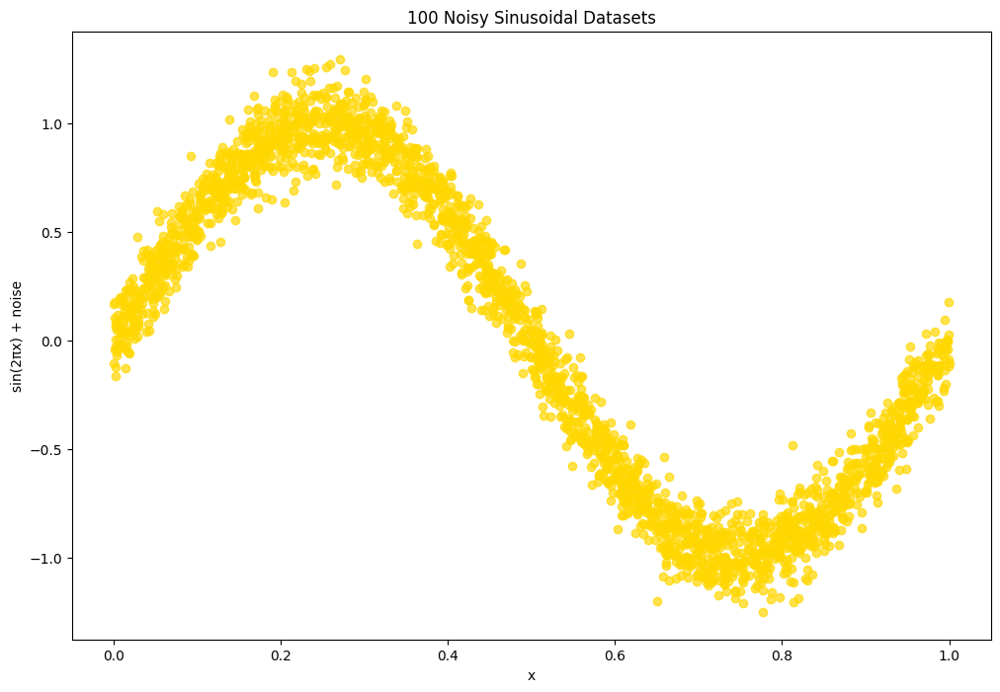

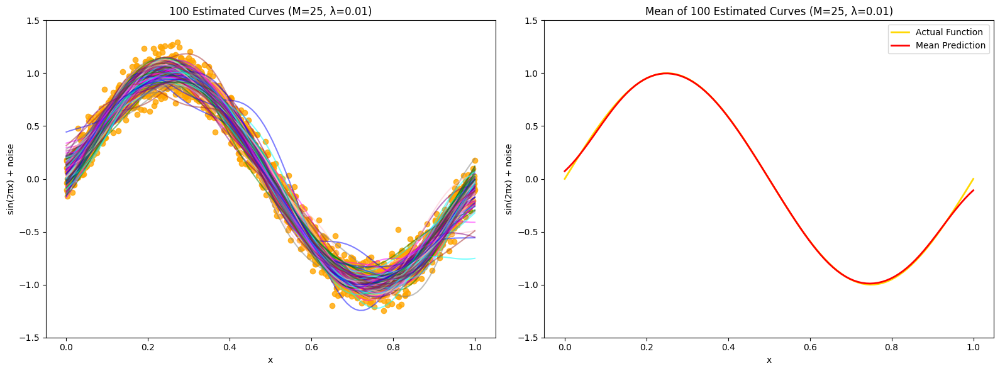

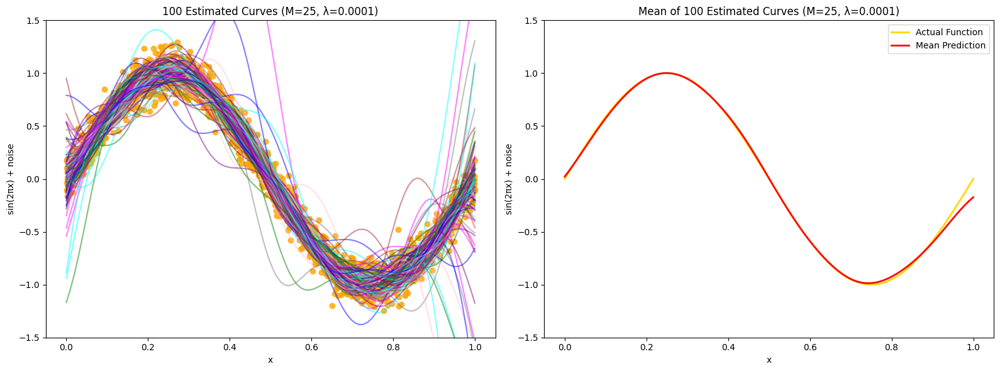

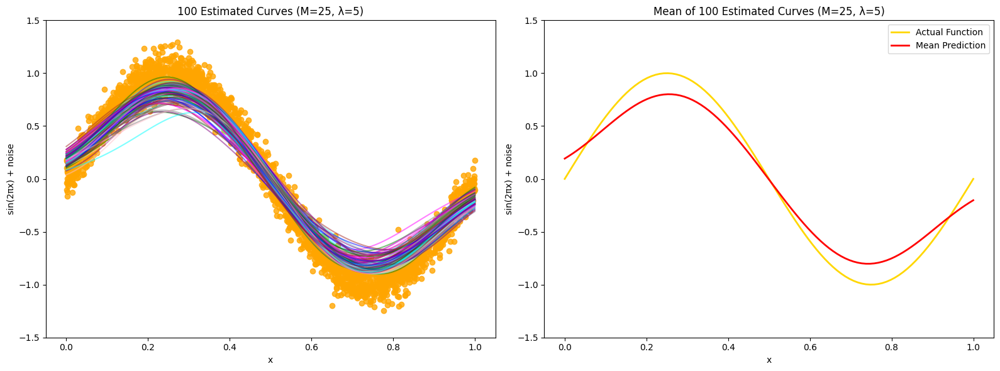

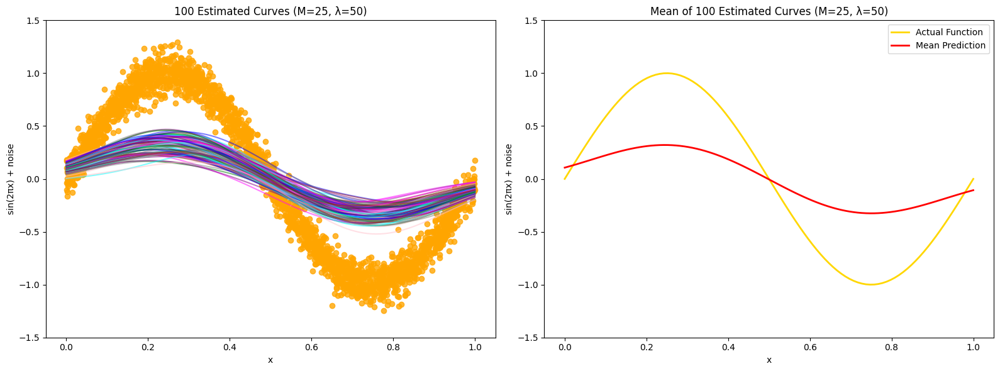

In [5]:
#Understanding the bias-variance trade-off
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################


# Generate noisy sinusoidal datasets
def gen_datasets(num_datasets, num_points):
    datasets = []
    for _ in range(num_datasets):
        x = np.random.uniform(0, 1, num_points)
        y = np.sin(2 * np.pi * x) + np.random.normal(0, 0.1, num_points)
        datasets.append((x, y))
    return datasets

########################################
#Use regularized least squares to estimate w
########################################

def gaussian_basis_functions(x, M, s=0.1):
    means = np.linspace(0, 1, M)
    basis = np.zeros((x.shape[0], M))

    for j in range(M):
        basis[:, j] = np.exp(-((x - means[j]) ** 2) / (2 * s ** 2))

    return np.column_stack([np.ones(x.shape[0]), basis])

# Fit regularized least squares model
def fit_model(X, Y, lamda):
    return np.linalg.inv(X.T @ X + lamda * np.eye(X.shape[1])) @ X.T @ Y


def actual_point_plot(datasets):
    plt.figure(figsize=(12, 8))
    for x, y in datasets:
        plt.scatter(x, y, color='gold', alpha=0.7)
    plt.xlabel('x')
    plt.ylabel('sin(2πx) + noise')
    plt.title('100 Noisy Sinusoidal Datasets')
    plt.show()




def plot_estimated_curves_and_mean(datasets, M, lamda):
    x_plot = np.linspace(0, 1, 100)
    X_plot = gaussian_basis_functions(x_plot, M)
    y_all = []

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Define a list of colors to cycle through
    colors = ['blue', 'green', 'purple', 'brown', 'pink', 'gray', 'cyan', 'magenta'] # set of clors to cycle through

    # Left subplot: All estimated curves
    for i, (x, y) in enumerate(datasets):
        X = gaussian_basis_functions(x, M)
        w = fit_model(X, y, lamda)
        y_plot = X_plot @ w
        axes[0].plot(x_plot, y_plot, color=colors[i % len(colors)], alpha=0.5)  # Cycle through colors

    for x, y in datasets:
        axes[0].scatter(x, y, color='orange', alpha=0.8)

    axes[0].set_xlabel('x')
    axes[0].set_ylabel('sin(2πx) + noise')
    axes[0].set_ylim(-1.5, 1.5)
    axes[0].set_title(f'100 Estimated Curves (M={M}, λ={lamda})')

    # Right subplot: Mean of estimated curves
    for x, y in datasets:
        X = gaussian_basis_functions(x, M)
        w = fit_model(X, y, lamda)
        y_plot = X_plot @ w
        y_all.append(y_plot)

    y_mean = np.mean(y_all, axis=0)

    axes[1].plot(x_plot, np.sin(2 * np.pi * x_plot), color='gold', label='Actual Function', linewidth=2)
    axes[1].plot(x_plot, y_mean, color='red', label='Mean Prediction', linewidth=2)
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('sin(2πx) + noise')
    axes[1].set_title(f'Mean of {len(datasets)} Estimated Curves (M={M}, λ={lamda})')
    axes[1].legend()
    axes[1].set_ylim(-1.5, 1.5)

    plt.tight_layout()
    plt.show()


# Generate datasets
datasets = gen_datasets(100, 25)
actual_point_plot( datasets)
plot_estimated_curves_and_mean(datasets, 25, 0.01)




########################################
#Illustrate the concept of Bias-Variance trade off
########################################
#1. Chose three different regularization coefficeints (low,middle and high)
#2. For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
#3. For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
#4. Using the six plots above, describe the bias-variance trade-off.


## lamda = [1e-04,1 ,50]

lamda = [1e-4,5 ,50]

for l in lamda:
    plot_estimated_curves_and_mean(datasets, 25, l)



<b> Report your observations </b>

1. when there is low regularization the model captures noise in training data , individual curves show significant oscillations and there is a large spread between different fits. model overfits the data.

2. when there is medium regularization , it is a balanced trade off , where the curves show moderate spread and the mean prediction closely follows true function
   also there is reduced oscillations in individual fits.

3. when there is hign regularization , individual curves cluster tightly and there is limited flexiility in fits
   mean prediction is smoother but deviates from the true function model underfits the data.


<b> Part - (6) : Understanding
Maximum a Posteriori (MAP) estimate </b>

(a). Generate 100 noisy data points of a sinusoid. Fit a $20^{th}$ order linear regression model with Gaussian basis functions. Starting from a standard normal prior, update the statistics of the posterior density of the parameters using Bayesian sequential updates.

(b). Sample a parameter vector from the posterior distribution, and obtain the curve fit for this realization. Repeat this for several times, and estimate the average of these curve fits, and compare it with the original sinusoid

(c). Use the posterior distribution of the parameters to evaluate the predictive distribution of target $p(t_{0}/x_{0},X,t)$, and plot it for different number of training data points, as discussed in the class.

(d). Report all your observations


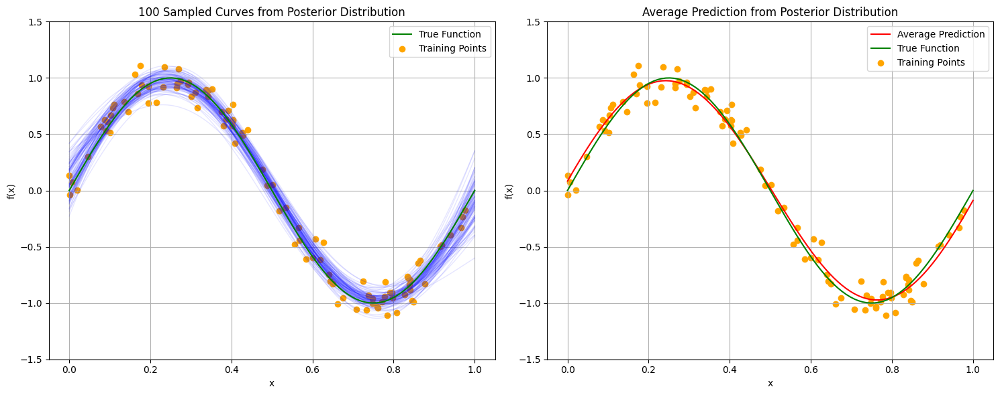

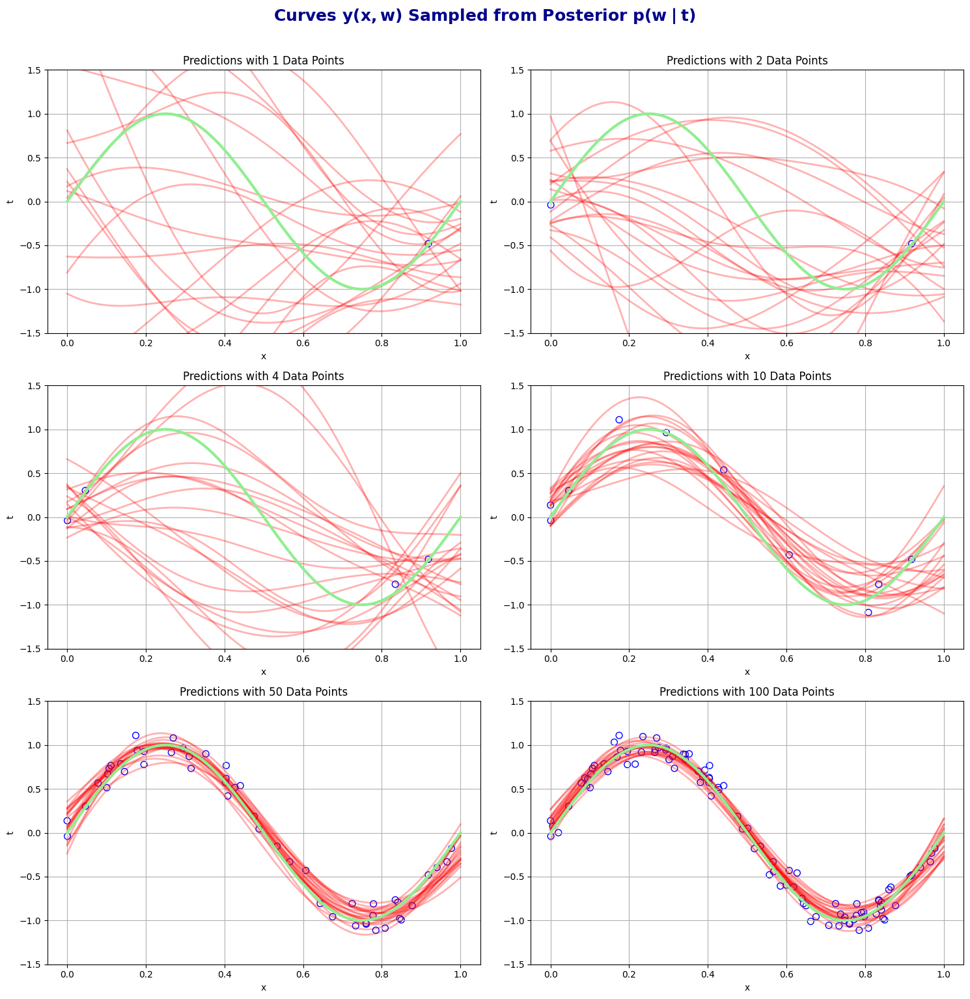

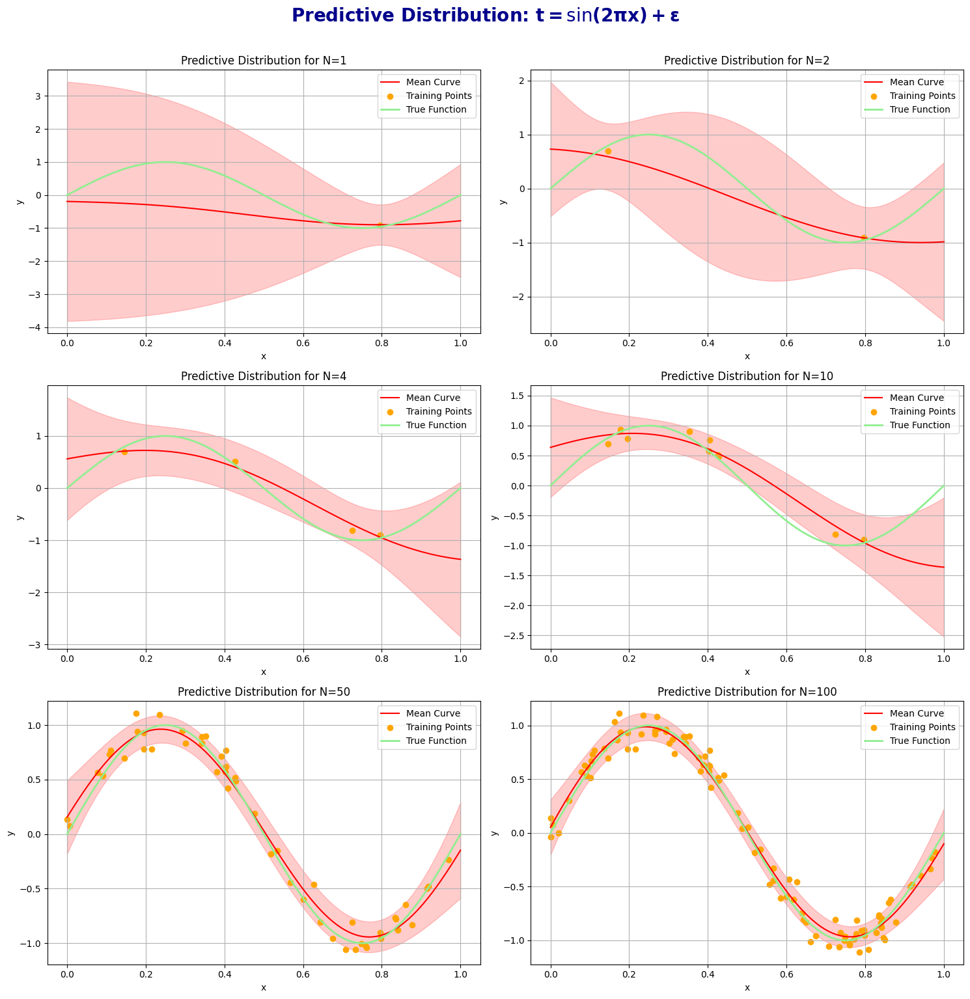

In [6]:
#Understanding MAP estimate
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################

def gen_datasets( num_points):

    x = np.random.uniform(0, 1, num_points)
    x.sort()
    y = np.sin(2 * np.pi * x) + np.random.normal(0, 0.1, num_points)

    return x,y

datasets_6  = gen_datasets(100)

def gaussian_kernel(x, mean, var):
    return np.exp(-((x - mean) ** 2) / (2 * var))

def gaussian_kernel_6_b_c(x, mean, var):
    x = x.reshape(-1, 1)  # (100, 1)
    mean = mean.reshape(1, -1)  # (1, 20)
    return np.exp(-((x - mean) ** 2) / (2 * var))




########################################
#Update the statistics of posterior density
########################################
#Initialie the parameters for standard normal prior
M = 20
alpha = 1
beta = 10
mean_6 = np.zeros((M + 1, 1))
var_6 = np.identity(M + 1)





#Iterate through the data points and update the stats of posterior density

for i in range(100):
    x = datasets_6[0][i]
    y = datasets_6[1][i]

    means = np.linspace(-1.5, 1.5, M)

    train_kernel = np.ones((1, 1))
    means = np.linspace(-1.5, 1.5, M)
    X , Mei = np.meshgrid(x, means)
    tempi = gaussian_kernel(X, Mei, 0.1)
    # train_kernel = np.column_stack([train_kernel, tempi]).T
    train_kernel = np.vstack([np.ones((1, 1)), tempi.reshape(-1, 1)])
    x= np.array([x])
    y = np.array([y])
    x = np.reshape(x, (1, 1))


    mean_x = mean_6
    var_x = var_6
    var_6 = np.linalg.inv(np.linalg.inv(var_x) + beta * train_kernel @ train_kernel.T)
    mean_6 = np.dot(var_6, np.dot(np.linalg.inv(var_x), mean_x) + beta * train_kernel * y)


########################################
#Sample weight vector from posterior distribution. Estimate the curve, repeat the procedure for 100 times and get the avg fit
########################################
mean_6 = np.reshape(mean_6, (M + 1, ))
var_6 = np.diag(var_6) if len(var_6.shape) == 1 else var_6

from matplotlib.gridspec import GridSpec


x = np.linspace(0, 1, 100)
y_tru = np.sin(2 * np.pi * x)
Y_fin = []

for i in range(100):
    # Ensure mean_6 is a 1D array
    mean_vector = mean_6.flatten()

    # Ensure var_6 is a 2D array of shape (M+1, M+1)
    if len(var_6.shape) == 2:
        cov_matrix = var_6
    else:
        cov_matrix = np.diag(var_6)

    # Sample weights from multivariate normal distribution
    w = np.random.multivariate_normal(mean_vector, cov_matrix)

    # Generate kernel features
    kernel_features = gaussian_kernel(x[:, np.newaxis], np.linspace(-1.5, 1.5, M)[np.newaxis, :], 0.1)

    # Add bias term
    kernel_features = np.column_stack([np.ones_like(x), kernel_features])

    # Compute predictions
    y = kernel_features @ w
    Y_fin.append(y)

y_avg = np.mean(Y_fin, axis=0)

plt.figure(figsize=(15, 6))
gs = GridSpec(1, 2,width_ratios=[1, 1])

ax1 = plt.subplot(gs[0])

for i , y in enumerate(Y_fin):
    ax1.plot(x, y, color='blue', alpha=0.1, linewidth=1)
ax1.plot(x,y_tru, color='green', label='True Function')
ax1.scatter(datasets_6[0], datasets_6[1], color='orange', label='Training Points')
ax1.set_title('100 Sampled Curves from Posterior Distribution')
ax1.set_xlabel('x')
ax1.set_ylabel('f(x)')
ax1.set_ylim(-1.5, 1.5)
ax1.grid(True)
ax1.legend()

ax2 = plt.subplot(gs[1])
ax2.plot(x, y_avg, color='red', label='Average Prediction')
ax2.plot(x, y_tru, color='green', label='True Function')
ax2.scatter(datasets_6[0], datasets_6[1], color='orange', label='Training Points')
ax2.set_title('Average Prediction from Posterior Distribution')
ax2.set_xlabel('x')
ax2.set_ylabel('f(x)')
ax2.set_ylim(-1.5, 1.5)
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()


########################################
#Predictive distribution analysis
########################################
#Predictive distribution analysis through sampling
#Iterate through data points and sample weight vectors when partial data points are seen, and plot the curves

var_y = np.linalg.inv(alpha * np.identity(M + 1))
mean_y = np.zeros((M + 1, 1))

data_points = [1, 2, 4, 10, 50, 100]

shuffl_inds = np.random.permutation(100)
input_shuffl = datasets_6[0][shuffl_inds]
output_shuffl = datasets_6[1][shuffl_inds]

fig , axes = plt.subplots(3, 2, figsize=(15, 15))

for i, size in enumerate(data_points):
    row = i // 2
    col = i % 2

    var_y = np.linalg.inv(alpha * np.identity(M + 1))
    mean_y = np.zeros((M + 1, 1))

    for j in range(size):
        X_tra = gaussian_kernel_6_b_c(input_shuffl[j], np.linspace(-1.5, 1.5, M), 0.1)
        X_tra = np.vstack([np.ones((1, 1)), X_tra.reshape(-1, 1)])

        var_y_6 = var_y
        var_y = np.linalg.inv(np.linalg.inv(var_y_6) + beta * X_tra @ X_tra.T)
        mean_y = np.dot(var_y, np.dot(np.linalg.inv(var_y_6), mean_y) + beta * X_tra * output_shuffl[j])

    for i in range(20):
        w = np.random.multivariate_normal(mean_y.flatten(), var_y)
        X_test = np.linspace(0, 1, 100)
        means = np.linspace(-1.5, 1.5, M)

        kernel_features = gaussian_kernel_6_b_c(X_test, means, 0.1)
        X_test = np.column_stack([np.ones(100), kernel_features])
        y_pre = X_test @ w

        # Red sampled curves with transparency
        axes[row, col].plot(np.linspace(0,1,100), y_pre, color='red', alpha=0.3, linewidth=2)

    # Green true function
    axes[row,col].plot(np.linspace(0,1,100), np.sin(2 * np.pi * np.linspace(0,1,100)), color='lightgreen', linewidth=3)

    # Blue training points
    axes[row, col].scatter(input_shuffl[:size], output_shuffl[:size], facecolors='none', edgecolors='blue', s=50)

    axes[row, col].set_title(f'Predictions with {size} Data Points', fontsize=12)
    axes[row, col].set_xlabel('x')
    axes[row, col].set_ylabel('t')
    axes[row, col].set_ylim(-1.5, 1.5)
    axes[row, col].grid(True)


plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.suptitle(r'Curves $\mathbf{y(x, w)}$ Sampled from Posterior $\mathbf{p(w \mid t)}$', fontsize=18, fontweight='bold', color='darkblue', y=1.02)
plt.show()




#Predictive distribution analysis through variance
#Iterate through data points and obtain necessary plots as discussed in the class
# Create test points for visualization





M = 20
alpha = 1
beta = 10
mean_6 = np.zeros((M + 1, 1))
var_6 = np.identity(M + 1)


num_points = [1,2,4,10,50,100]

shuffled_inds = np.random.permutation(100)
input_shufl =  datasets_6[0][shuffled_inds]
output_shufl = datasets_6[1][shuffled_inds]

fig, axes = plt.subplots(3, 2, figsize=(15, 15))

for i, size in enumerate(num_points):
    row = i // 2
    col = i % 2

    var_z = np.linalg.inv(alpha * np.identity(M + 1) )
    mean_z = np.zeros((M + 1, 1))

    for i in range(size):
        X_tra = gaussian_kernel_6_b_c(input_shufl[i], np.linspace(-1.5, 1.5, M), 0.1)
        X_tra = np.vstack([np.ones((1, 1)), X_tra.reshape(-1, 1)])

        var_z_6 = var_z
        var_z = np.linalg.inv(np.linalg.inv(var_z_6) + beta * X_tra @ X_tra.T)
        mean_z = np.dot(var_z, np.dot(np.linalg.inv(var_z_6), mean_z) + beta * X_tra * output_shufl[i])

    sampl_curves= []
    for i in range(100):
        w = np.random.multivariate_normal(mean_z.flatten(), var_z)
        X_test = np.linspace(0, 1, 100)
        means = np.linspace(-1.5, 1.5, M)

        kernel_features = gaussian_kernel_6_b_c(X_test, means, 0.1)
        X_test = np.column_stack([np.ones(100), kernel_features])
        y = X_test @ w
        sampl_curves.append(y)

    sampl_curves = np.array(sampl_curves)
    mean_curves = np.mean(sampl_curves, axis=0)
    std_curves = np.std(sampl_curves, axis=0)

    axes[row, col].plot(np.linspace(0, 1, 100), mean_curves, color='red', label='Mean Curve')
    axes[row, col].fill_between(np.linspace(0, 1, 100), mean_curves - 2 * std_curves, mean_curves + 2 * std_curves, color='red', alpha=0.2)
    axes[row, col].scatter(input_shufl[:size], output_shufl[:size], color='orange', label='Training Points')
    axes[row, col].plot(np.linspace(0, 1, 100), np.sin(2 * np.pi * np.linspace(0, 1, 100)), color='lightgreen', label='True Function',linewidth=2)
    axes[row, col].set_title(f'Predictive Distribution for N={size}')
    axes[row, col].set_xlabel('x')
    axes[row, col].set_ylabel('y')
    axes[row, col].legend()
    axes[row, col].grid(True)

plt.tight_layout(rect = [0,0,1,0.98])
plt.suptitle(r'Predictive Distribution: $\mathbf{t = \sin(2\pi x) + \epsilon}$', fontsize=20, fontweight='bold', color='darkblue', y=1.02)

plt.show()

<b> Report your observations </b>

1. We start with the standard normal prior and they are gradually updated through bayesian sequential updates . The posterior becomes more concentrated with the increase in the numbe rof data points.

2.The mean prediction closely follows the true sinusoid which comes form the mean of the 100 curves . This is smoother than individual samples.

3. A the number of data points visible increases :
   - few data points : there are wide confidence bands and high uncertainity in predictions this leads to a poor fit to the true function.
   - Medium data points : the confidence bands get narrower , better aligning with the true sinusoid
   - Many data points : There are tighter confidence intervals near all the data points and there is an excellent fit to true function and appropriate uncertainity in places where there are gaps in between data.
